# ASSIGNMENT 2 on AUTO ML by Shreeanant Bharadwaj

## Abstract

This notebook employs AutoML, specifically utilizing the H2O library, to analyze the Health Supplier dataset. The study begins by deliberately introducing errors in the modeling process to highlight the significance of meticulously examining model outputs. Initially, the Generalized Linear Model (GLM) and Gradient Boosting Machine (GBM) methods are employed. Subsequently, the AutoML approach is implemented to leverage its automated model selection and hyperparameter optimization capabilities. Through this iterative process, the research underscores the importance of scrutinizing model outputs and demonstrates how AutoML tools can streamline and enhance the modeling workflow while emphasizing the necessity of careful validation and interpretation of results. This study contributes to advancing the understanding of both healthcare analytics and the utilization of AutoML methodologies in healthcare research and practice.

## Dataset Information

Rfrg_Prvdr_Geo_Lvl: Referring Provider Geographic Level (e.g., National)

Rfrg_Prvdr_Geo_Cd: Referring Provider Geographic Code

Rfrg_Prvdr_Geo_Desc: Referring Provider Geographic Description

BETOS_Lvl: BETOS Level (Berenson-Eggers Type of Service)

BETOS_Cd: BETOS Code

BETOS_Desc: BETOS Description

HCPCS_Cd: Healthcare Common Procedure Coding System Code

HCPCS_Desc: HCPCS Description

Suplr_Rentl_Ind: Supplier Rental Indicator (N for No)

Tot_Rfrg_Prvdrs: Total Referring Providers

Tot_Suplrs: Total Suppliers

Tot_Suplr_Benes: Total Supplier Beneficiaries

Tot_Suplr_Clms: Total Supplier Claims

Tot_Suplr_Srvcs: Total Supplier Services

Avg_Suplr_Sbmtd_Chrg: Average Supplier Submitted Charge

Avg_Suplr_Mdcr_Alowd_Amt: Average Supplier Medicare Allowed Amount.

Avg_Suplr_Mdcr_Pymt_Amt: Average Supplier Medicare Payment Amount

Avg_Suplr_Mdcr_Stdzd_Amt: Average Supplier Medicare Standardized Amount

## Peforming EDA on the dataset

In [3]:
#Importing libraries and the dataset
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
np.random.seed(0)
data = pd.read_csv('healthsupplier_2017_deleted.csv')

In [4]:
#Step 1 : To get the basic idea of the dataset we will print first few rows
data.head()

,Rfrg_Prvdr_Geo_Lvl,Rfrg_Prvdr_Geo_Cd,Rfrg_Prvdr_Geo_Desc,BETOS_Lvl,BETOS_Cd,BETOS_Desc,HCPCS_Cd,HCPCS_Desc,Suplr_Rentl_Ind,Tot_Rfrg_Prvdrs,Tot_Suplrs,Tot_Suplr_Benes,Tot_Suplr_Clms,Tot_Suplr_Srvcs,Avg_Suplr_Sbmtd_Chrg,Avg_Suplr_Mdcr_Alowd_Amt,Avg_Suplr_Mdcr_Pymt_Amt,Avg_Suplr_Mdcr_Stdzd_Amt
0,National,NaN,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4034,"Enteral feeding supply kit; syringe fed, per d...",N,28183.0,1745.0,33451.0,171371.0,4627387.0,58.266520,3.718512,2.918066,3.047039
1,National,NaN,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4035,"Enteral feeding supply kit; pump fed, per day,...",N,27342.0,1758.0,39110.0,271836.0,7050743.0,75.495042,6.433860,5.067509,5.552222
2,National,NaN,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4036,"Enteral feeding supply kit; gravity fed, per d...",N,6166.0,933.0,7171.0,41181.0,1116382.0,75.172639,5.036933,3.959289,4.100195
3,National,NaN,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4081,Nasogastric tubing with stylet,N,14.0,12.0,13.0,20.0,33.0,113.736061,17.292727,13.833939,13.579697
4,National,NaN,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4082,Nasogastric tubing without stylet,N,16.0,16.0,16.0,21.0,43.0,99.110930,12.532093,9.502326,9.463488


**Categorical Columns** :

'Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc','BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc',                         'HCPCS_Cd', 'HCPCS_Desc','Suplr_Rentl_Ind'

**Numerical Columns**   :

'Tot_Rfrg_Prvdrs','Tot_Suplrs','Tot_Suplr_Benes','Tot_Suplr_Clms','Tot_Suplr_Srvcs','Avg_Suplr_Sbmtd_Chrg','Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Pymt_Amt','Avg_Suplr_Mdcr_Stdzd_Amt

In [5]:
#Now we will see categorical and numerical columns of the dataset:
data.dtypes

Rfrg_Prvdr_Geo_Lvl           object
Rfrg_Prvdr_Geo_Cd           float64
Rfrg_Prvdr_Geo_Desc          object
BETOS_Lvl                    object
BETOS_Cd                     object
BETOS_Desc                   object
HCPCS_Cd                     object
HCPCS_Desc                   object
Suplr_Rentl_Ind              object
Tot_Rfrg_Prvdrs             float64
Tot_Suplrs                  float64
Tot_Suplr_Benes             float64
Tot_Suplr_Clms              float64
Tot_Suplr_Srvcs             float64
Avg_Suplr_Sbmtd_Chrg        float64
Avg_Suplr_Mdcr_Alowd_Amt    float64
Avg_Suplr_Mdcr_Pymt_Amt     float64
Avg_Suplr_Mdcr_Stdzd_Amt    float64
dtype: object

In [6]:
data.columns


Index(['Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc',
       'BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc', 'HCPCS_Cd', 'HCPCS_Desc',
       'Suplr_Rentl_Ind', 'Tot_Rfrg_Prvdrs', 'Tot_Suplrs', 'Tot_Suplr_Benes',
       'Tot_Suplr_Clms', 'Tot_Suplr_Srvcs', 'Avg_Suplr_Sbmtd_Chrg',
       'Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Pymt_Amt',
       'Avg_Suplr_Mdcr_Stdzd_Amt'],
      dtype='object')

In [7]:
#Now to get the statistical data of the dataset
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Rfrg_Prvdr_Geo_Cd,3299.0,3.601697,1.829831e+00,1.000000,2.000000,4.000000,5.000000,6.000000e+00
Tot_Rfrg_Prvdrs,4999.0,1990.283857,1.090878e+04,1.000000,18.000000,68.000000,361.000000,2.337620e+05
Tot_Suplrs,4999.0,304.647930,1.726266e+03,1.000000,8.000000,24.000000,93.000000,4.351100e+04
Tot_Suplr_Benes,4514.0,7559.072884,6.766846e+04,11.000000,34.000000,127.000000,820.500000,1.891407e+06
Tot_Suplr_Clms,4999.0,18760.662533,1.853700e+05,11.000000,41.000000,179.000000,1335.000000,6.414962e+06
Tot_Suplr_Srvcs,4999.0,481820.856971,1.117940e+07,11.000000,69.000000,492.000000,7167.500000,7.279081e+08
Avg_Suplr_Sbmtd_Chrg,4999.0,685.970610,2.219673e+03,0.072747,22.446201,104.680000,457.532054,4.918412e+04
Avg_Suplr_Mdcr_Alowd_Amt,4999.0,408.694022,1.432291e+03,0.013867,10.300600,51.273333,247.399774,3.807351e+04
Avg_Suplr_Mdcr_Pymt_Amt,4999.0,322.337127,1.135201e+03,0.010614,7.773472,39.511853,190.333860,3.045881e+04
Avg_Suplr_Mdcr_Stdzd_Amt,4999.0,313.888316,1.103483e+03,0.010409,7.777273,39.086111,185.413517,2.845597e+04


In [8]:
#Checking for null values
data.isnull().sum()

Rfrg_Prvdr_Geo_Lvl          2085
Rfrg_Prvdr_Geo_Cd           3785
Rfrg_Prvdr_Geo_Desc         2085
BETOS_Lvl                   2085
BETOS_Cd                    2085
BETOS_Desc                  2085
HCPCS_Cd                    2085
HCPCS_Desc                  2085
Suplr_Rentl_Ind             2085
Tot_Rfrg_Prvdrs             2085
Tot_Suplrs                  2085
Tot_Suplr_Benes             2570
Tot_Suplr_Clms              2085
Tot_Suplr_Srvcs             2085
Avg_Suplr_Sbmtd_Chrg        2085
Avg_Suplr_Mdcr_Alowd_Amt    2085
Avg_Suplr_Mdcr_Pymt_Amt     2085
Avg_Suplr_Mdcr_Stdzd_Amt    2085
dtype: int64

In [9]:
#removing all the null values from the dataset
clean_data = data.isnull().dropna()
clean_data.isnull().sum()

Rfrg_Prvdr_Geo_Lvl          0
Rfrg_Prvdr_Geo_Cd           0
Rfrg_Prvdr_Geo_Desc         0
BETOS_Lvl                   0
BETOS_Cd                    0
BETOS_Desc                  0
HCPCS_Cd                    0
HCPCS_Desc                  0
Suplr_Rentl_Ind             0
Tot_Rfrg_Prvdrs             0
Tot_Suplrs                  0
Tot_Suplr_Benes             0
Tot_Suplr_Clms              0
Tot_Suplr_Srvcs             0
Avg_Suplr_Sbmtd_Chrg        0
Avg_Suplr_Mdcr_Alowd_Amt    0
Avg_Suplr_Mdcr_Pymt_Amt     0
Avg_Suplr_Mdcr_Stdzd_Amt    0
dtype: int64

In [10]:
#Getting statitical summary of the clean data
clean_data.describe().transpose()

,count,unique,top,freq
Rfrg_Prvdr_Geo_Lvl,7084,2,False,4999
Rfrg_Prvdr_Geo_Cd,7084,2,True,3785
Rfrg_Prvdr_Geo_Desc,7084,2,False,4999
BETOS_Lvl,7084,2,False,4999
BETOS_Cd,7084,2,False,4999
BETOS_Desc,7084,2,False,4999
HCPCS_Cd,7084,2,False,4999
HCPCS_Desc,7084,2,False,4999
Suplr_Rentl_Ind,7084,2,False,4999
Tot_Rfrg_Prvdrs,7084,2,False,4999


**Conclusion from above**

As after dropping the rows we are losing a lot of information we will rather impute the missing values:

**Imputation**

For Numerical Columns we will be using Mean Imputation

and for Categorical Columns we will be using Mode Imputation

In [12]:
# Replace missing values with mean for numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in numerical_columns:
    data[col].fillna(data[col].mean(), inplace=True)

# Replace missing values with mode for categorical columns
categorical_columns = data.select_dtypes(include=['object']).columns.tolist()
for col in categorical_columns:
    data[col].fillna(data[col].mode()[0], inplace=True)

In [ ]:
#Checking for missing values after imputation
data.isnull().sum()

**Conclusion from above**

As we can see after using Mode imputation for categorical columns and mean imputation for the numerical columns  there are no missing values

## Visualizing the Dataset

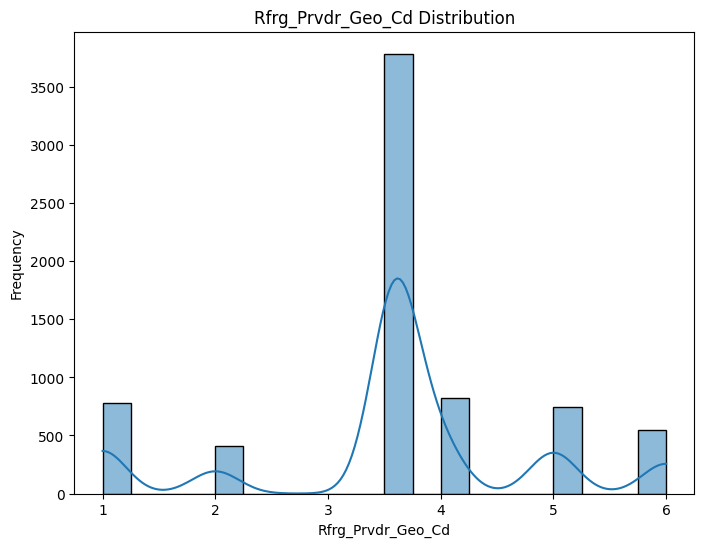

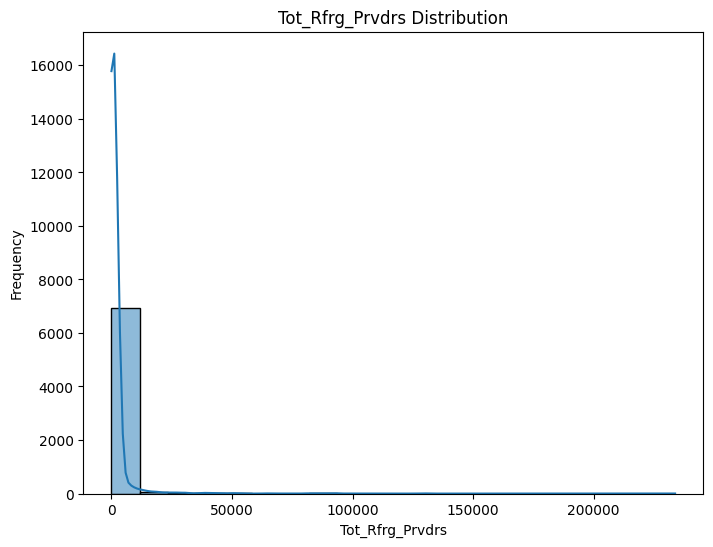

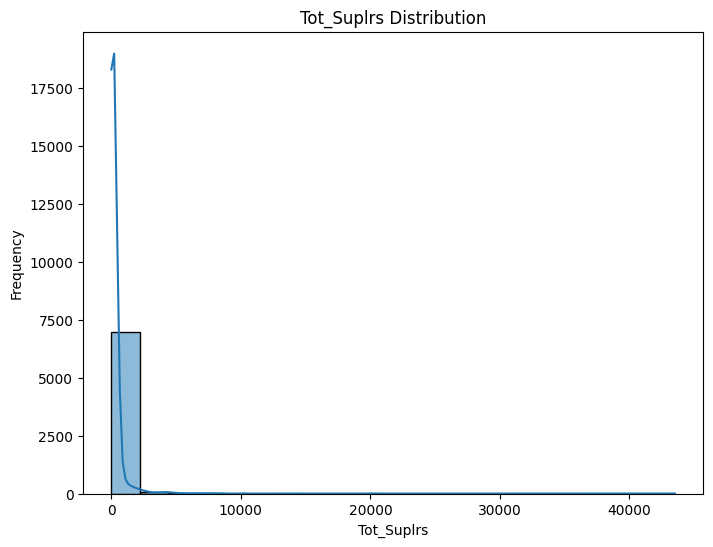

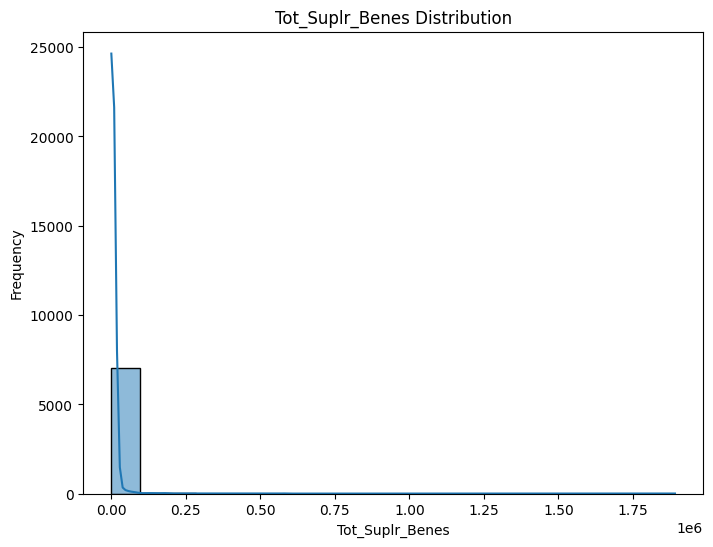

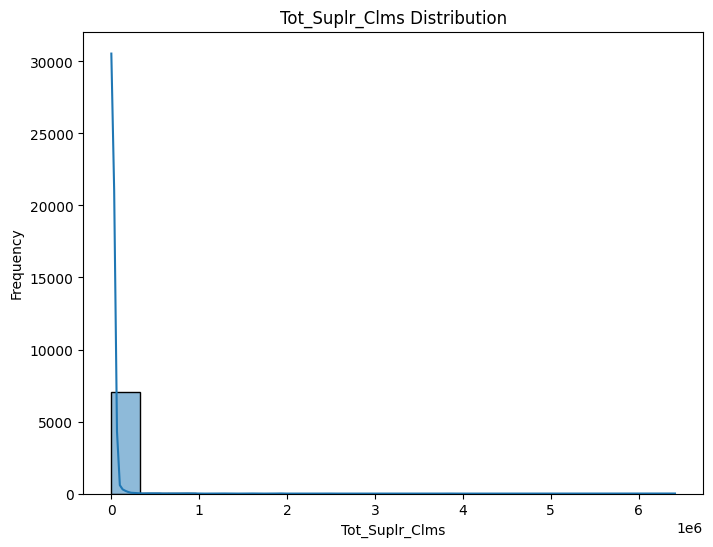

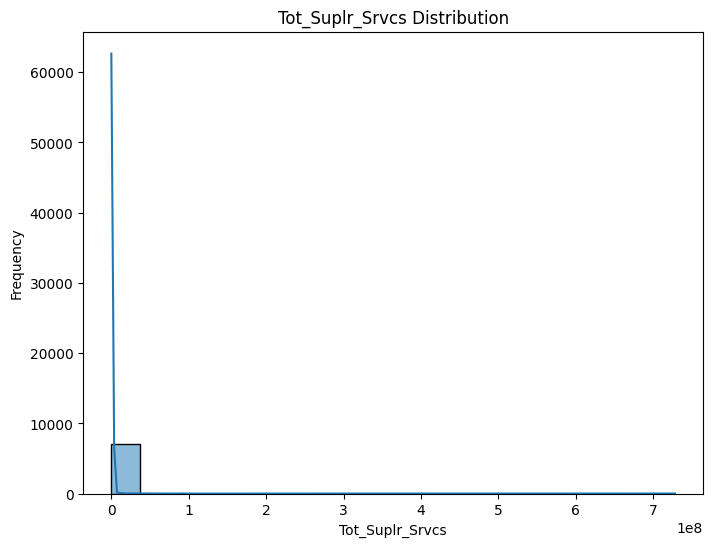

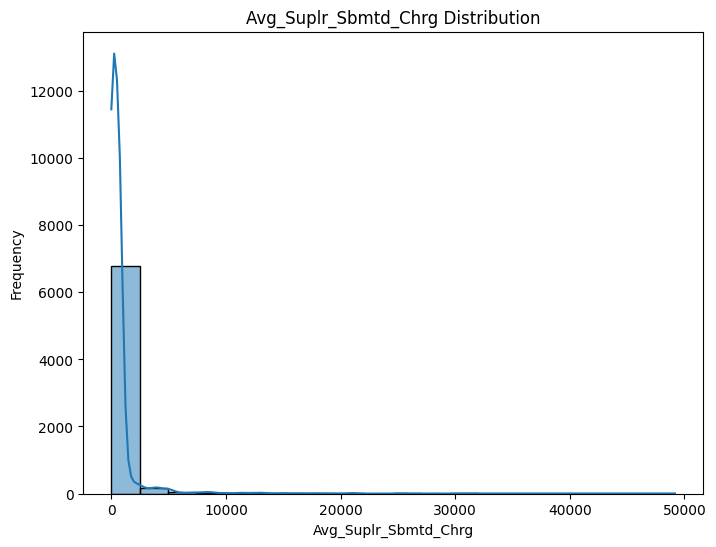

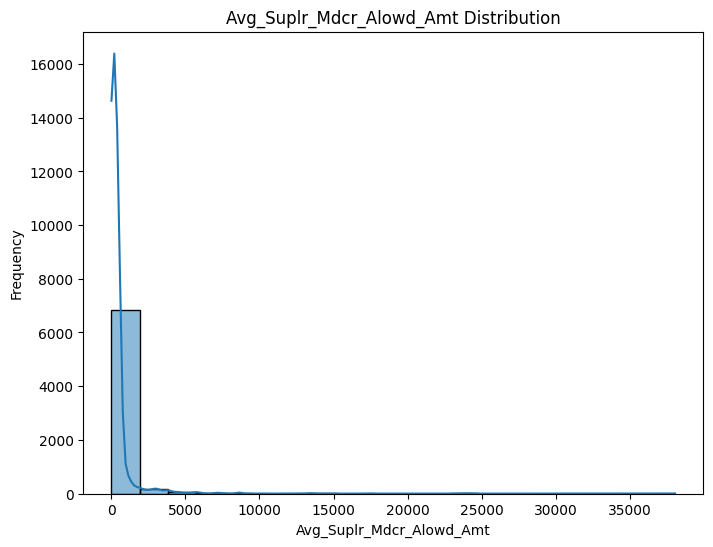

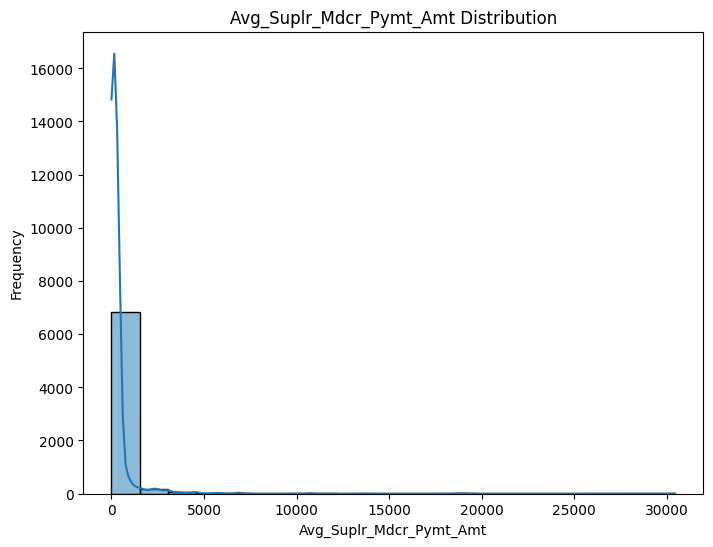

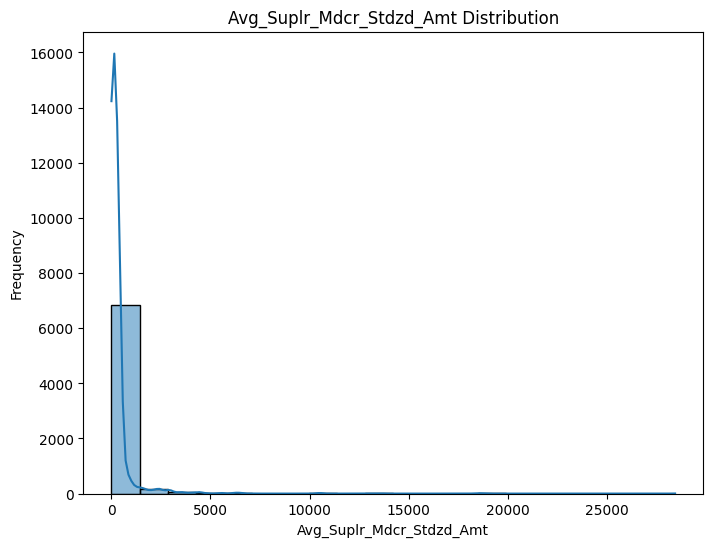

In [13]:
# Histograms for numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[col], bins=20, kde=True)
    plt.title(col + ' Distribution')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

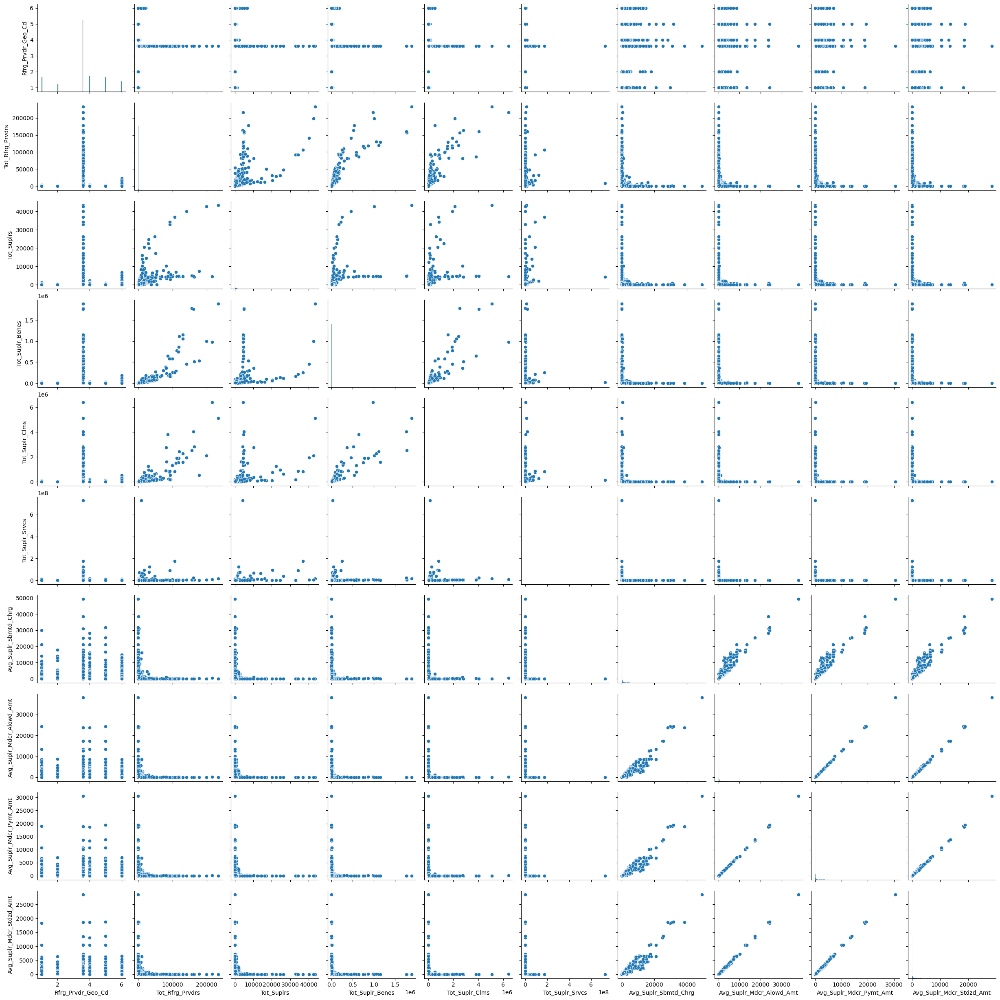

<ipython-input-14-d9cd54477ba5>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


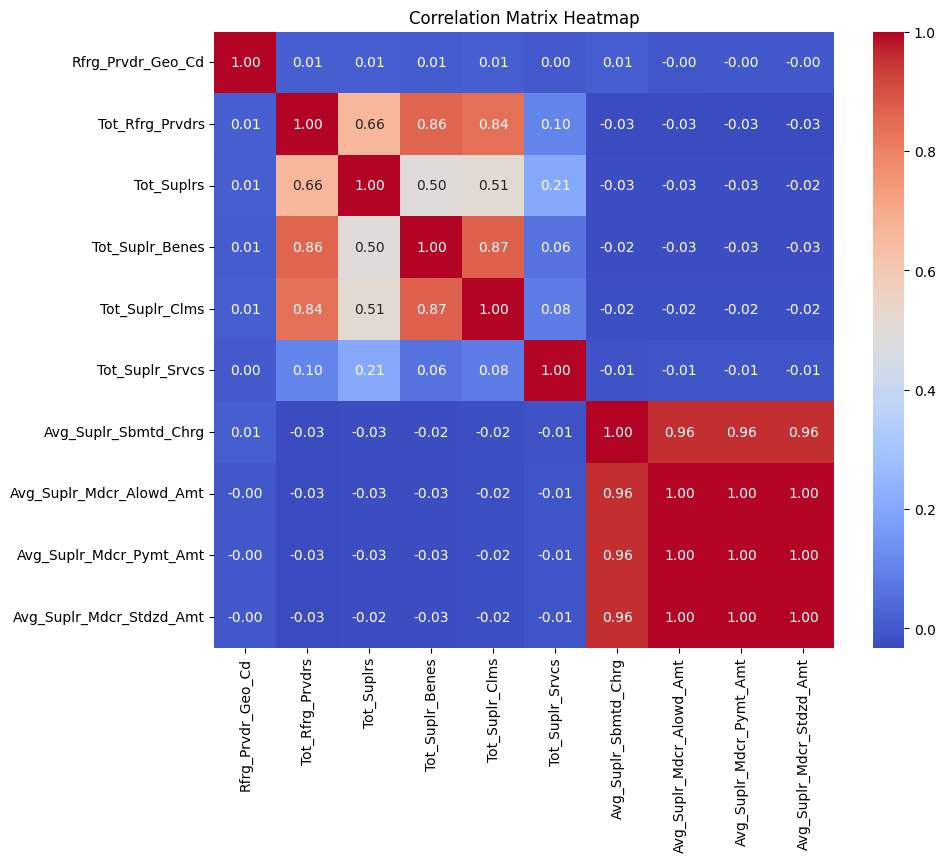

In [14]:
# Pairplot for numerical columns
sns.pairplot(data[numerical_columns])
plt.show()

# Correlation matrix heatmap for numerical columns
correlation_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

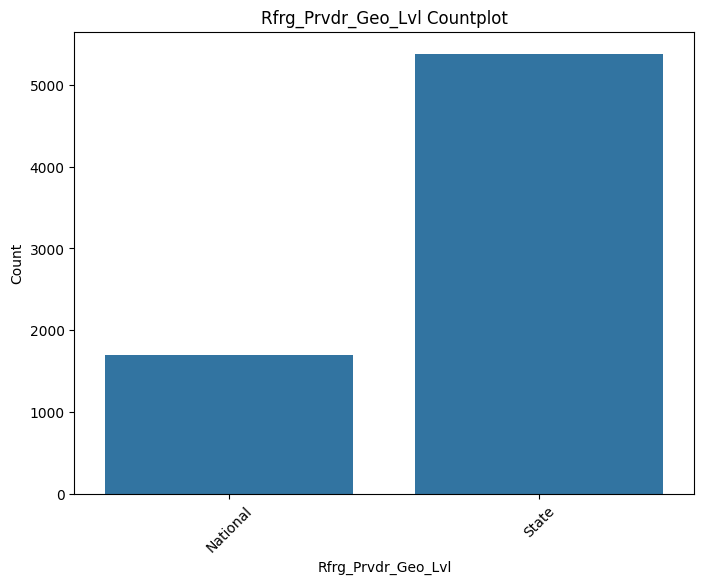

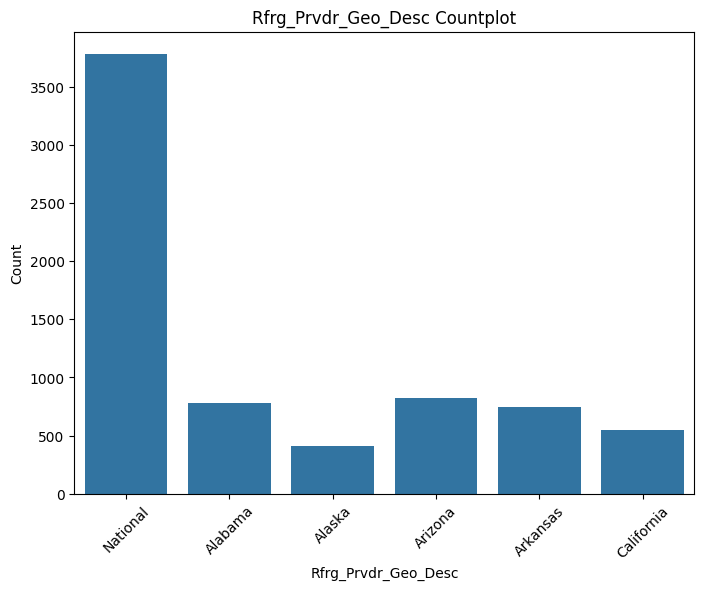

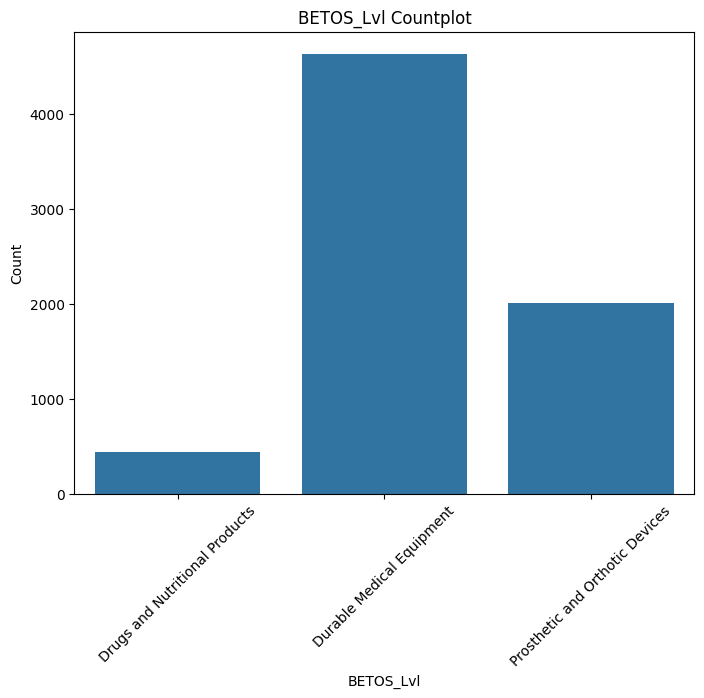

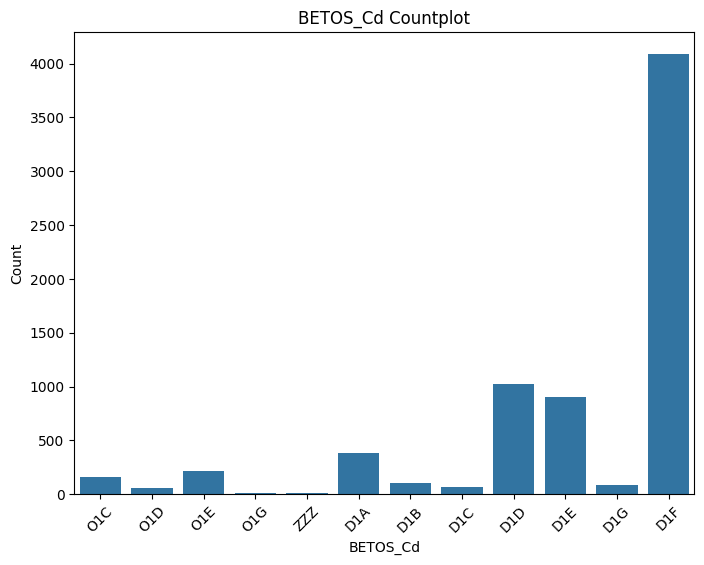

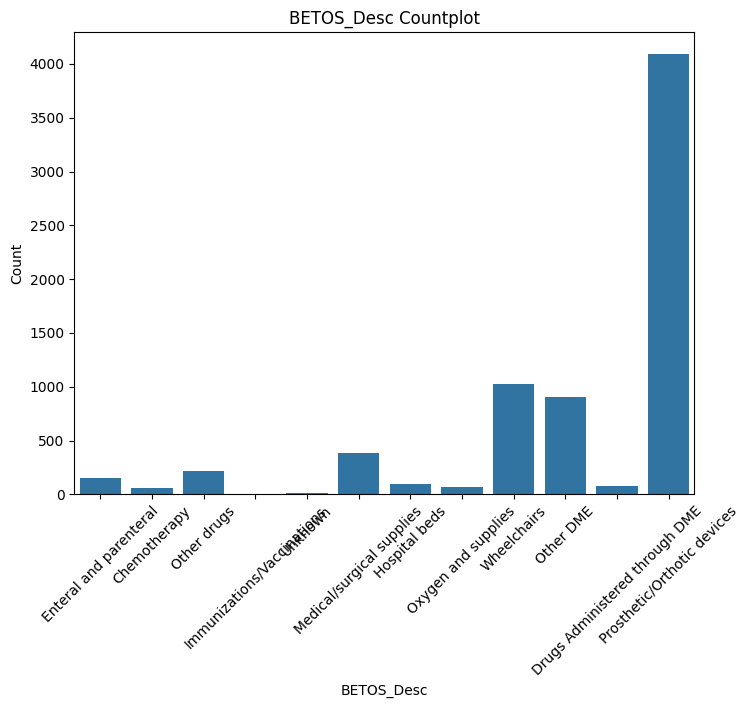

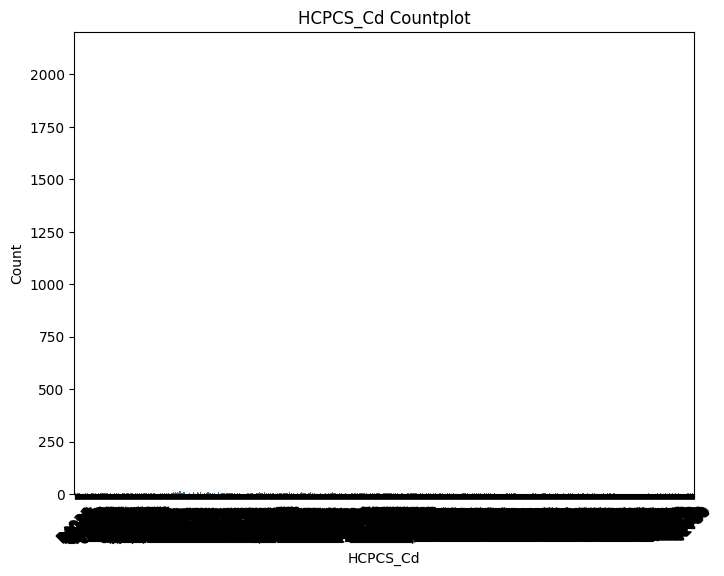

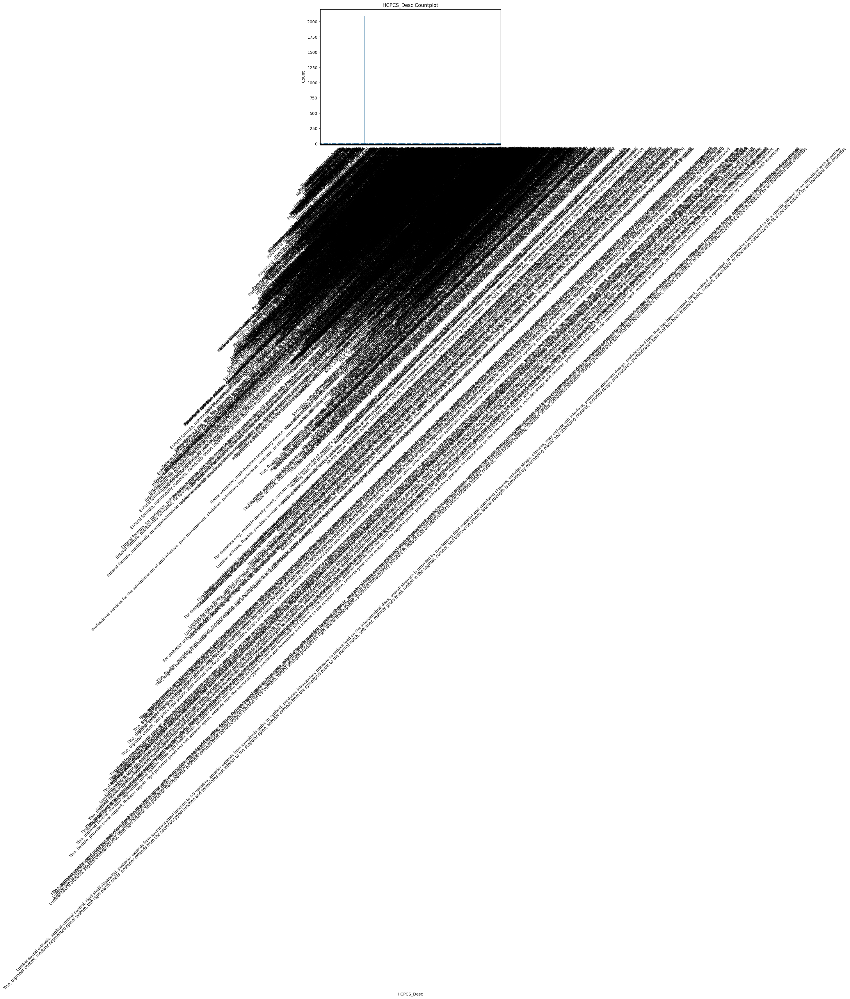

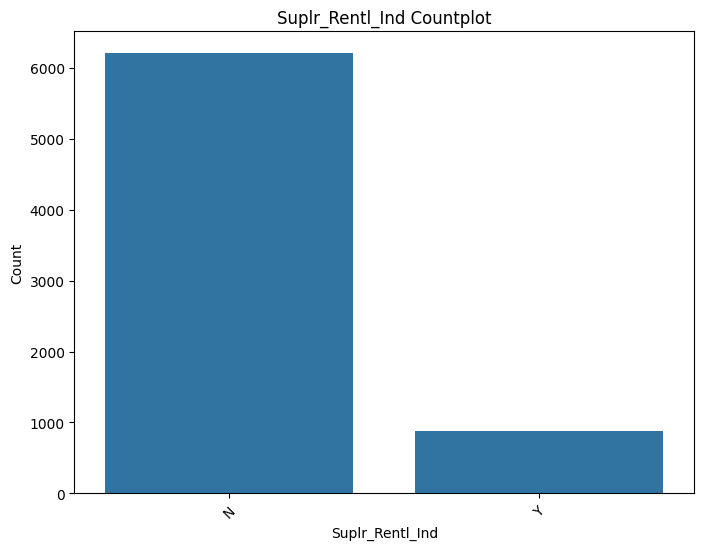

In [15]:
# Count plots for categorical columns
categorical_columns = data.select_dtypes(include=['object']).columns.tolist()
for col in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=data, x=col)
    plt.title(col + ' Countplot')
    plt.xticks(rotation=45)
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

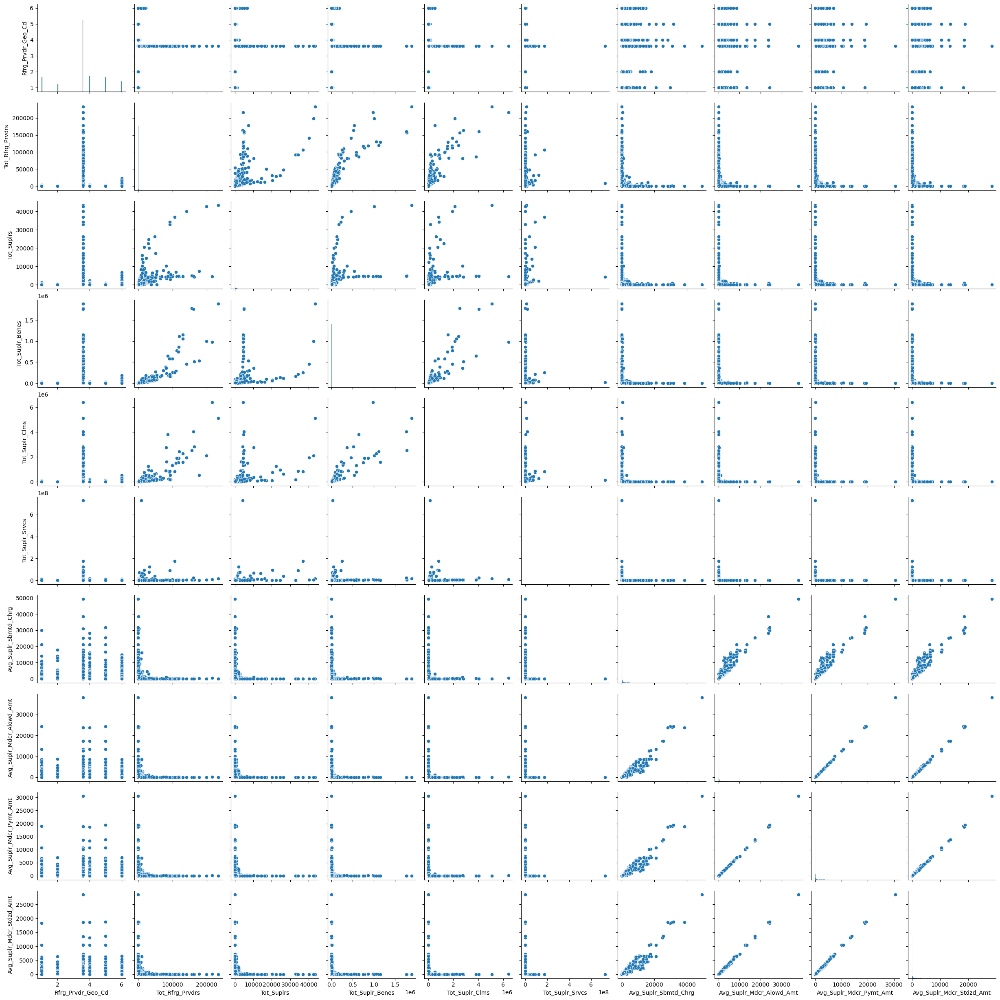

<ipython-input-16-d9cd54477ba5>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


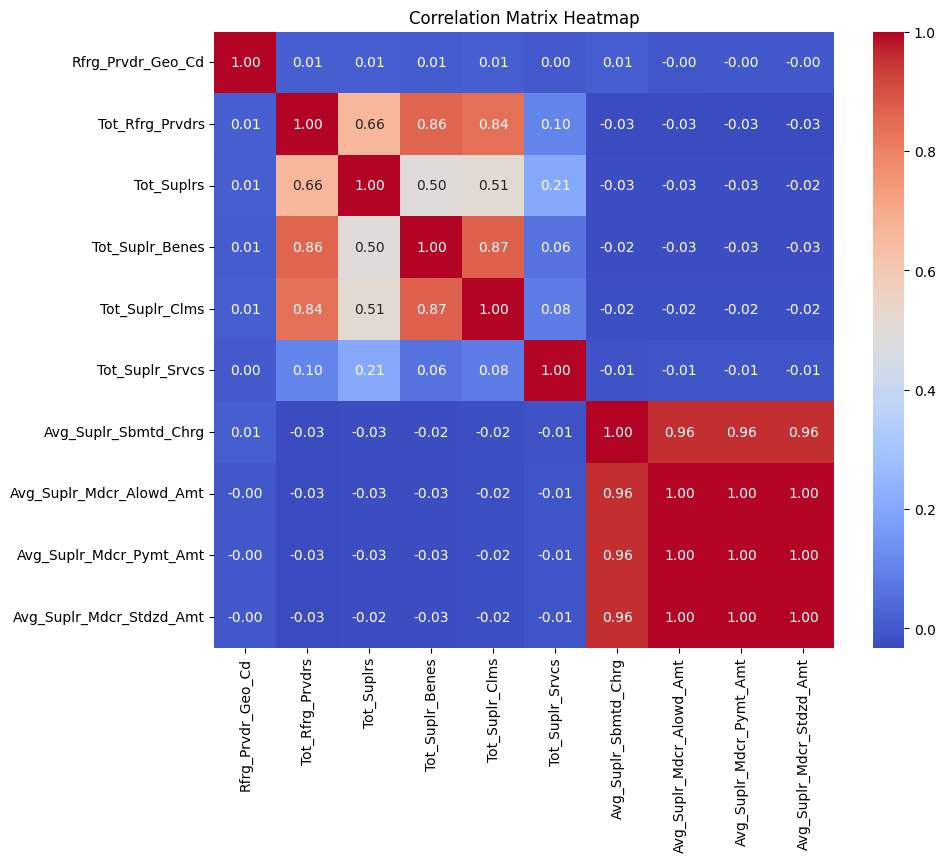

In [16]:
# Pairplot for numerical columns
sns.pairplot(data[numerical_columns])
plt.show()

# Correlation matrix heatmap for numerical columns
correlation_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()


In [21]:
# seprating numerical columns from the dataset
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Creating a new dataset with only numerical columns
numerical_data = data[numerical_columns]

# Computing the correlation matrix
correlation_matrix = numerical_data.corr()
correlation_matrix

,Rfrg_Prvdr_Geo_Cd,Tot_Rfrg_Prvdrs,Tot_Suplrs,Tot_Suplr_Benes,Tot_Suplr_Clms,Tot_Suplr_Srvcs,Avg_Suplr_Sbmtd_Chrg,Avg_Suplr_Mdcr_Alowd_Amt,Avg_Suplr_Mdcr_Pymt_Amt,Avg_Suplr_Mdcr_Stdzd_Amt
Rfrg_Prvdr_Geo_Cd,1.000000,0.012949,0.009652,0.007698,0.008215,0.001988,0.010040,-0.004512,-0.003688,-0.003157
Tot_Rfrg_Prvdrs,0.012949,1.000000,0.657583,0.862331,0.836599,0.103136,-0.031812,-0.032323,-0.032264,-0.032055
Tot_Suplrs,0.009652,0.657583,1.000000,0.496347,0.509049,0.206689,-0.027468,-0.025077,-0.025052,-0.024806
Tot_Suplr_Benes,0.007698,0.862331,0.496347,1.000000,0.870765,0.060662,-0.024917,-0.025296,-0.025266,-0.025125
Tot_Suplr_Clms,0.008215,0.836599,0.509049,0.870765,1.000000,0.084242,-0.022189,-0.023678,-0.023665,-0.023538
Tot_Suplr_Srvcs,0.001988,0.103136,0.206689,0.060662,0.084242,1.000000,-0.013047,-0.012151,-0.012094,-0.012111
Avg_Suplr_Sbmtd_Chrg,0.010040,-0.031812,-0.027468,-0.024917,-0.022189,-0.013047,1.000000,0.959143,0.959305,0.958165
Avg_Suplr_Mdcr_Alowd_Amt,-0.004512,-0.032323,-0.025077,-0.025296,-0.023678,-0.012151,0.959143,1.000000,0.999884,0.999135
Avg_Suplr_Mdcr_Pymt_Amt,-0.003688,-0.032264,-0.025052,-0.025266,-0.023665,-0.012094,0.959305,0.999884,1.000000,0.999178
Avg_Suplr_Mdcr_Stdzd_Amt,-0.003157,-0.032055,-0.024806,-0.025125,-0.023538,-0.012111,0.958165,0.999135,0.999178,1.000000


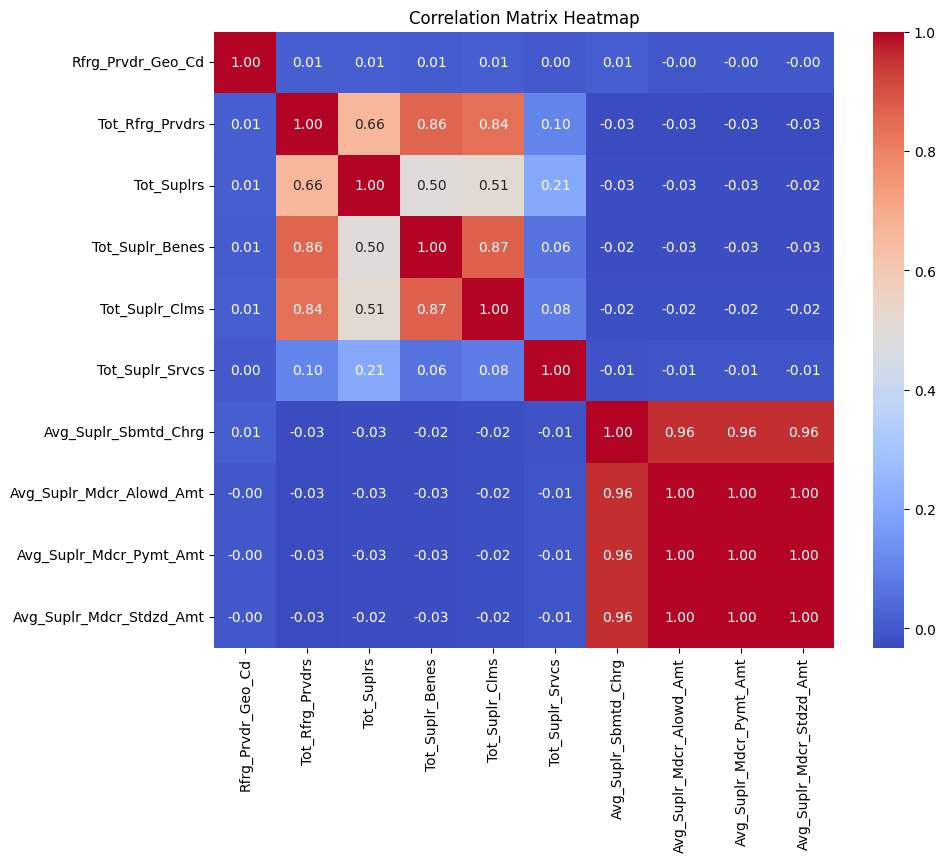

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'correlation_matrix' is your correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

**Conclusion from Above**

As from above we can clearly see that the values in our dataset are not suitable to peform any ML algorithm and are not suitable to peform any fucntion so we have to normalize the dataset

In [23]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import pandas as pd

# Assuming 'data' is your original dataset containing numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Creating a new dataset with only numerical columns
numerical_data = data[numerical_columns]

# Performing Min-Max normalization
min_max_scaler = MinMaxScaler()
min_max_scaled_data = pd.DataFrame(min_max_scaler.fit_transform(numerical_data), columns=numerical_columns)

# Performing Z-score scaling (Standardization)
z_score_scaler = StandardScaler()
z_score_scaled_data = pd.DataFrame(z_score_scaler.fit_transform(numerical_data), columns=numerical_columns)

# Saving the new datasets to new files
min_max_scaled_data.to_csv('min_max_scaled_data.csv', index=False)
z_score_scaled_data.to_csv('z_score_scaled_data.csv', index=False)


Now are dataset has been normalised but we still need to pefrom z score scaling

In [24]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assuming 'data' is your original dataset containing numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Create a StandardScaler object
scaler = StandardScaler()

# Apply Z-score scaling to the numerical columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

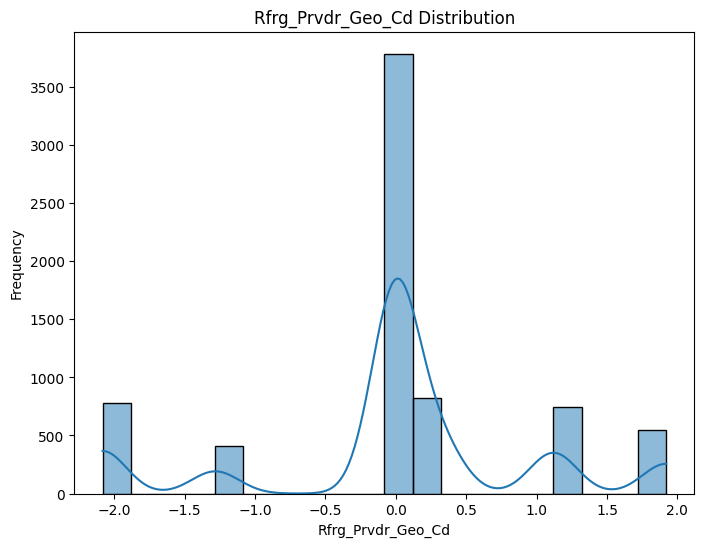

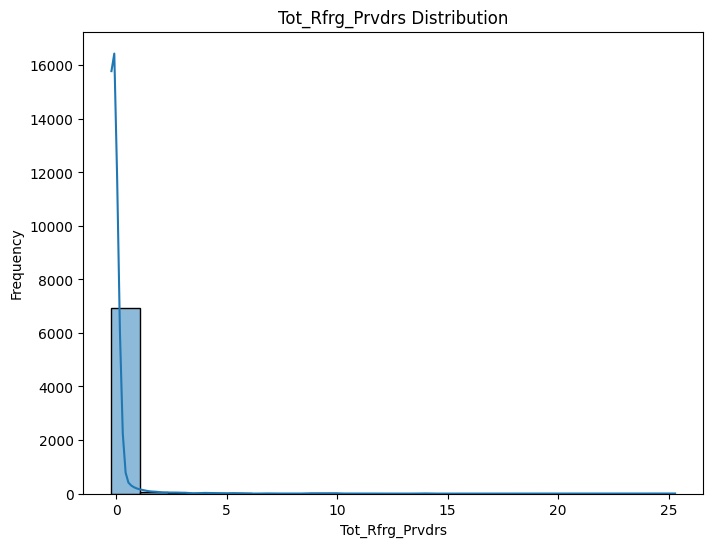

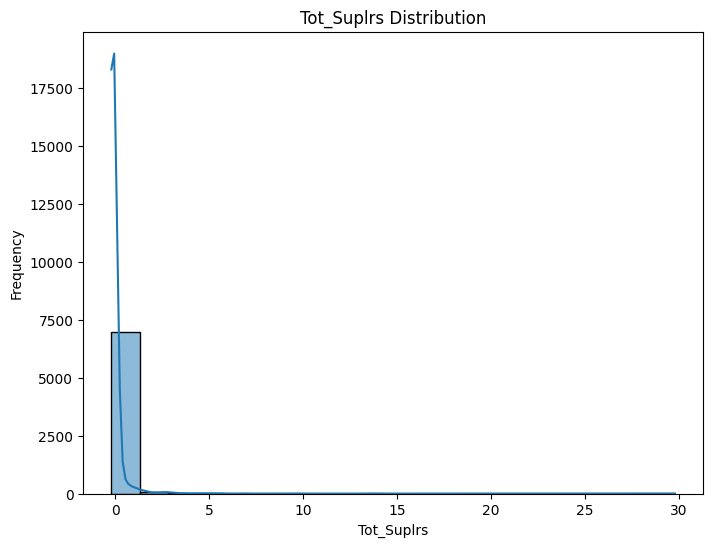

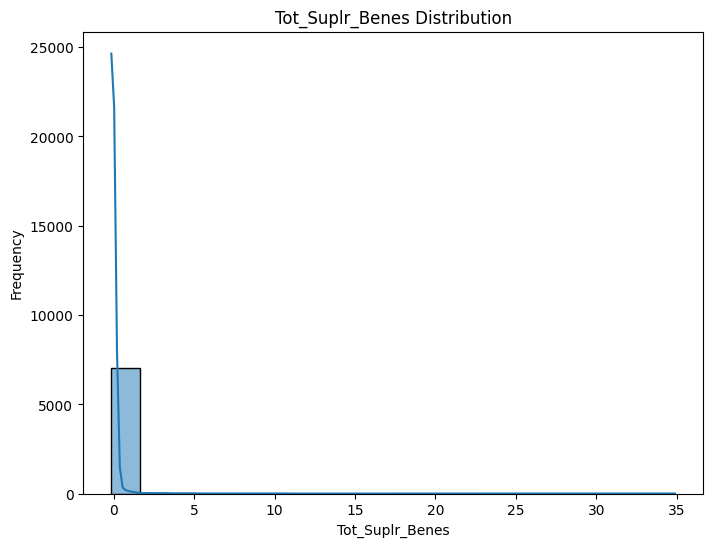

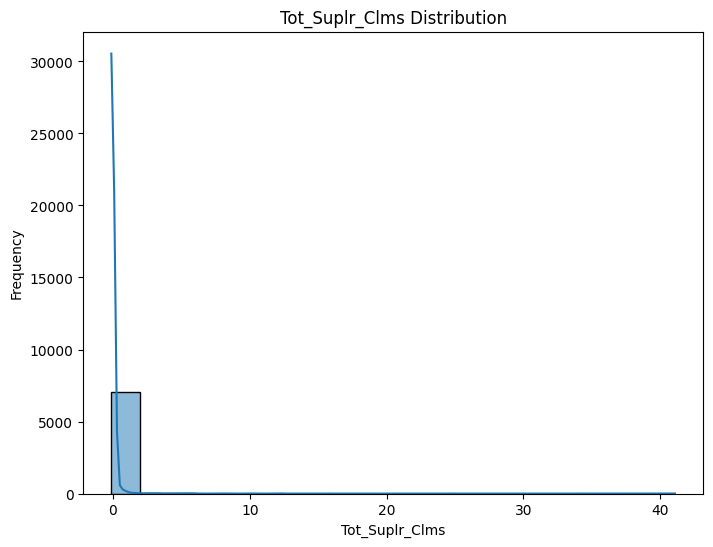

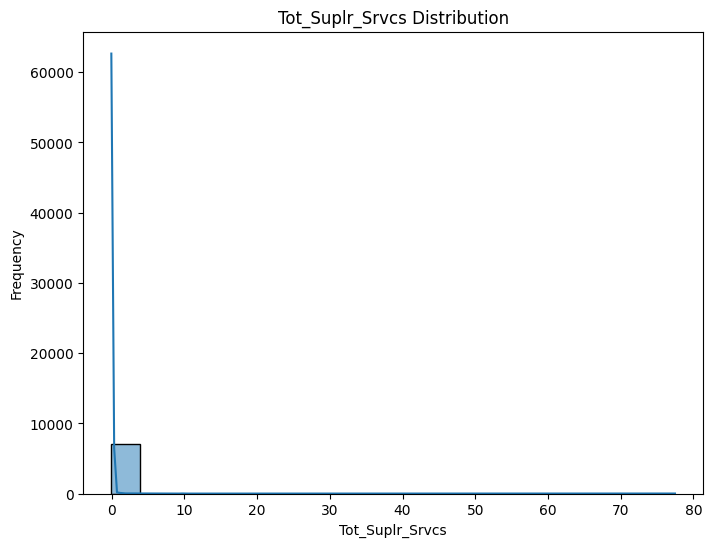

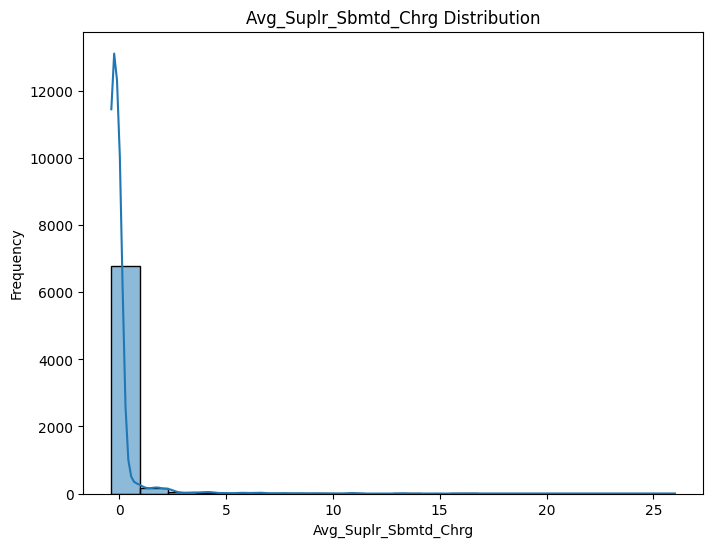

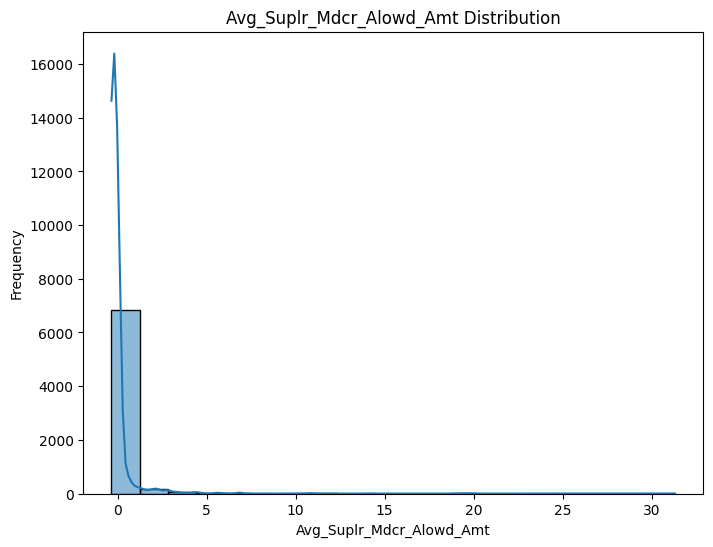

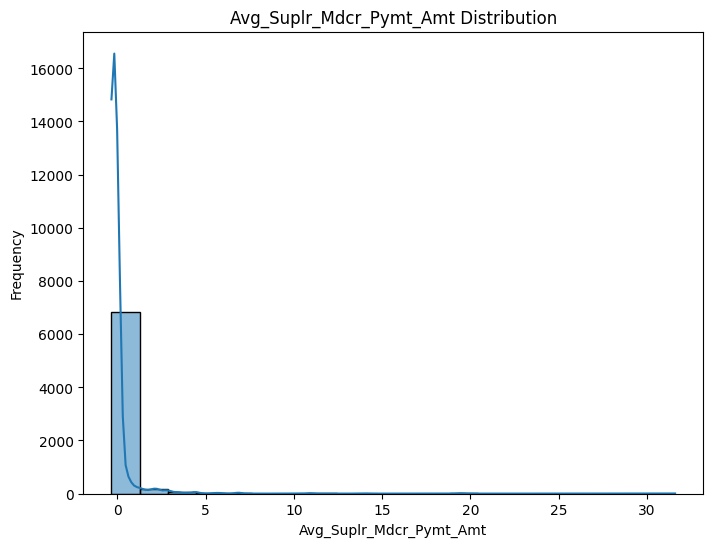

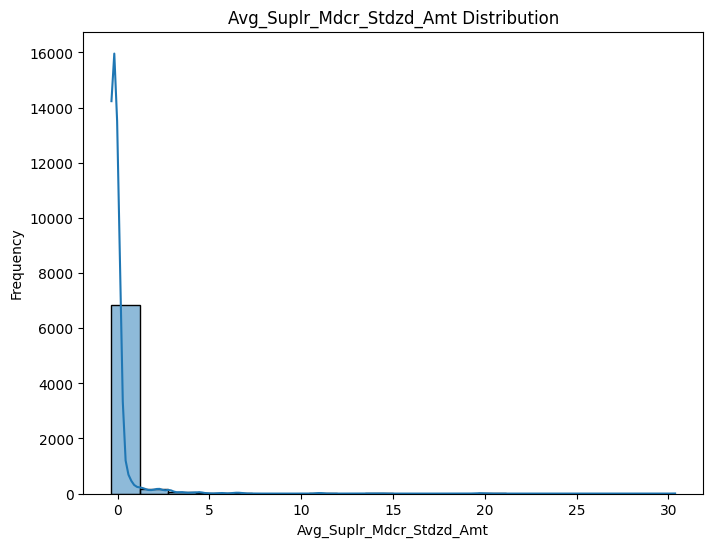

In [25]:
# Histograms for numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[col], bins=20, kde=True)
    plt.title(col + ' Distribution')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [26]:
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
num_dataset = data[numerical_columns]

In [32]:
import statsmodels.api as sm
for col in numerical_columns.columns:
    sm.qqplot(numerical_columns[col], line='s')
    plt.title('Q-Q plot of ' + col)
    plt.show()

AttributeError: 'list' object has no attribute 'columns'

In [34]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# Assuming 'data' is your original dataset containing numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Apply Min-Max scaling to the numerical columns
data[numerical_columns] = scaler.fit_transform(data[numerical_columns])

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**



The code snippet provided is likely part of a Python script or Jupyter Notebook cell intended to set up the required libraries for an assignment. It uses the pip package manager to install several Python libraries: requests, tabulate, colorama (with a version requirement of at least 0.3.8), future, and h2o. The 'requests' library is commonly used for making HTTP requests, 'tabulate' for formatting tabular data, 'colorama' for adding colored output to the console, 'future' for compatibility with Python 2.x and 3.x, and 'h2o' for machine learning tasks, particularly with a focus on big data analysis and predictive modeling. The exclamation mark (!) indicates that these commands are intended to be executed in a shell or command prompt, which suggests this code may be run within a Jupyter Notebook or an environment that supports shell commands inline with Python code.


In [36]:
##Installing all the required libraries for the Assignment
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**




The provided code snippet is importing several libraries in Python, likely for use in a data analysis or machine learning assignment. It begins by importing H2O and related modules for automated machine learning tasks, such as H2OAutoML for automated model selection and H2OGradientBoostingEstimator for gradient boosting. It also imports necessary modules for data handling and visualization, such as pandas for data manipulation, matplotlib.pyplot for creating plots, seaborn for statistical data visualization, and scipy.stats for statistical functions like calculating Pearson correlation coefficient. Additionally, it imports modules for general-purpose tasks like handling time, logging, and system information retrieval. The sns.set(rc={"figure.figsize": (16, 8)}) line sets the default figure size for seaborn plots. Overall, this code prepares the environment with the necessary tools and functionalities for data analysis and machine learning tasks.

In [37]:
# Importing all the libararies required for the assignment
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from scipy.stats import pearsonr

sns.set(rc={"figure.figsize": (16, 8)})

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The code snippet initializes two variables: min_mem_size and run_time. The min_mem_size variable is likely setting a minimum memory threshold, ensuring that the subsequent operations have access to at least a specified amount of memory, possibly in gigabytes, to prevent memory-related errors or performance issues. On the other hand, the run_time variable sets a maximum duration, indicated as 222 units of time (which could be seconds, minutes, or another unit), for the execution of a process, likely related to an Automated Machine Learning (AutoML) task. This limit helps control the execution time of the AutoML process, ensuring it doesn't run indefinitely and enabling better resource allocation and management within the computational environment.

In [38]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code calculates the minimum memory size required for subsequent operations based on a specified percentage of available system memory. Initially, pct_memory is set to 0.5, indicating a utilization target of 50%. Then, psutil.virtual_memory() is used to retrieve information about the system's virtual memory, and this data is stored in the variable virtual_memory. Following this, the min_mem_size variable is computed by multiplying the percentage of memory (pct_memory) by the available virtual memory, converting the result to gigabytes, and rounding it to the nearest integer. Since the calculation results in 6 gigabytes, the code prints this value (6) as the output, indicating that 6 gigabytes of memory are required for the subsequent operations based on the specified 50% utilization target.

In [39]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

5


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code initializes the H2O server with specific configurations. It starts the H2O server on a random port within the range of 5555 to 55555, assigning the chosen port number to the variable port_no. Then, it attempts to initialize the H2O server with the specified minimum memory size (min_mem_size) and the randomly chosen port number. If the initialization fails, it logs the error, downloads all available logs to a specified directory (logs_path), shuts down the H2O cluster, and exits the program with an exit code of 2. The output indicates the successful initialization of the H2O cluster, providing information such as uptime, timezone settings, version details, cluster name, available memory, total cores, cluster status, and connection URL, confirming that the H2O server is running with the specified configurations. Additionally, it shows the Python version used (3.10.12 final).

In [41]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)


Checking whether there is an H2O instance running at http://localhost:33685..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp28ml5ujr
  JVM stdout: /tmp/tmp28ml5ujr/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp28ml5ujr/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:33685
Connecting to H2O server at http://127.0.0.1:33685 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 30 days
H2O_cluster_name:,H2O_from_python_unknownUser_8odn8f
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code snippet imports processed data from a CSV file named 'healthsupplier_2017_deleted.csv'. Firstly, it uses the H2O library to import the data directly into a H2OFrame object df by specifying the file path using the h2o.import_file() function. This allows for efficient handling and processing of large datasets within the H2O environment. Additionally, the same CSV file is also imported into a Pandas DataFrame object dff using the pd.read_csv() function from the Pandas library. This provides compatibility with Pandas-based data manipulation and analysis tools, allowing for flexibility in data exploration and preprocessing outside of the H2O environment. Overall, this code facilitates the loading of processed data from a CSV file into both H2OFrame and Pandas DataFrame formats for further analysis and modeling.

In [42]:
# Import the processed data from notebook One
url = "/content/healthsupplier_2017_deleted.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv('/content/healthsupplier_2017_deleted.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code segment aims to extract numerical columns from a Pandas DataFrame dff and create a new DataFrame dfff containing only these numerical columns. Firstly, it utilizes the select_dtypes() method to filter columns based on their data types, specifying inclusion criteria for integer and float data types. This method returns a DataFrame containing only the columns with numerical data types. Then, the columns.tolist() function converts the resulting DataFrame into a list of column names representing the numerical columns. Finally, these numerical columns are used to create a new DataFrame dfff by selecting and copying only the numerical columns from the original DataFrame dff, facilitating subsequent analysis and modeling tasks specifically focused on numerical data.

In [43]:
# Extract numerical columns
numerical_columns = dff.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Create new DataFrame with only numerical columns
dfff = dff[numerical_columns].copy()


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code segment is responsible for splitting a dataset represented by the H2OFrame object df into training and test datasets based on a specified percentage. Firstly, the variable pct_rows is set to 0.80, representing the proportion of data allocated to the training dataset (80% in this case). Then, the split_frame() method is called on the df object with the specified percentage to split the data into two subsets: df_train for training data and df_test for testing data. This splitting process divides the dataset randomly into two portions according to the specified percentage, allowing for separate sets of data to be used for model training and evaluation, which is essential for assessing the generalization performance of machine learning models.

In [44]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code segment retrieves the column names from the H2OFrame object df and prints them. The df.columns attribute returns a list containing the names of all columns present in the dataset df. This list, represented by the variable X, includes various column names such as 'Rfrg_Prvdr_Geo_Lvl', 'BETOS_Cd', 'HCPCS_Desc', and others. These column names likely correspond to different features or attributes of the dataset, such as geographical levels, medical procedure codes, descriptions, and various metrics related to healthcare supplier data. This output provides insight into the structure and content of the dataset, aiding in further analysis and modeling tasks by identifying the available features for analysis or prediction.

In [45]:
X = df.columns
print(X)


['Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc', 'BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc', 'HCPCS_Cd', 'HCPCS_Desc', 'Suplr_Rentl_Ind', 'Tot_Rfrg_Prvdrs', 'Tot_Suplrs', 'Tot_Suplr_Benes', 'Tot_Suplr_Clms', 'Tot_Suplr_Srvcs', 'Avg_Suplr_Sbmtd_Chrg', 'Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Pymt_Amt', 'Avg_Suplr_Mdcr_Stdzd_Amt']



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code segment defines the target variable y as "Avg_Suplr_Mdcr_Pymt_Amt", which is likely the average payment amount made by Medicare to healthcare suppliers. Then, it removes this target variable from the list of predictor variables X using the X.remove(y) method, as the target variable should not be included among the predictors for modeling purposes. The resulting list printed represents the updated set of predictor variables, excluding the target variable, and includes various features such as geographical levels, medical procedure codes, supplier rental indicators, and different metrics related to healthcare supplier data. This step ensures that the predictor variables do not include the target variable, preparing the dataset for further analysis and modeling tasks where the aim is to predict the target variable based on the available predictors.

In [46]:

# Set target and predictor variables
y = "Avg_Suplr_Mdcr_Pymt_Amt"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc', 'BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc', 'HCPCS_Cd', 'HCPCS_Desc', 'Suplr_Rentl_Ind', 'Tot_Rfrg_Prvdrs', 'Tot_Suplrs', 'Tot_Suplr_Benes', 'Tot_Suplr_Clms', 'Tot_Suplr_Srvcs', 'Avg_Suplr_Sbmtd_Chrg', 'Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Stdzd_Amt']



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code initializes an instance of the H2OAutoML class named aml for automated machine learning (AutoML) tasks. It sets parameters such as max_runtime_secs to control the maximum allowed runtime for the AutoML process, which was previously defined as run_time, representing 222 units of time. This parameter determines the maximum duration for AutoML model training, ensuring efficient resource allocation and preventing the process from running indefinitely. Additionally, the seed parameter is set to 1 to ensure reproducibility, providing a fixed starting point for randomization within the AutoML process. Overall, this code prepares the AutoML instance with specific settings to automate the process of training and evaluating multiple machine learning models, facilitating efficient model selection and tuning for predictive modeling tasks.

In [47]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided output details the results of training a machine learning model, likely a gradient boosting machine (GBM) regression model, using the H2OAutoML framework on the provided dataset. The model summary section displays various metrics such as the number of trees, model size, depth, and leaf statistics. The model metrics section provides evaluation metrics on both the training data and cross-validation data, including Mean Squared Error (MSE), Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and Root Mean Squared Logarithmic Error (RMSLE), which are used to assess the model's performance. Additionally, the scoring history section displays the progress of model training over time, showing the duration, number of trees, and corresponding training metrics at each iteration. Furthermore, the variable importances section ranks the predictors based on their relative importance in the model, indicating the top predictors contributing to the model's predictive power. Overall, this output provides insights into the trained model's performance, progress during training, and the importance of predictors in predicting the target variable.

In [48]:
aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models

AutoML progress: |
21:13:10.475: XGBoost_1_AutoML_1_20240219_211309 [XGBoost def_2] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_1_AutoML_1_20240219_211309_cv_1.  Details: ERRR on field: _response_column: Response contains missing values (NAs) - not supported by XGBoost.


█████████████████████████
21:14:38.237: XGBoost_2_AutoML_1_20240219_211309 [XGBoost def_1] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_2_AutoML_1_20240219_211309_cv_1.  Details: ERRR on field: _response_column: Response contains missing values (NAs) - not supported by XGBoost.


██████████████
21:15:27.365: XGBoost_3_AutoML_1_20240219_211309 [XGBoost def_3] failed: water.exceptions.H2OModelBuilderIllegalArgumentException: Illegal argument(s) for XGBoost model: XGBoost_3_AutoML_1_20240219_211309_cv_1.  Details: ERRR on field: _response_column: Response contains missing values (NAs) -

Model Details
=============
H2ODeepLearningEstimator : Deep Learning
Model Key: DeepLearning_1_AutoML_1_20240219_211309


Status of Neuron Layers: predicting Avg_Suplr_Mdcr_Pymt_Amt, regression, gaussian distribution, Quadratic loss, 31,541 weights/biases, 564.6 KB, 13,070 training samples, mini-batch size 1
    layer    units    type       dropout    l1    l2    mean_rate            rate_rms              momentum    mean_weight              weight_rms            mean_bias            bias_rms
--  -------  -------  ---------  ---------  ----  ----  -------------------  --------------------  ----------  -----------------------  --------------------  -------------------  -----------------------
    1        3130     Input      0.0
    2        10       Rectifier  0.0        0.0   0.0   0.1445063853383834   0.29827582836151123   0.0         -0.00015951458502814304  0.025261476635932922  0.6886734249810146   0.12699270248413086
    3        10       Rectifier  0.0        0.0   0.0   0.00939850267401198  0.011417798697948456  0.0         0.016595135692041366     0.36349666118621826   0.9984351955115421   0.028503604233264923
    4        10       Rectifier  0.0        0.0   0.0   0.11766136954363901  0.29626214504241943   0.0         -0.03934133686125278     0.29068970680236816   1.0193139637171122   0.0276530459523201
    5        1        Linear                0.0   0.0   0.10302916665059456  0.2982398271560669    0.0         0.025966692110523583     0.42306435108184814   0.03681818385815059  1.0971281125650402e-154

ModelMetricsRegression: deeplearning
** Reported on train data. **

MSE: 97184.87123362081
RMSE: 311.7448816478321
MAE: 44.53314518720337
RMSLE: NaN
Mean Residual Deviance: 97184.87123362081

ModelMetricsRegression: deeplearning
** Reported on cross-validation data. **

MSE: 38097.834551519045
RMSE: 195.1866659162942
MAE: 63.599065574236114
RMSLE: NaN
Mean Residual Deviance: 38097.834551519045

Cross-Validation Metrics Summary: 
                        mean      sd        cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  --------  --------  ------------  ------------  ------------  ------------  ------------
mae                     209.32    62.5665   243.046       187.104       267.111       239.038       110.303
mean_residual_deviance  692190    619732    1.01737e+06   349983        1.59335e+06   485163        15083
mse                     692190    619732    1.01737e+06   349983        1.59335e+06   485163        15083
r2                      0.535491  0.279063  0.356737      0.59207       0.25257       0.499023      0.977054
residual_deviance       692190    619732    1.01737e+06   349983        1.59335e+06   485163        15083
rmse                    736.374   432.93    1008.65       591.593       1262.28       696.536       122.813
rmsle                   nan       0         nan           nan           nan           nan           nan

Scoring History: 
    timestamp            duration    training_speed    epochs    iterations    samples    training_rmse    training_deviance    training_mae    training_r2
--  -------------------  ----------  ----------------  --------  ------------  ---------  ---------------  -------------------  --------------  -------------
    2024-02-19 21:16:10  0.000 sec                     0         0             0          nan              nan                  nan             nan
    2024-02-19 21:16:10  19.745 sec  5181 obs/sec      0.156123  1             886        858.443          736924               233.87          0.405804
    2024-02-19 21:16:13  22.225 sec  5352 obs/sec      2.30308   15            13070      311.745          97184.9              44.5331         0.921638

Variable Importances: 
variable                                                                                               relative_importance    scaled_importance    percentage
----------------------------------------------------------------------------------------


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code prints the shape of the training and test datasets, represented as tuples containing the number of rows and columns in each dataset. The output indicates that the training dataset (df_train) consists of 5668 rows and 18 columns, while the test dataset (df_test) comprises 1416 rows and 18 columns. This information reveals the size and structure of the datasets used for training and testing machine learning models, providing insights into the amount of data available for model training and evaluation. Having a larger training dataset compared to the test dataset is typical in machine learning workflows to ensure sufficient data for model learning while still preserving an independent dataset for evaluation

In [49]:
print(df_train.shape)
print(df_test.shape)

(5675, 18)
(1409, 18)



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The df_train.head() function displays the first few rows of the training dataset df_train. By default, it shows the first five rows of the dataset, providing a preview of the data's structure and content. This preview is useful for quickly inspecting the dataset's features, data types, and potential issues such as missing values or outliers. It helps in understanding the data distribution, identifying patterns, and making informed decisions about data preprocessing and modeling strategies. Additionally, examining the initial rows can give insights into the range and format of values present in the dataset, aiding in data exploration and analysis tasks.

In [50]:
df_train.head()


Rfrg_Prvdr_Geo_Lvl,Rfrg_Prvdr_Geo_Cd,Rfrg_Prvdr_Geo_Desc,BETOS_Lvl,BETOS_Cd,BETOS_Desc,HCPCS_Cd,HCPCS_Desc,Suplr_Rentl_Ind,Tot_Rfrg_Prvdrs,Tot_Suplrs,Tot_Suplr_Benes,Tot_Suplr_Clms,Tot_Suplr_Srvcs,Avg_Suplr_Sbmtd_Chrg,Avg_Suplr_Mdcr_Alowd_Amt,Avg_Suplr_Mdcr_Pymt_Amt,Avg_Suplr_Mdcr_Stdzd_Amt
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4034,"Enteral feeding supply kit; syringe fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape",N,28183,1745,33451,171371,4.62739e+06,58.2665,3.71851,2.91807,3.04704
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4036,"Enteral feeding supply kit; gravity fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape",N,6166,933,7171,41181,1.11638e+06,75.1726,5.03693,3.95929,4.1002
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4081,Nasogastric tubing with stylet,N,14,12,13,20,33,113.736,17.2927,13.8339,13.5797
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4082,Nasogastric tubing without stylet,N,16,16,16,21,43,99.1109,12.5321,9.50233,9.46349
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4083,Stomach tube - levine type,N,4,2,nan,13,19,13.6547,1.96,1.56789,1.49895
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4087,"Gastrostomy/jejunostomy tube, standard, any material, any type, each",N,3053,708,4173,9077,9414,116.497,29.6103,23.0846,22.5183
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4150,"Enteral formula, nutritionally complete with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit",N,17523,1618,20211,135084,5.35026e+07,2.01054,0.434259,0.336922,0.357743
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4152,"Enteral formula, nutritionally complete, calorically dense (equal to or greater than 1.5 kcal/ml) with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit",N,32631,1909,42222,255939,1.22659e+08,1.57546,0.362842,0.282859,0.297564
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4153,"Enteral formula, nutritionally complete, hydrolyzed proteins (amino acids and peptide chain), includes fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit",N,5333,894,5436,32700,1.38571e+07,7.89527,1.36076,1.07746,1.11574
National,nan,National,Drugs and Nutritional Products,O1C,Enteral and parenteral,B4154,"Enteral formula, nutritionally complete, for special metabolic needs, excludes inherited disease of metabolism, includes altered composition of proteins, fats, carbohydrates, vitamins and/or minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit",N,11217,1236,14024,85632,3.63872e+07,2.79658,0.75649,0.597544,0.641425



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code retrieves the column names from the dataset represented by the DataFrame df and prints them. The df.columns attribute returns a list containing the names of all columns present in the dataset. The output is a list of column names such as 'Rfrg_Prvdr_Geo_Lvl', 'BETOS_Cd', 'HCPCS_Desc', and others, which represent different features or attributes of the dataset. This output provides insight into the structure and content of the dataset, listing the available features for analysis or modeling tasks. It serves as a useful initial step in data exploration, enabling users to understand the dataset's composition and plan subsequent data processing or analysis steps accordingly.

In [51]:
X = df.columns
print(X)

['Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc', 'BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc', 'HCPCS_Cd', 'HCPCS_Desc', 'Suplr_Rentl_Ind', 'Tot_Rfrg_Prvdrs', 'Tot_Suplrs', 'Tot_Suplr_Benes', 'Tot_Suplr_Clms', 'Tot_Suplr_Srvcs', 'Avg_Suplr_Sbmtd_Chrg', 'Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Pymt_Amt', 'Avg_Suplr_Mdcr_Stdzd_Amt']


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code prints a leaderboard showing the performance of different models trained on the dataset using H2O's AutoML (Automated Machine Learning) framework. Each row in the leaderboard represents a different model, identified by a unique model ID (model_id). The columns display various evaluation metrics such as Root Mean Squared Error (RMSE), Mean Squared Error (MSE), Mean Absolute Error (MAE), Root Mean Squared Logarithmic Error (RMSLE), and Mean Residual Deviance, which assess the models' performance on the dataset. The models are ranked based on their performance in terms of the specified metrics, with lower values indicating better performance for metrics like RMSE, MSE, and MAE. The leaderboard provides a concise overview of the models' performance, facilitating the selection of the best-performing model for deployment or further analysis. Additionally, it includes different types of models such as Gradient Boosting Machines (GBM), Stacked Ensembles, Deep Learning models, Random Forest (XRT), and Distributed Random Forest (DRF), indicating the variety of algorithms utilized by the AutoML framework to explore the model space and find the best model configuration for the given dataset.

In [52]:
print(
    aml.leaderboard
)  # Leaderboard showing the performance of different models on the dataset.

model_id                                                    rmse      mse      mae       rmsle    mean_residual_deviance
DeepLearning_1_AutoML_1_20240219_211309                  195.187  38097.8  63.5991  nan                          38097.8
StackedEnsemble_BestOfFamily_3_AutoML_1_20240219_211309  200.461  40184.4  51.2149  nan                          40184.4
StackedEnsemble_AllModels_2_AutoML_1_20240219_211309     208.739  43572    51.4018  nan                          43572
GBM_5_AutoML_1_20240219_211309                           230.008  52903.9  15.951     0.408478                   52903.9
StackedEnsemble_BestOfFamily_2_AutoML_1_20240219_211309  258.099  66614.9  34.3078  nan                          66614.9
DRF_1_AutoML_1_20240219_211309                           262.129  68711.8  24.9572    0.313462                   68711.8
GBM_grid_1_AutoML_1_20240219_211309_model_2              264.36   69886.5  22.013   nan                          69886.5
StackedEnsemble_AllModels_1_AutoML


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code initializes two variables, model_index and glm_index, as well as an empty string variable glm_model and an empty dictionary models_dict. It then converts the H2OAutoML leaderboard into a Pandas DataFrame aml_leaderboard_df. The code iterates over the model IDs in the leaderboard DataFrame, populating the models_dict dictionary with keys representing the model IDs and values representing their corresponding index positions. It stops populating the dictionary once it encounters the first model ID that does not contain "StackedEnsemble", indicating the end of stacked ensemble models. Similarly, it finds the index of the first model ID containing "GLM" and assigns it to glm_index. The resulting models_dict dictionary contains model IDs as keys and their corresponding index positions as values, providing a mapping for easily referencing models based on their IDs or indices. This code is likely used for tracking and managing model indices for further analysis or operations within the AutoML pipeline.

In [53]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


{'DeepLearning_1_AutoML_1_20240219_211309': 0,
 'GLM_1_AutoML_1_20240219_211309': 17}

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code prints the value of the variable model_index, which represents the index position of the last Stacked Ensemble model in the AutoML leaderboard. However, since the output is 0, it indicates that there are no Stacked Ensemble models in the leaderboard, as the index of the last Stacked Ensemble model would typically be greater than 0. As a result, the attempt to retrieve the model ID of the best-performing Stacked Ensemble model from the leaderboard using aml.leaderboard[model_index, "model_id"] may result in an error or return an empty string if there are no Stacked Ensemble models available. It's essential to verify the contents of the AutoML leaderboard and ensure that it contains the expected models before attempting to retrieve specific models from it.*italicized text*

In [54]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

0


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code accesses the algo attribute of the best_model object, likely representing the algorithm used by the best-performing model identified in the AutoML process. The output "gbm" indicates that the best model is a Gradient Boosting Machine (GBM). GBM is a machine learning algorithm that builds a series of decision trees sequentially, where each subsequent tree corrects the errors made by the previous ones, resulting in a powerful ensemble model capable of handling complex relationships in the data and achieving high predictive performance. This output confirms the algorithm used by the best-performing model, providing insight into the type of model selected by the AutoML framework for the given dataset and task.

In [55]:
best_model.algo

'deeplearning'


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code sets up the environment for using Matplotlib, a popular plotting library in Python, for generating plots inline within a Jupyter Notebook. The %matplotlib inline magic command instructs Jupyter to display Matplotlib plots directly within the notebook's output cells, ensuring that the plots are rendered seamlessly alongside the code. Additionally, the code imports the warnings module and filters out specific warning messages related to Matplotlib's deprecation using the warnings.filterwarnings() function. By ignoring these warnings, the code suppresses any potential warning messages that may interfere with the notebook's readability or execution, allowing for smoother workflow when creating and displaying plots. Overall, this setup ensures that Matplotlib plots are displayed inline in the notebook while suppressing irrelevant deprecation warnings, providing a more streamlined and efficient plotting experience.

In [56]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook


warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

<ipython-input-56-1160351bf8dd>:9: MatplotlibDeprecationWarning: mplDeprecation was deprecated in Matplotlib 3.6 and will be removed two minor releases later. Use matplotlib.MatplotlibDeprecationWarning instead.
  warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The provided code checks if the algorithm used by the best_model is one of the specified tree-based algorithms, namely Gradient Boosting Machine (GBM), Distributed Random Forest (DRF), Random Forest (XRT), or XGBoost. If the algorithm matches any of these specified algorithms, the code proceeds to generate a variable importance plot using the varimp_plot() function associated with the best_model.

Variable importance plots are valuable tools in understanding the contribution of different features or variables to the predictive performance of the model. They visualize the importance scores assigned to each feature by the model during the training process. Features with higher importance scores are considered more influential in making predictions, while features with lower scores have less impact.

By generating this plot, the code helps users gain insights into which features are the most informative for the model's predictions, facilitating interpretation and potentially guiding feature selection or further analysis. If the best_model does not belong to any of the specified tree-based algorithms, the variable importance plot will not be generated.

This graph rells us that which features contribute the most in the overall prediction

In [57]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code checks if the variable glm_index is not equal to 0. If glm_index is not 0, it means that there exists a Generalized Linear Model (GLM) in the AutoML leaderboard. In that case, the code proceeds to print the value of glm_index, fetches the GLM model object from the AutoML leaderboard using the h2o.get_model() function with the corresponding model ID retrieved from the leaderboard, and prints the algorithm used by the GLM model using glm_model.algo. Finally, it generates a standardized coefficient plot for the GLM model using the std_coef_plot() function associated with the glm_model.

The standardized coefficient plot displays the standardized coefficients of each predictor variable in the GLM model. These coefficients represent the change in the response variable (target) associated with a one-unit change in the predictor variable, standardized to have a mean of 0 and a standard deviation of 1. This plot helps in understanding the relative importance and directionality of each predictor variable in influencing the model's predictions.

Overall, this code segment facilitates the interpretation and analysis of the GLM model by providing insights into the coefficients of predictor variables and their impact on the model's predictions, if such a model exists in the AutoML leaderboard. If glm_index is equal to 0, indicating the absence of a GLM model in the leaderboard, this code segment will not be executed.

<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-58-0cab54a0793b>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if glm_index is not 0:


17
glm


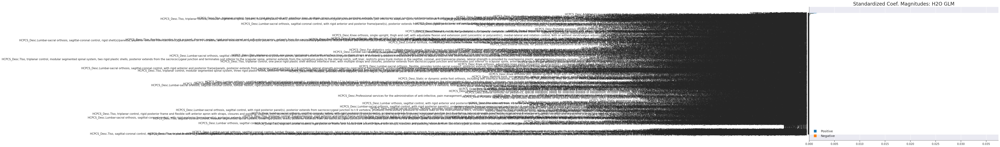

In [58]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code prints the Root Mean Squared Error (RMSE) of the best_model on the training data. The rmse() function is a method associated with the model object (best_model), and when called with train=True, it calculates and returns the RMSE metric specifically for the training dataset. In the output, the RMSE value is shown as 5.508754163444446, indicating the average magnitude of errors made by the model in predicting the target variable (presumably in the same units as the target variable). A lower RMSE value suggests better performance of the model, indicating that, on average, the model's predictions are close to the actual values in the training dataset. This metric provides a quantitative measure of the model's accuracy on the training data and is commonly used to evaluate regression models' performance.

In [59]:

print(best_model.rmse(train=True))

311.7448816478321




**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code defines a Python function named model_performance_stats, which takes a performance object perf (presumably obtained from model evaluation) as input. Inside the function, a dictionary d is initialized to store various performance statistics calculated from the perf object.

The function then attempts to calculate different performance metrics by using various methods associated with the perf object. For each metric, it uses a try block to attempt the calculation, and if successful, it stores the result in the dictionary d with the corresponding key. If the calculation fails (due to the method not being available for the given perf object), the except block catches the exception and the code continues execution without adding that particular metric to the dictionary.

The function finally returns the dictionary d containing the calculated performance statistics. This approach ensures that the function gracefully handles situations where certain metrics may not be available or applicable for the provided perf object, allowing for flexible and robust computation of model performance statistics across different evaluation scenarios.|

In [60]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code calculates various performance statistics for the best_model using the test dataset df_test. It first obtains the model performance object mod_perf by calling the model_performance() method of the best_model object, passing the test dataset as an argument.

Subsequently, it initializes an empty dictionary stats_test to store the calculated performance statistics. Then, it assigns the dictionary stats_test the values returned by the model_performance_stats() function, passing the mod_perf object as an argument.

The model_performance_stats() function attempts to compute several performance metrics from the given performance object mod_perf, such as Mean Squared Error (mse), Root Mean Squared Error (rmse), and others. The function gracefully handles cases where certain metrics may not be available or applicable for the provided performance object.

Finally, the code prints the dictionary stats_test, which contains the calculated performance statistics for the test dataset. The output dictionary includes the computed values for mse, rmse, and other metrics. Additionally, some metrics such as null_degrees_of_freedom, residual_degrees_of_freedom, residual_deviance, and null_deviance are set to None, indicating that these particular statistics may not be available or applicable for the given model or evaluation scenario. Overall, the output provides insights into the performance of the best_model on the test dataset, facilitating evaluation and comparison with other models or datasets.

In [61]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 123327.22671661466,
 'rmse': 351.1797641046743,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code generates predictions for the test dataset df_test using the best_model. This is achieved by calling the predict() method associated with the best_model object and passing the test dataset df_test as an argument.

The predict() method computes predictions for each observation in the test dataset based on the learned patterns and relationships captured by the best_model during the training phase. These predictions represent the model's estimated values for the target variable or response variable based on the input features provided in the test dataset.

After executing the code, the variable predictions holds the computed predictions for the test dataset, allowing for further analysis, evaluation, or comparison with the actual target values in the test dataset to assess the performance and accuracy of the model's predictions. Overall, this code segment facilitates the application of the trained model to unseen data, enabling prediction tasks and model evaluation in real-world scenarios.

In [62]:

predictions = best_model.predict(df_test)

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code converts the predictions generated by the best_model for the test dataset into a Pandas DataFrame format using the h2o.as_list() function. This function converts an H2OFrame object, which is the data structure used by H2O.ai for handling data, into a Pandas DataFrame, a widely used data structure in Python for data manipulation and analysis.

The resulting DataFrame y_pred contains the predictions made by the model for each observation in the test dataset. Each row in the DataFrame corresponds to an observation in the test dataset, and the column predict contains the predicted values generated by the model. These predicted values represent the model's estimated values for the target variable based on the input features provided in the test dataset.

Printing y_pred displays the DataFrame representation of the predictions, allowing users to inspect the model's predictions and compare them with the actual target values in the test dataset to evaluate the model's performance and accuracy. Overall, this code segment facilitates the conversion of model predictions from H2O.ai's data structure to a Pandas DataFrame for further analysis and visualization using Python's ecosystem of data analysis tools.

In [63]:
y_pred = h2o.as_list(
    predictions
)  # Predictions on Test Dataset using the best model from the leaderboard.
print(y_pred)

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
         predict
0      44.547386
1     101.251293
2     118.158172
3      -7.534309
4     -17.356306
...          ...
1404  115.540178
1405  115.540178
1406  115.540178
1407  115.540178
1408  115.540178

[1409 rows x 1 columns]



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code extracts the actual values of the target variable Avg_Suplr_Mdcr_Pymt_Amt from the test dataset df_test and converts them into a Pandas DataFrame format using the h2o.as_list() function.

The resulting DataFrame y_test contains the real answers or actual values of the target variable for each observation in the test dataset. Each row in the DataFrame corresponds to an observation in the test dataset, and the column represents the target variable Avg_Suplr_Mdcr_Pymt_Amt, containing the actual values of the target variable.

In the displayed output, the DataFrame y_test is shown, where each row contains the actual value of Avg_Suplr_Mdcr_Pymt_Amt for a particular observation in the test dataset. The values are displayed as floating-point numbers, representing the actual payments made by suppliers for Medicare services.

It's worth noting that some rows may contain missing values (NaN), indicating that the actual value of Avg_Suplr_Mdcr_Pymt_Amt is not available or missing for those particular observations in the test dataset.

Overall, this code segment facilitates the extraction and inspection of the actual target variable values from the test dataset, enabling comparison with the predictions generated by the model to evaluate its performance and accuracy.







In [64]:
y_test = h2o.as_list(df_test[y])  # Real Answers
y_test

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


,Avg_Suplr_Mdcr_Pymt_Amt
0,5.067509
1,25.892531
2,34.765124
3,0.904473
4,2.394845
...,...
1404,NaN
1405,NaN
1406,NaN
1407,NaN


In [65]:

print(X)

['Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc', 'BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc', 'HCPCS_Cd', 'HCPCS_Desc', 'Suplr_Rentl_Ind', 'Tot_Rfrg_Prvdrs', 'Tot_Suplrs', 'Tot_Suplr_Benes', 'Tot_Suplr_Clms', 'Tot_Suplr_Srvcs', 'Avg_Suplr_Sbmtd_Chrg', 'Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Pymt_Amt', 'Avg_Suplr_Mdcr_Stdzd_Amt']



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code initializes several instances of the H2OGeneralizedLinearEstimator class, which is used to create Generalized Linear Models (GLMs) in H2O.ai. Each instance corresponds to a different GLM model with specific settings for regularization and parameter tuning.

health_glm: This GLM estimator is configured with Gaussian distribution (indicating a linear regression model), lambda set to 0 (no regularization), and enabling computation of p-values during model training. It uses 5-fold cross-validation (nfolds=5) for model evaluation.

health_glm_regularization_ridge: This GLM estimator also employs a Gaussian distribution, but it specifically implements Ridge regularization (alpha=0). Ridge regression adds a penalty term to the model's cost function, controlling the magnitude of the coefficients. It also uses 5-fold cross-validation for evaluation.

health_glm_regularization_lasso: Similar to the Ridge regularization model, this GLM estimator utilizes a Gaussian distribution but applies LASSO (Least Absolute Shrinkage and Selection Operator) regularization (alpha=1). LASSO regularization encourages sparsity in the coefficients by adding an L1 penalty term to the cost function.

health_glm_regularization_lambda_search: This GLM estimator performs lambda search during model training (lambda_search=True), allowing the algorithm to automatically search for the optimal value of lambda (regularization parameter) based on the training data.

Overall, these GLM estimators provide flexibility in specifying different regularization techniques and parameter settings, enabling the exploration of various regularization strategies to improve model performance and interpretability.







In [66]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

health_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
health_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
health_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
health_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code trains the GLM (Generalized Linear Model) represented by the health_glm estimator on the training dataset df_train.

Here's a breakdown of the parameters used in the train() method:

x: This parameter specifies the predictor variables used for training the model. In this case, X likely contains the names of the columns in the training dataset df_train that are used as features or predictors for the model.

y: This parameter specifies the target variable, which the model aims to predict. In this case, y likely represents the name of the column in the training dataset df_train that contains the target variable.

training_frame: This parameter specifies the training dataset on which the model will be trained. Here, df_train is provided as the training frame, indicating that the model will learn patterns and relationships from this dataset.

By calling the train() method with these parameters, the GLM represented by health_glm is trained using the provided training dataset, where it learns to predict the target variable (y) based on the predictor variables (X). The model fitting process involves estimating the parameters of the GLM that best fit the training data, typically by minimizing a specified loss function or maximizing a likelihood function. Once trained, the model can be used to make predictions on new, unseen data.

In [67]:
health_glm.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██ (failed)


OSError: Job with key $03017f0000019683ffffffff$_b4b91a160b32770179290ef76a864acb failed with an exception: hex.gram.Gram$CollinearColumnsException: Found collinear columns in the dataset. P-values can not be computed with collinear columns in the dataset. Set remove_collinear_columns flag to true to remove collinear columns automatically. Found collinear columns [HCPCS_Cd.L5814, HCPCS_Cd.L5816, HCPCS_Cd.L5818, HCPCS_Cd.L5822, HCPCS_Cd.L5826, HCPCS_Cd.L5828, HCPCS_Cd.L5830, HCPCS_Cd.L5840, HCPCS_Cd.L5845, HCPCS_Cd.L5848, HCPCS_Cd.L5850, HCPCS_Cd.L5855, HCPCS_Cd.L5856, HCPCS_Cd.L5859, HCPCS_Cd.L5910, HCPCS_Cd.L5920, HCPCS_Cd.L5925, HCPCS_Cd.L5930, HCPCS_Cd.L5940, HCPCS_Cd.L5950, HCPCS_Cd.L5960, HCPCS_Cd.L5961, HCPCS_Cd.L5962, HCPCS_Cd.L5964, HCPCS_Cd.L5968, HCPCS_Cd.L5970, HCPCS_Cd.L5971, HCPCS_Cd.L5972, HCPCS_Cd.L5973, HCPCS_Cd.L5974, HCPCS_Cd.L5975, HCPCS_Cd.L5976, HCPCS_Cd.L5978, HCPCS_Cd.L5979, HCPCS_Cd.L5980, HCPCS_Cd.L5981, HCPCS_Cd.L5982, HCPCS_Cd.L5984, HCPCS_Cd.L5985, HCPCS_Cd.L5986, HCPCS_Cd.L5987, HCPCS_Cd.L5988, HCPCS_Cd.L5999, HCPCS_Cd.L6000, HCPCS_Cd.L6026, HCPCS_Cd.L6050, HCPCS_Cd.L6100, HCPCS_Cd.L6110, HCPCS_Cd.L6250, HCPCS_Cd.L6400, HCPCS_Cd.L6500, HCPCS_Cd.L6600, HCPCS_Cd.L6605, HCPCS_Cd.L6611, HCPCS_Cd.L6615, HCPCS_Cd.L6616, HCPCS_Cd.L6620, HCPCS_Cd.L6621, HCPCS_Cd.L6623, HCPCS_Cd.L6624, HCPCS_Cd.L6628, HCPCS_Cd.L6629, HCPCS_Cd.L6630, HCPCS_Cd.L6632, HCPCS_Cd.L6635, HCPCS_Cd.L6638, HCPCS_Cd.L6641, HCPCS_Cd.L6655, HCPCS_Cd.L6660, HCPCS_Cd.L6665, HCPCS_Cd.L6670, HCPCS_Cd.L6672, HCPCS_Cd.L6675, HCPCS_Cd.L6676, HCPCS_Cd.L6677, HCPCS_Cd.L6680, HCPCS_Cd.L6682, HCPCS_Cd.L6684, HCPCS_Cd.L6686, HCPCS_Cd.L6687, HCPCS_Cd.L6688, HCPCS_Cd.L6691, HCPCS_Cd.L6692, HCPCS_Cd.L6693, HCPCS_Cd.L6694, HCPCS_Cd.L6695, HCPCS_Cd.L6696, HCPCS_Cd.L6697, HCPCS_Cd.L6698, HCPCS_Cd.L6703, HCPCS_Cd.L6704, HCPCS_Cd.L6706, HCPCS_Cd.L6708, HCPCS_Cd.L6711, HCPCS_Cd.L6715, HCPCS_Cd.L6721, HCPCS_Cd.L6722, HCPCS_Cd.L6805, HCPCS_Cd.L6880, HCPCS_Cd.L6881, HCPCS_Cd.L6882, HCPCS_Cd.L6883, HCPCS_Cd.L6884, HCPCS_Cd.L6890, HCPCS_Cd.L6895, HCPCS_Cd.L6900, HCPCS_Cd.L6925, HCPCS_Cd.L6935, HCPCS_Cd.L6955, HCPCS_Cd.L7007, HCPCS_Cd.L7009, HCPCS_Cd.L7180, HCPCS_Cd.L7259, HCPCS_Cd.L7367, HCPCS_Cd.L7368, HCPCS_Cd.L7400, HCPCS_Cd.L7401, HCPCS_Cd.L7402, HCPCS_Cd.L7403, HCPCS_Cd.L7404, HCPCS_Cd.L7405, HCPCS_Cd.L7499, HCPCS_Cd.L7510, HCPCS_Cd.L7520, HCPCS_Cd.L7700, HCPCS_Cd.L8000, HCPCS_Cd.L8001, HCPCS_Cd.L8002, HCPCS_Cd.L8015, HCPCS_Cd.L8020, HCPCS_Cd.L8030, HCPCS_Cd.L8032, HCPCS_Cd.L8040, HCPCS_Cd.L8041, HCPCS_Cd.L8042, HCPCS_Cd.L8045, HCPCS_Cd.L8046, HCPCS_Cd.L8048, HCPCS_Cd.L8300, HCPCS_Cd.L8310, HCPCS_Cd.L8320, HCPCS_Cd.L8330, HCPCS_Cd.L8400, HCPCS_Cd.L8410, HCPCS_Cd.L8415, HCPCS_Cd.L8417, HCPCS_Cd.L8420, HCPCS_Cd.L8430, HCPCS_Cd.L8435, HCPCS_Cd.L8440, HCPCS_Cd.L8460, HCPCS_Cd.L8465, HCPCS_Cd.L8470, HCPCS_Cd.L8480, HCPCS_Cd.L8485, HCPCS_Cd.L8499, HCPCS_Cd.L8500, HCPCS_Cd.L8501, HCPCS_Cd.L8505, HCPCS_Cd.L8507, HCPCS_Cd.L8511, HCPCS_Cd.L8512, HCPCS_Cd.L8513, HCPCS_Cd.L8514, HCPCS_Cd.L8515, HCPCS_Cd.Q0162, HCPCS_Cd.Q0163, HCPCS_Cd.Q0164, HCPCS_Cd.Q0166, HCPCS_Cd.Q0167, HCPCS_Cd.Q0510, HCPCS_Cd.Q0511, HCPCS_Cd.Q0512, HCPCS_Cd.Q0513, HCPCS_Cd.Q0514, HCPCS_Cd.Q2052, HCPCS_Cd.Q4074, HCPCS_Cd.V2020, HCPCS_Cd.V2100, HCPCS_Cd.V2101, HCPCS_Cd.V2102, HCPCS_Cd.V2103, HCPCS_Cd.V2104, HCPCS_Cd.V2105, HCPCS_Cd.V2106, HCPCS_Cd.V2107, HCPCS_Cd.V2108, HCPCS_Cd.V2111, HCPCS_Cd.V2200, HCPCS_Cd.V2201, HCPCS_Cd.V2202, HCPCS_Cd.V2203, HCPCS_Cd.V2204, HCPCS_Cd.V2205, HCPCS_Cd.V2206, HCPCS_Cd.V2207, HCPCS_Cd.V2208, HCPCS_Cd.V2209, HCPCS_Cd.V2210, HCPCS_Cd.V2211, HCPCS_Cd.V2212, HCPCS_Cd.V2213, HCPCS_Cd.V2214, HCPCS_Cd.V2219, HCPCS_Cd.V2220, HCPCS_Cd.V2221, HCPCS_Cd.V2300, HCPCS_Cd.V2301, HCPCS_Cd.V2302, HCPCS_Cd.V2303, HCPCS_Cd.V2304, HCPCS_Cd.V2305, HCPCS_Cd.V2306, HCPCS_Cd.V2307, HCPCS_Cd.V2308, HCPCS_Cd.V2309, HCPCS_Cd.V2311, HCPCS_Cd.V2313, HCPCS_Cd.V2314, HCPCS_Cd.V2319, HCPCS_Cd.V2320, HCPCS_Cd.V2410, HCPCS_Cd.V2430, HCPCS_Cd.V2500, HCPCS_Cd.V2510, HCPCS_Cd.V2511, HCPCS_Cd.V2513, HCPCS_Cd.V2520, HCPCS_Cd.V2521, HCPCS_Cd.V2523, HCPCS_Cd.V2531, HCPCS_Cd.V2623, HCPCS_Cd.V2624, HCPCS_Cd.V2625, HCPCS_Cd.V2626, HCPCS_Cd.V2627, HCPCS_Cd.V2628, HCPCS_Cd.V2629, HCPCS_Cd.V2700, HCPCS_Cd.V2710, HCPCS_Cd.V2715, HCPCS_Cd.V2718, HCPCS_Cd.V2730, HCPCS_Cd.V2744, HCPCS_Cd.V2745, HCPCS_Cd.V2750, HCPCS_Cd.V2755, HCPCS_Cd.V2780, HCPCS_Cd.V2784, HCPCS_Cd.V2799, HCPCS_Desc.Above elbow, molded double wall socket, internal locking elbow, forearm, HCPCS_Desc.Above elbow, molded socket, endoskeletal system, including soft prosthetic tissue shaping, HCPCS_Desc.Above knee, molded socket, open end, sach foot, endoskeletal system, single axis knee, HCPCS_Desc.Above knee, molded socket, single axis constant friction knee, shin, sach foot, HCPCS_Desc.Above knee, short prosthesis, no knee joint ('stubbies'), with articulated ankle/foot, dynamically aligned, each, HCPCS_Desc.Above knee, short prosthesis, no knee joint ('stubbies'), with foot blocks, no ankle joints, each, HCPCS_Desc.Accessory for speech generating device, mounting system, HCPCS_Desc.Accessory for speech generating device, not otherwise classified, HCPCS_Desc.Accessory, arm trough, with or without hand support, each, HCPCS_Desc.Acetylcysteine, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per gram, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, kyphosis pad, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, kyphosis pad, floating, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, lumbar bolster pad, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, lumbar or lumbar rib pad, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, outrigger, bilateral with vertical extensions, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, sternal pad, HCPCS_Desc.Addition to endoskeletal knee-shin system, fluid stance extension, dampening feature, with or without adjustability, HCPCS_Desc.Addition to knee joint, disc or dial lock for adjustable knee flexion, each joint, HCPCS_Desc.Addition to knee joint, drop lock, each, HCPCS_Desc.Addition to knee joint, lift loop for drop lock ring, HCPCS_Desc.Addition to knee joint, ratchet lock for active and progressive knee extension, each joint, HCPCS_Desc.Addition to knee lock with integrated release mechanism (bail, cable, or equal), any material, each joint, HCPCS_Desc.Addition to lens; tint, any color, solid, gradient or equal, excludes photochromatic, any lens material, per lens, HCPCS_Desc.Addition to lower extremity fracture orthosis, adjustable motion knee joint, lerman type, HCPCS_Desc.Addition to lower extremity fracture orthosis, drop lock knee joint, HCPCS_Desc.Addition to lower extremity fracture orthosis, limited motion knee joint, HCPCS_Desc.Addition to lower extremity fracture orthosis, plastic shoe insert with ankle joints, HCPCS_Desc.Addition to lower extremity orthosis, drop lock retainer, each, HCPCS_Desc.Addition to lower extremity orthosis, extension, per extension, per bar (for lineal adjustment for growth), HCPCS_Desc.Addition to lower extremity orthosis, high strength, lightweight material, all hybrid lamination/prepreg composite, per segment, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity orthosis, knee control, condylar pad, HCPCS_Desc.Addition to lower extremity orthosis, knee control, full kneecap, HCPCS_Desc.Addition to lower extremity orthosis, knee control, knee cap, medial or lateral pull, for use with custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity orthosis, non-corrosive finish, per bar, HCPCS_Desc.Addition to lower extremity orthosis, plating chrome or nickel, per bar, HCPCS_Desc.Addition to lower extremity orthosis, removable soft interface, all components, replacement only, each, HCPCS_Desc.Addition to lower extremity orthosis, rocker bottom for total contact ankle foot orthosis, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity orthosis, soft interface for molded plastic, above knee section, HCPCS_Desc.Addition to lower extremity orthosis, soft interface for molded plastic, below knee section, HCPCS_Desc.Addition to lower extremity orthosis, suspension sleeve, HCPCS_Desc.Addition to lower extremity prosthesis, below knee, suspension/sealing sleeve, with or without valve, any material, each, HCPCS_Desc.Addition to lower extremity prosthesis, endoskeletal knee-shin system, microprocessor control feature, swing and stance phase, includes electronic sensor(s), any type, HCPCS_Desc.Addition to lower extremity prosthesis, endoskeletal knee-shin system, powered and programmable flexion/extension assist control, includes any type motor(s), HCPCS_Desc.Addition to lower extremity, abduction bar-straight, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, acrylic socket, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, pelvic band, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, pelvic joint, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, silesian bandage, HCPCS_Desc.Addition to lower extremity, above knee, air, fluid, gel or equal, cushion socket, HCPCS_Desc.Addition to lower extremity, above knee, flexible inner socket, external frame, HCPCS_Desc.Addition to lower extremity, above knee, pelvic control belt, light, HCPCS_Desc.Addition to lower extremity, above knee, pelvic control belt, padded and lined, HCPCS_Desc.Addition to lower extremity, above knee, pelvic control, sleeve suspension, neoprene or equal, each, HCPCS_Desc.Addition to lower extremity, anterior swing band, HCPCS_Desc.Addition to lower extremity, below knee / above knee suspension locking mechanism (shuttle, lanyard or equal), excludes socket insert, HCPCS_Desc.Addition to lower extremity, below knee suction socket, HCPCS_Desc.Addition to lower extremity, below knee, acrylic socket, HCPCS_Desc.Addition to lower extremity, below knee, air, fluid, gel or equal, cushion socket, HCPCS_Desc.Addition to lower extremity, below knee, back check (extension control), HCPCS_Desc.Addition to lower extremity, below knee, cuff suspension, HCPCS_Desc.Addition to lower extremity, below knee, flexible inner socket, external frame, HCPCS_Desc.Addition to lower extremity, below knee, fork strap, HCPCS_Desc.Addition to lower extremity, below knee, leather socket, HCPCS_Desc.Addition to lower extremity, below knee, molded distal cushion, HCPCS_Desc.Addition to lower extremity, below knee, molded supracondylar suspension ('pts' or similar), HCPCS_Desc.Addition to lower extremity, below knee, removable medial brim suspension, HCPCS_Desc.Addition to lower extremity, below knee, thigh lacer, gluteal/ischial, molded, HCPCS_Desc.Addition to lower extremity, below knee, thigh lacer, nonmolded, HCPCS_Desc.Addition to lower extremity, below knee, total contact, HCPCS_Desc.Addition to lower extremity, below knee, waist belt, padded and lined, HCPCS_Desc.Addition to lower extremity, below knee, waist belt, webbing, HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, for use with locking mechanism, HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, not for use with locking mechanism, HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated socket insert for congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l5673 or l5679), HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated socket insert for other than congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l5673 or l5679), HCPCS_Desc.Addition to lower extremity, dorsiflexion and plantar flexion assist/resist, each joint, HCPCS_Desc.Addition to lower extremity, dorsiflexion assist (plantar flexion resist), each joint, HCPCS_Desc.Addition to lower extremity, endoskeletal system, above knee - knee disarticulation, 4 bar linkage, with friction swing phase control, HCPCS_Desc.Addition to lower extremity, endoskeletal system, above knee-knee disarticulation, 4 bar linkage, with hydraulic swing phase control, HCPCS_Desc.Addition to lower extremity, extended steel shank, HCPCS_Desc.Addition to lower extremity, foot plate, molded to patient model, stirrup attachment, HCPCS_Desc.Addition to lower extremity, hip disarticulation, flexible inner socket, external frame, HCPCS_Desc.Addition to lower extremity, ischial containment/narrow m-l socket, HCPCS_Desc.Addition to lower extremity, knee disarticulation, expandable wall socket, HCPCS_Desc.Addition to lower extremity, lacer molded to patient model, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity, limited ankle motion, each joint, HCPCS_Desc.Addition to lower extremity, long tongue stirrup, HCPCS_Desc.Addition to lower extremity, molded inner boot, HCPCS_Desc.Addition to lower extremity, non-molded lacer, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity, offset knee joint, each joint, HCPCS_Desc.Addition to lower extremity, offset knee joint, heavy duty, each joint, HCPCS_Desc.Addition to lower extremity, patten bottom, HCPCS_Desc.Addition to lower extremity, pelvic and thoracic control, gluteal pad, each, HCPCS_Desc.Addition to lower extremity, pelvic control, band and belt, bilateral, HCPCS_Desc.Addition to lower extremity, pelvic control, band and belt, unilateral, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, adjustable flexion, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, adjustable flexion, extension, abduction control, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, clevis or thrust bearing, lock, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, clevis type two position joint, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, heavy duty, each, HCPCS_Desc.Addition to lower extremity, polycentric knee joint, for custom fabricated knee ankle foot orthosis, each joint, HCPCS_Desc.Addition to lower extremity, pre-tibial shell, molded to patient model, HCPCS_Desc.Addition to lower extremity, prosthetic type, (bk) socket, molded to patient model, (used for 'ptb' 'afo' orthoses), HCPCS_Desc.Addition to lower extremity, quick change self-aligning unit, above knee or below knee, each, HCPCS_Desc.Addition to lower extremity, reinforced solid stirrup (scott-craig type), HCPCS_Desc.Addition to lower extremity, round caliper and plate attachment, HCPCS_Desc.Addition to lower extremity, socket insert, above knee (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, socket insert, below knee (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, socket insert, knee disarticulation (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, socket insert, multi-durometer symes, HCPCS_Desc.Addition to lower extremity, socket insert, multi-durometer, below knee, HCPCS_Desc.Addition to lower extremity, socket insert, symes, (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, split flat caliper stirrups and plate attachment, HCPCS_Desc.Addition to lower extremity, straight knee joint, heavy duty, each joint, HCPCS_Desc.Addition to lower extremity, suction suspension, above knee or knee disarticulation socket, HCPCS_Desc.Addition to lower extremity, symes type, 'ptb' brim design socket, HCPCS_Desc.Addition to lower extremity, symes type, expandable wall socket, HCPCS_Desc.Addition to lower extremity, symes type, medial opening socket, HCPCS_Desc.Addition to lower extremity, symes type, posterior opening (canadian) socket, HCPCS_Desc.Addition to lower extremity, test socket, above knee, HCPCS_Desc.Addition to lower extremity, test socket, below knee, HCPCS_Desc.Addition to lower extremity, test socket, hemipelvectomy, HCPCS_Desc.Addition to lower extremity, test socket, hip disarticulation, HCPCS_Desc.Addition to lower extremity, test socket, knee disarticulation, HCPCS_Desc.Addition to lower extremity, test socket, symes, HCPCS_Desc.Addition to lower extremity, thigh-weight bearing, lacer, non-molded, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, gluteal/ ischial weight bearing, ring, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, high roll cuff, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, ischial containment/narrow m-l brim molded to patient model, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, lacer, molded to patient model, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, quadri- lateral brim, molded to patient model, HCPCS_Desc.Addition to lower extremity, torsion control, ankle joint and half solid stirrup, HCPCS_Desc.Addition to lower extremity, torsion control, straight knee joint, each joint, HCPCS_Desc.Addition to lower extremity, varus/valgus correction ('t') strap, padded/lined or malleolus pad, HCPCS_Desc.Addition to lower extremity, varus/valgus correction, plastic modification, padded/lined, HCPCS_Desc.Addition to lower limb prosthesis, multiaxial ankle with swing phase active dorsiflexion feature, HCPCS_Desc.Addition to lower limb prosthesis, vacuum pump, residual limb volume management and moisture evacuation system, HCPCS_Desc.Addition to lower limb prosthesis, vacuum pump, residual limb volume management and moisture evacuation system, heavy duty, HCPCS_Desc.Addition to lower limb prosthesis, vertical shock reducing pylon feature, HCPCS_Desc.Addition to spinal orthosis, not otherwise specified, HCPCS_Desc.Addition to terminal device, modifier wrist unit, HCPCS_Desc.Addition to tlso, (low profile), abdominal pad, HCPCS_Desc.Addition to tlso, (low profile), anterior thoracic extension, HCPCS_Desc.Addition to tlso, (low profile), lateral thoracic extension, HCPCS_Desc.Addition to tlso, (low profile), lateral trochanteric pad, HCPCS_Desc.Addition to tlso, (low profile), lumbar derotation pad, HCPCS_Desc.Addition to upper extremity orthosis, sock, fracture or equal, each, HCPCS_Desc.Addition to upper extremity prosthesis, above elbow disarticulation, acrylic material, HCPCS_Desc.Addition to upper extremity prosthesis, above elbow disarticulation, ultralight material (titanium, carbon fiber or equal), HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, for use with locking mechanism, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, not for use with locking mechanism, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated socket insert for congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l6694 or l6695), HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated socket insert for other than congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l6694 or l6695), HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, lock mechanism, excludes socket insert, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/wrist disarticulation, acrylic material, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/wrist disarticulation, ultralight material (titanium, carbon fiber or equal), HCPCS_Desc.Addition to upper extremity prosthesis, external powered, additional switch, any type, HCPCS_Desc.Addition to upper extremity prosthesis, glove for terminal device, any material, custom fabricated, HCPCS_Desc.Addition to upper extremity prosthesis, glove for terminal device, any material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Addition to upper extremity prosthesis, shoulder disarticulation/interscapular thoracic, acrylic material, HCPCS_Desc.Addition to upper extremity prosthesis, shoulder disarticulation/interscapular thoracic, ultralight material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal knee-shin system, 4 bar linkage or multiaxial, fluid swing and stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, polycentric, friction swing, and stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, polycentric, hydraulic swing phase control, mechanical stance phase lock, HCPCS_Desc.Addition, endoskeletal knee-shin system, polycentric, mechanical stance phase lock, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, fluid swing and stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, friction swing and stance phase control (safety knee), HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, hydraulic swing phase control, with miniature high activity frame, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, manual lock, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, manual lock, ultra-light material, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, pneumatic swing, friction stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, pneumatic/ swing phase control, HCPCS_Desc.Addition, endoskeletal knee/shin system, 4-bar linkage or multiaxial, pneumatic swing phase control, HCPCS_Desc.Addition, endoskeletal system, above knee or hip disarticulation, alignable system, HCPCS_Desc.Addition, endoskeletal system, above knee or hip disarticulation, knee extension assist, HCPCS_Desc.Addition, endoskeletal system, above knee, flexible protective outer surface covering system, HCPCS_Desc.Addition, endoskeletal system, above knee, knee disarticulation or hip disarticulation, manual lock, HCPCS_Desc.Addition, endoskeletal system, above knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal system, below knee, alignable system, HCPCS_Desc.Addition, endoskeletal system, below knee, flexible protective outer surface covering system, HCPCS_Desc.Addition, endoskeletal system, below knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal system, high activity knee control frame, HCPCS_Desc.Addition, endoskeletal system, hip disarticulation, mechanical hip extension assist, HCPCS_Desc.Addition, endoskeletal system, hip disarticulation, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal system, polycentric hip joint, pneumatic or hydraulic control, rotation control, with or without flexion and/or extension control, HCPCS_Desc.Addition, endoskeletal, knee-shin system, stance flexion feature, adjustable, HCPCS_Desc.Addition, exoskeletal system, above knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, exoskeletal system, below knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Additions to lower extremity, below knee, joint covers, pair, HCPCS_Desc.Additions to lower extremity, below knee, knee joints, polycentric, pair, HCPCS_Desc.Additions to lower extremity, below knee, knee joints, single axis, pair, HCPCS_Desc.Additions to lower extremity, total contact, above knee or knee disarticulation socket, HCPCS_Desc.Adhesive disc for use in a heat and moisture exchange system and/or with tracheostoma valve, any type each, HCPCS_Desc.Adhesive or non-adhesive; disk or foam pad, HCPCS_Desc.Adhesive remover or solvent (for tape, cement or other adhesive), per ounce, HCPCS_Desc.Adhesive remover, wipes, any type, each, HCPCS_Desc.Adhesive, liquid or equal, any type, per oz, HCPCS_Desc.Adjustable angle footplate, each, HCPCS_Desc.Administration set, with small volume filtered pneumatic nebulizer, HCPCS_Desc.Administration set, with small volume nonfiltered pneumatic nebulizer, disposable, HCPCS_Desc.Administration set, with small volume nonfiltered pneumatic nebulizer, non-disposable, HCPCS_Desc.Aerosol compressor, adjustable pressure, light duty for intermittent use, HCPCS_Desc.Aerosol mask, used with dme nebulizer, HCPCS_Desc.Afo, rigid anterior tibial section, total carbon fiber or equal material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Air fluidized bed, HCPCS_Desc.Air pressure mattress, HCPCS_Desc.Air pressure pad for mattress, standard mattress length and width, HCPCS_Desc.Albuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, concentrated form, 1 mg, HCPCS_Desc.Albuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose, 1 mg, HCPCS_Desc.Albuterol, up to 2.5 mg and ipratropium bromide, up to 0.5 mg, fda-approved final product, non-compounded, administered through dme, HCPCS_Desc.Alginate or other fiber gelling dressing, wound cover, sterile, pad size 16 sq. in. or less, each dressing, HCPCS_Desc.Alginate or other fiber gelling dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., each dressing, HCPCS_Desc.Alginate or other fiber gelling dressing, wound cover, sterile, pad size more than 48 sq. in., each dressing, HCPCS_Desc.Alginate or other fiber gelling dressing, wound filler, sterile, per 6 inches, HCPCS_Desc.All endoskeletal lower extremity prostheses, dynamic prosthetic pylon, HCPCS_Desc.All endoskeletal lower extremity prosthesis, axial rotation unit, with or without adjustability, HCPCS_Desc.All exoskeletal lower extremity prostheses, axial rotation unit, HCPCS_Desc.All lower extremity prostheses, energy storing foot (seattle carbon copy ii or equal), HCPCS_Desc.All lower extremity prostheses, flex foot system, HCPCS_Desc.All lower extremity prostheses, flex-walk system or equal, HCPCS_Desc.All lower extremity prostheses, foot, external keel, sach foot, HCPCS_Desc.All lower extremity prostheses, foot, flexible keel, HCPCS_Desc.All lower extremity prostheses, foot, multiaxial ankle/foot, HCPCS_Desc.All lower extremity prostheses, foot, single axis ankle/foot, HCPCS_Desc.All lower extremity prostheses, multi-axial rotation unit ('mcp' or equal), HCPCS_Desc.All lower extremity prostheses, shoulder harness, HCPCS_Desc.All lower extremity prosthesis, combination single axis ankle and flexible keel foot, HCPCS_Desc.All lower extremity prosthesis, multi-axial ankle, dynamic response foot, one piece system, HCPCS_Desc.All lower extremity prosthesis, shank foot system with vertical loading pylon, HCPCS_Desc.All lower extremity prosthesis, solid ankle cushion heel (sach) foot, replacement only, HCPCS_Desc.Ambulatory infusion pump, mechanical, reusable, for infusion 8 hours or greater, HCPCS_Desc.Ambulatory infusion pump, single or multiple channels, electric or battery operated, with administrative equipment, worn by patient, HCPCS_Desc.Ankle control orthosis, stirrup style, rigid, includes any type interface (e.g., pneumatic, gel), prefabricated, off-the-shelf, HCPCS_Desc.Ankle foot orthosis, double upright free plantar dorsiflexion, solid stirrup, calf band/cuff (double bar 'bk' orthosis), custom fabricated, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture cast orthosis, custom fabricated, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture cast orthosis, thermoplastic type casting material, custom fabricated, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture orthosis, rigid, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture orthosis, semi-rigid, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture orthosis, soft, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, multiligamentous ankle support, prefabricated, off-the-shelf, HCPCS_Desc.Ankle foot orthosis, plastic or other material with ankle joint, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, plastic or other material, custom fabricated, HCPCS_Desc.Ankle foot orthosis, plastic or other material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, plastic with ankle joint, custom fabricated, HCPCS_Desc.Ankle foot orthosis, plastic, rigid anterior tibial section (floor reaction), custom fabricated, HCPCS_Desc.Ankle foot orthosis, posterior solid ankle, plastic, custom fabricated, HCPCS_Desc.Ankle foot orthosis, posterior, single bar, clasp attachment to shoe counter, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, single upright free plantar dorsiflexion, solid stirrup, calf band/cuff (single bar 'bk' orthosis), custom fabricated, HCPCS_Desc.Ankle foot orthosis, single upright with static or adjustable stop (phelps or perlstein type), custom fabricated, HCPCS_Desc.Ankle foot orthosis, spiral, (institute of rehabilitative medicine type), plastic or other material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, spiral, (institute of rehabilitative medicine type), plastic, custom fabricated, HCPCS_Desc.Ankle foot orthosis, spring wire, dorsiflexion assist calf band, custom fabricated, HCPCS_Desc.Ankle foot orthosis, walking boot type, varus/valgus correction, rocker bottom, anterior tibial shell, soft interface, custom arch support, plastic or other material, includes straps and closures, custom fabricated, HCPCS_Desc.Ankle orthosis, ankle gauntlet or similar, with or without joints, custom fabricated, HCPCS_Desc.Ankle orthosis, ankle gauntlet or similar, with or without joints, prefabricated, off-the-shelf, HCPCS_Desc.Ankle orthosis, supramalleolar with straps, with or without interface/pads, custom fabricated, HCPCS_Desc.Ankle, symes, molded socket, sach foot, HCPCS_Desc.Ankle, symes, molded to patient model, socket without solid ankle cushion heel (sach) foot, replacement only, HCPCS_Desc.Anti-reflective coating, per lens, HCPCS_Desc.Antiemetic drug, oral, not otherwise specified, HCPCS_Desc.Appliance cleaner, incontinence and ostomy appliances, per 16 oz., HCPCS_Desc.Aprepitant, oral, 5 mg, HCPCS_Desc.Arformoterol, inhalation solution, fda approved final product, non-compounded, administered through dme, unit dose form, 15 micrograms, HCPCS_Desc.Arm pad, replacement only, each, HCPCS_Desc.Artificial larynx replacement battery / accessory, any type, HCPCS_Desc.Artificial larynx, any type, HCPCS_Desc.Auricular prosthesis, provided by a non-physician, HCPCS_Desc.Automatic external defibrillator, with integrated electrocardiogram analysis, garment type, HCPCS_Desc.Automatic grasp feature, addition to upper limb electric prosthetic terminal device, HCPCS_Desc.Axillary crutch extension, HCPCS_Desc.Azathioprine, oral, 50 mg, HCPCS_Desc.Balance lens, per lens, HCPCS_Desc.Bed pan, fracture, metal or plastic, HCPCS_Desc.Bed pan, standard, metal or plastic, HCPCS_Desc.Bed side rails, full length, HCPCS_Desc.Bed side rails, half length, HCPCS_Desc.Bedside drainage bag, day or night, with or without anti-reflux device, with or without tube, each, HCPCS_Desc.Bedside drainage bottle with or without tubing, rigid or expandable, each, HCPCS_Desc.Below elbow, external power, self-suspended inner socket, removable forearm shell, otto bock or equal electrodes, cables, two batteries and one charger, myoelectronic control of terminal device, HCPCS_Desc.Below elbow, molded socket, (muenster or northwestern suspension types), HCPCS_Desc.Below elbow, molded socket, endoskeletal system, including soft prosthetic tissue shaping, HCPCS_Desc.Below elbow, molded socket, flexible elbow hinge, triceps pad, HCPCS_Desc.Below knee, molded socket, shin, sach foot, HCPCS_Desc.Below knee, molded socket, shin, sach foot, endoskeletal system, HCPCS_Desc.Below knee, plastic socket, joints and thigh lacer, sach foot, HCPCS_Desc.Bifocal add over 3.25d, HCPCS_Desc.Bifocal seg width over 28 mm, HCPCS_Desc.Blood glucose monitor with integrated lancing/blood sample, HCPCS_Desc.Blood glucose monitor with integrated voice synthesizer, HCPCS_Desc.Blood glucose test or reagent strips for home blood glucose monitor, per 50 strips, HCPCS_Desc.Brake attachment for wheeled walker, replacement, each, HCPCS_Desc.Breast prosthesis, mastectomy bra, with integrated breast prosthesis form, bilateral, any size, any type, HCPCS_Desc.Breast prosthesis, mastectomy bra, with integrated breast prosthesis form, unilateral, any size, any type, HCPCS_Desc.Breast prosthesis, mastectomy bra, without integrated breast prosthesis form, any size, any type, HCPCS_Desc.Breast prosthesis, mastectomy form, HCPCS_Desc.Breast prosthesis, silicone or equal, without integral adhesive, HCPCS_Desc.Breathing circuits, HCPCS_Desc.Budesonide, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, up to 0.5 mg, HCPCS_Desc.Busulfan; oral, 2 mg, HCPCS_Desc.Cam release assembly, footrest or legrest, replacement only, each, HCPCS_Desc.Cane, includes canes of all materials, adjustable or fixed, with tip, HCPCS_Desc.Cane, quad or three prong, includes canes of all materials, adjustable or fixed, with tips, HCPCS_Desc.Canister, disposable, used with suction pump, each, HCPCS_Desc.Canister, non-disposable, used with suction pump, each, HCPCS_Desc.Capecitabine, oral, 150 mg, HCPCS_Desc.Capecitabine, oral, 500 mg, HCPCS_Desc.Carbidopa 5 mg/levodopa 20 mg enteral suspension, 100 ml, HCPCS_Desc.Caster pin lock, each, HCPCS_Desc.Cervical head harness/halter, HCPCS_Desc.Cervical traction equipment not requiring additional stand or frame, HCPCS_Desc.Cervical, collar, molded to patient model, HCPCS_Desc.Cervical, collar, semi-rigid thermoplastic foam, two-piece, prefabricated, off-the-shelf, HCPCS_Desc.Cervical, collar, semi-rigid, thermoplastic foam, two piece with thoracic extension, prefabricated, off-the-shelf, HCPCS_Desc.Cervical, flexible, non-adjustable, prefabricated, off-the-shelf (foam collar), HCPCS_Desc.Cervical, flexible, thermoplastic collar, molded to patient, HCPCS_Desc.Cervical, multiple post collar, occipital/mandibular supports, adjustable, HCPCS_Desc.Cervical, multiple post collar, occipital/mandibular supports, adjustable cervical bars (somi, guilford, taylor types), HCPCS_Desc.Cervical, multiple post collar, occipital/mandibular supports, adjustable cervical bars, and thoracic extension, HCPCS_Desc.Cervical, semi-rigid, adjustable (plastic collar), HCPCS_Desc.Cervical, semi-rigid, adjustable molded chin cup (plastic collar with mandibular/occipital piece), HCPCS_Desc.Cervical, semi-rigid, wire frame occipital/mandibular support, prefabricated, off-the-shelf, HCPCS_Desc.Chinstrap used with positive airway pressure device, HCPCS_Desc.Cleaning device used with tracheoesophageal voice prosthesis, pipet, brush, or equal, replacement only, each, HCPCS_Desc.Clubfoot wedge, HCPCS_Desc.Collagen based wound filler, dry form, sterile, per gram of collagen, HCPCS_Desc.Collagen based wound filler, gel/paste, per gram of collagen, HCPCS_Desc.Collagen dressing wound filler, sterile, per 6 inches, HCPCS_Desc.Collagen dressing, sterile, size 16 sq. in. or less, each, HCPCS_Desc.Collagen dressing, sterile, size more than 16 sq. in. but less than or equal to 48 sq. in., each, HCPCS_Desc.Collagen dressing, sterile, size more than 48 sq. in., each, HCPCS_Desc.Combination oral/nasal mask, used with continuous positive airway pressure device, each, HCPCS_Desc.Combination, bilateral, lumbo-sacral, hip, femur orthosis providing adduction and internal rotation control, prefabricated, includes fitting and adjustment, HCPCS_Desc.Commode chair, extra wide and/or heavy duty, stationary or mobile, with or without arms, any type, each, HCPCS_Desc.Commode chair, mobile or stationary, with detachable arms, HCPCS_Desc.Commode chair, mobile or stationary, with fixed arms, HCPCS_Desc.Composite dressing, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Composite dressing, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Compression burn garment, foot to knee length, custom fabricated, HCPCS_Desc.Compression burn garment, foot to thigh length, custom fabricated, HCPCS_Desc.Compression burn garment, glove to axilla, custom fabricated, HCPCS_Desc.Compression burn garment, glove to wrist, custom fabricated, HCPCS_Desc.Compression burn garment, lower trunk including leg openings (panty), custom fabricated, HCPCS_Desc.Compression burn garment, not otherwise classified, HCPCS_Desc.Compression burn garment, upper trunk to waist including arm openings (vest), custom fabricated, HCPCS_Desc.Compressor, air power source for equipment which is not self-contained or cylinder driven, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, non-sterile, width greater than or equal to 5 inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, non-sterile, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, non-sterile, width less than three inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, sterile, width greater than or equal to five inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, sterile, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, sterile, width less than three inches, per yard, HCPCS_Desc.Contact layer, sterile, 16 sq. in. or less, each dressing, HCPCS_Desc.Contact layer, sterile, more than 16 sq. in. but less than or equal to 48 sq. in., each dressing, HCPCS_Desc.Contact layer, sterile, more than 48 sq. in., each dressing, HCPCS_Desc.Contact lens, gas permeable, extended wear, per lens, HCPCS_Desc.Contact lens, gas permeable, spherical, per lens, HCPCS_Desc.Contact lens, gas permeable, toric, prism ballast, per lens, HCPCS_Desc.Contact lens, hydrophilic, extended wear, per lens, HCPCS_Desc.Contact lens, hydrophilic, spherical, per lens, HCPCS_Desc.Contact lens, hydrophilic, toric, or prism ballast, per lens, HCPCS_Desc.Contact lens, pmma, spherical, per lens, HCPCS_Desc.Contact lens, scleral, gas permeable, per lens (for contact lens modification, see 92325), HCPCS_Desc.Continent device, stoma absorptive cover for continent stoma, HCPCS_Desc.Continent device; catheter for continent stoma, HCPCS_Desc.Continuous passive motion exercise device for use on knee only, HCPCS_Desc.Continuous positive airway pressure (cpap) device, HCPCS_Desc.Controlled dose inhalation drug delivery system, HCPCS_Desc.Corrugated tubing, disposable, used with large volume nebulizer, 100 feet, HCPCS_Desc.Cough stimulating device, alternating positive and negative airway pressure, HCPCS_Desc.Cranial cervical orthosis, torticollis type, with or without joint, with or without soft interface material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Cromolyn sodium, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per 10 milligrams, HCPCS_Desc.Crutch attachment, walker, each, HCPCS_Desc.Crutch forearm, includes crutches of various materials, adjustable or fixed, each, with tip and handgrips, HCPCS_Desc.Crutch, underarm, other than wood, adjustable or fixed, with pad, tip, handgrip, with or without shock absorber, each, HCPCS_Desc.Crutches underarm, other than wood, adjustable or fixed, pair, with pads, tips and handgrips, HCPCS_Desc.Crutches underarm, wood, adjustable or fixed, pair, with pads, tips and handgrips, HCPCS_Desc.Crutches, forearm, includes crutches of various materials, adjustable or fixed, pair, complete with tips and handgrips, HCPCS_Desc.Ctlso, anterior-posterior-lateral-control, molded to patient model, with interface material, (minerva type), HCPCS_Desc.Cushion for use on nasal mask interface, replacement only, each, HCPCS_Desc.Custom fabricated wheelchair back cushion, any size, including any type mounting hardware, HCPCS_Desc.Custom fabricated wheelchair seat cushion, any size, HCPCS_Desc.Custom shaped protective cover, above knee, HCPCS_Desc.Custom shaped protective cover, below knee, HCPCS_Desc.Custom shaped protective cover, hip disarticulation, HCPCS_Desc.Custom shaped protective cover, knee disarticulation, HCPCS_Desc.Cyclophosphamide; oral, 25 mg, HCPCS_Desc.Cyclosporine, oral, 100 mg, HCPCS_Desc.Cyclosporine, oral, 25 mg, HCPCS_Desc.Detachable, adjustable height armrest, base, replacement only, each, HCPCS_Desc.Detachable, adjustable height armrest, upper portion, replacement only, each, HCPCS_Desc.Detachable, non-adjustable height armrest, replacement only, each, HCPCS_Desc.Dexamethasone, oral, 0.25 mg, HCPCS_Desc.Diphenhydramine hydrochloride, 50 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at time of chemotherapy treatment not to exceed a 48 hour dosage regimen, HCPCS_Desc.Dome and mouthpiece, used with small volume ultrasonic nebulizer, HCPCS_Desc.Dornase alfa, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per milligram, HCPCS_Desc.Drive belt for power wheelchair, replacement only, HCPCS_Desc.Dronabinol, 2.5 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at the time of chemotherapy treatment, not to exceed a 48 hour dosage regimen, HCPCS_Desc.Dry pressure mattress, HCPCS_Desc.Dry pressure pad for mattress, standard mattress length and width, HCPCS_Desc.Durable medical equipment, miscellaneous, HCPCS_Desc.Dynamic adjustable ankle extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable elbow extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable finger extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable forearm pronation/supination device, includes soft interface material, HCPCS_Desc.Dynamic adjustable knee extension / flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable shoulder flexion / abduction / rotation device, includes soft interface material, HCPCS_Desc.Dynamic adjustable toe extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable wrist extension / flexion device, includes soft interface material, HCPCS_Desc.Dynamic knee, extension/flexion device with active resistance control, HCPCS_Desc.Elbow orthosis (eo), with adjustable position locking joint(s), prefabricated, item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Elbow orthosis (eo), with adjustable position locking joint(s), prefabricated, off-the-shelf, HCPCS_Desc.Elbow orthosis, double upright with forearm/arm cuffs, adjustable position lock with active control, custom fabricated, HCPCS_Desc.Elbow orthosis, double upright with forearm/arm cuffs, extension/ flexion assist, custom fabricated, HCPCS_Desc.Elbow orthosis, double upright with forearm/arm cuffs, free motion, custom fabricated, HCPCS_Desc.Elbow orthosis, elastic with metal joints, prefabricated, off-the-shelf, HCPCS_Desc.Elbow orthosis, rigid, without joints, includes soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Elbow orthosis, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand finger orthosis, includes one or more nontorsion joints, elastic bands, turnbuckles, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand finger orthosis, rigid, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand orthosis, includes one or more nontorsion joints, elastic bands, turnbuckles, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand orthosis, rigid, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Electric hand, switch or myoelectric controlled, adult, HCPCS_Desc.Electric hand, switch or myoelectric controlled, independently articulating digits, any grasp pattern or combination of grasp patterns, includes motor(s), HCPCS_Desc.Electric heat pad, standard, HCPCS_Desc.Electric hook, switch or myoelectric controlled, adult, HCPCS_Desc.Electrical stimulation device used for cancer treatment, includes all accessories, any type, HCPCS_Desc.Electrical stimulator supplies, 2 lead, per month, (e.g., tens, nmes), HCPCS_Desc.Electronic elbow, microprocessor sequential control of elbow and terminal device, HCPCS_Desc.Electronic wrist rotator, any type, HCPCS_Desc.Elevating footrests, articulating (telescoping), each, HCPCS_Desc.Elevating leg rests, pair (for use with capped rental wheelchair base), HCPCS_Desc.Elevating legrest, lower extension tube, replacement only, each, HCPCS_Desc.Elevating legrest, upper hanger bracket, replacement only, each, HCPCS_Desc.Endoskeletal ankle foot system, microprocessor controlled feature, dorsiflexion and/or plantar flexion control, includes power source, HCPCS_Desc.Enlargement of ocular prosthesis, HCPCS_Desc.Enteral feeding supply kit; gravity fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape, HCPCS_Desc.Enteral feeding supply kit; pump fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape, HCPCS_Desc.Enteral feeding supply kit; syringe fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape, HCPCS_Desc.Enteral formula, for pediatrics, hydrolyzed/amino acids and peptide chain proteins, includes fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, nutritionally complete calorically dense (equal to or greater than 0.7 kcal/ml) with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, nutritionally complete soy based with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber and/or iron, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, nutritionally complete with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber and/or iron, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, special metabolic needs for inherited disease of metabolism, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, manufactured blenderized natural foods with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, calorically dense (equal to or greater than 1.5 kcal/ml) with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, for special metabolic needs for inherited disease of metabolism, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, for special metabolic needs, excludes inherited disease of metabolism, includes altered composition of proteins, fats, carbohydrates, vitamins and/or minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, hydrolyzed proteins (amino acids and peptide chain), includes fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally incomplete/modular nutrients, includes specific nutrients, carbohydrates (e.g., glucose polymers), proteins/amino acids (e.g., glutamine, arginine), fat (e.g., medium chain triglycerides) or combination, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral nutrition infusion pump, any type, HCPCS_Desc.Etoposide; oral, 50 mg, HCPCS_Desc.Everolimus, oral, 0.25 mg, HCPCS_Desc.Exhalation port with or without swivel used with accessories for positive airway devices, replacement only, HCPCS_Desc.Extension drainage tubing, any type, any length, with connector/adaptor, for use with urinary leg bag or urostomy pouch, each, HCPCS_Desc.External ambulatory infusion pump, insulin, HCPCS_Desc.External breast prosthesis garment, with mastectomy form, post mastectomy, HCPCS_Desc.External defibrillator with integrated electrocardiogram analysis, HCPCS_Desc.External urethral clamp or compression device (not to be used for catheter clamp), each, HCPCS_Desc.Extra heavy duty wheelchair, HCPCS_Desc.Extremity belt/harness, HCPCS_Desc.Fabrication and fitting of ocular conformer, HCPCS_Desc.Face mask interface, replacement for full face mask, each, HCPCS_Desc.Female external urinary collection device; meatal cup, each, HCPCS_Desc.Female external urinary collection device; pouch, each, HCPCS_Desc.Filter for use in a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter holder and integrated filter housing, and adhesive, for use as a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter holder and integrated filter without adhesive, for use in a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter holder or filter cap, reusable, for use in a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter, disposable, used with aerosol compressor or ultrasonic generator, HCPCS_Desc.Filter, disposable, used with positive airway pressure device, HCPCS_Desc.Filter, non disposable, used with positive airway pressure device, HCPCS_Desc.Filter, nondisposable, used with aerosol compressor or ultrasonic generator, HCPCS_Desc.Finger orthosis, nontorsion joint, may include soft interface, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Finger orthosis, proximal interphalangeal (pip)/distal interphalangeal (dip), non torsion joint/spring, extension/flexion, may include soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Finger orthosis, proximal interphalangeal (pip)/distal interphalangeal (dip), without joint/spring, extension/flexion (e.g., static or ring type), may include soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Finger orthosis, without joints, may include soft interface, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Fixed, adjustable height armrest, pair, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound filler, sterile, per gram, HCPCS_Desc.Foot drop splint, recumbent positioning device, prefabricated, off-the-shelf, HCPCS_Desc.Foot, arch support, non-removable attached to shoe, longitudinal/metatarsal, each, HCPCS_Desc.Foot, arch support, non-removable attached to shoe, metatarsal, each, HCPCS_Desc.Foot, arch support, removable, premolded, longitudinal, each, HCPCS_Desc.Foot, arch support, removable, premolded, longitudinal/ metatarsal, each, HCPCS_Desc.Foot, arch support, removable, premolded, metatarsal, each, HCPCS_Desc.Foot, insert, removable, formed to patient foot, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, 'ucb' type, berkeley shell, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, longitudinal arch support, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, longitudinal/ metatarsal support, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, plastazote or equal, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, silicone gel, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, spenco, each, HCPCS_Desc.Foot, insert/plate, removable, addition to lower extremity orthosis, high strength, lightweight material, all hybrid lamination/prepreg composite, each, HCPCS_Desc.Foot, plastic, silicone or equal, heel stabilizer, prefabricated, off-the-shelf, each, HCPCS_Desc.Footrest, complete assembly, replacement only, each, HCPCS_Desc.Footrest, lower extension tube, replacement only, each, HCPCS_Desc.Footrest, upper hanger bracket, replacement only, each, HCPCS_Desc.For diabetics only, fitting (including follow-up), custom preparation and supply of off-the-shelf depth-inlay shoe manufactured to accommodate multi-density insert(s), per shoe, HCPCS_Desc.For diabetics only, fitting (including follow-up), custom preparation and supply of shoe molded from cast(s) of patient's foot (custom molded shoe), per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with metatarsal bar, per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with off-set heel(s), per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with roller or rigid rocker bottom, per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with wedge(s), per shoe, HCPCS_Desc.For diabetics only, multiple density insert, custom molded from model of patient's foot, total contact with patient's foot, including arch, base layer minimum of 3/16 inch material of shore a 35 durometer (or higher), includes arch filler and other shaping material, custom fabricated, each, HCPCS_Desc.For diabetics only, multiple density insert, direct formed, molded to foot after external heat source of 230 degrees fahrenheit or higher, total contact with patient's foot, including arch, base layer minimum of 1/4 inch material of shore a 35 durometer or 3/16 inch material of shore a 40 durometer (or higher), prefabricated, each, HCPCS_Desc.For diabetics only, multiple density insert, made by direct carving with cam technology from a rectified cad model created from a digitized scan of the patient, total contact with patient's foot, including arch, base layer minimum of 3/16 inch material of shore a 35 durometer (or higher), includes arch filler and other shaping material, custom fabricated, each, HCPCS_Desc.For diabetics only, not otherwise specified modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe, per shoe, HCPCS_Desc.Form fitting conductive garment for delivery of tens or nmes (with conductive fibers separated from the patient's skin by layers of fabric), HCPCS_Desc.Formoterol fumarate, inhalation solution, fda approved final product, non-compounded, administered through dme, unit dose form, 20 micrograms, HCPCS_Desc.Fracture frame, free standing, includes weights, HCPCS_Desc.Frames, purchases, HCPCS_Desc.Front caster assembly, complete, with pneumatic tire, replacement only, each, HCPCS_Desc.Front caster assembly, complete, with semi-pneumatic tire, replacement only, each, HCPCS_Desc.Front caster assembly, complete, with solid tire, replacement only, each, HCPCS_Desc.Full face mask used with positive airway pressure device, each, HCPCS_Desc.Full sole and heel wedge, between sole, HCPCS_Desc.Gasket or seal, for use with prosthetic socket insert, any type, each, HCPCS_Desc.Gastric suction pump, home model, portable or stationary, electric, HCPCS_Desc.Gastrostomy/jejunostomy tube, low-profile, any material, any type, each, HCPCS_Desc.Gastrostomy/jejunostomy tube, standard, any material, any type, each, HCPCS_Desc.Gauze, impregnated with other than water, normal saline, or hydrogel, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Gauze, impregnated with other than water, normal saline, or hydrogel, sterile, pad size more than 16 sq. in., but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, impregnated with other than water, normal saline, or hydrogel, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, impregnated, hydrogel, for direct wound contact, sterile, pad size 16 sq. in. or less, each dressing, HCPCS_Desc.Gauze, impregnated, hydrogel, for direct wound contact, sterile, pad size greater than 16 sq. in., but less than or equal to 48 sq. in., each dressing, HCPCS_Desc.Gauze, impregnated, hydrogel, for direct wound contact, sterile, pad size more than 48 sq. in., each dressing, HCPCS_Desc.Gauze, impregnated, other than water, normal saline, or zinc paste, sterile, any width, per linear yard, HCPCS_Desc.Gauze, non-impregnated, non-sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, non-sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, non-sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 16 sq. in. less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gel or gel-like pressure pad for mattress, standard mattress length and width, HCPCS_Desc.Gel pressure mattress, HCPCS_Desc.Gelatin capsule, application device for use with tracheoesophageal voice prosthesis, each, HCPCS_Desc.Gelatin capsules or equivalent, for use with tracheoesophageal voice prosthesis, replacement only, per 10, HCPCS_Desc.General use wheelchair back cushion, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.General use wheelchair back cushion, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.General use wheelchair seat cushion, width 22 inches or greater, any depth, HCPCS_Desc.General use wheelchair seat cushion, width less than 22 inches, any depth, HCPCS_Desc.Gradient compression stocking, below knee, 30-40 mmhg, each, HCPCS_Desc.Gradient compression stocking, below knee, 40-50 mmhg, each, HCPCS_Desc.Gradient compression wrap, non-elastic, below knee, 30-50 mm hg, each, HCPCS_Desc.Granisetron hydrochloride, 1 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at the time of chemotherapy treatment, not to exceed a 24 hour dosage regimen, HCPCS_Desc.Gravity assisted traction device, any type, HCPCS_Desc.Hallus-valgus night dynamic splint, prefabricated, off-the-shelf, HCPCS_Desc.Halo procedure, cervical halo incorporated into jacket vest, HCPCS_Desc.Hand finger orthosis (hfo), flexion glove with elastic finger control, prefabricated, off-the-shelf, HCPCS_Desc.Hand finger orthosis, includes one or more nontorsion joint(s), turnbuckles, elastic bands/springs, may include soft interface material, straps, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hand finger orthosis, includes one or more nontorsion joint(s), turnbuckles, elastic bands/springs, may include soft interface material, straps, prefabricated, off-the-shelf, HCPCS_Desc.Hand finger orthosis, includes one or more nontorsion joints, elastic bands, turnbuckles, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Hand finger orthosis, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Hand finger orthosis, without joints, may include soft interface, straps, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hand finger orthosis, without joints, may include soft interface, straps, prefabricated, off-the-shelf, HCPCS_Desc.Hand orthosis, metacarpal fracture orthosis, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hand orthosis, metacarpal fracture orthosis, prefabricated, off-the-shelf, HCPCS_Desc.Hand orthosis, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Hand restoration (casts, shading and measurements included), partial hand, with glove, thumb or one finger remaining, HCPCS_Desc.Headgear used with positive airway pressure device, HCPCS_Desc.Heavy duty wheelchair, HCPCS_Desc.Heel loop/holder, any type, with or without ankle strap, each, HCPCS_Desc.Heel wedge, HCPCS_Desc.Heel wedge, sach, HCPCS_Desc.Heel, counter, plastic reinforced, HCPCS_Desc.Heel, new rubber, standard, HCPCS_Desc.Heel, pad and depression for spur, HCPCS_Desc.Heel, pad, removable for spur, HCPCS_Desc.Heel, sach cushion type, HCPCS_Desc.Heel, thomas with wedge, HCPCS_Desc.Hemipelvectomy, canadian type, molded socket, endoskeletal system, hip joint, single axis knee, sach foot, HCPCS_Desc.High compression bandage, elastic, knitted/woven, load resistance greater than or equal to 1.35 foot pounds at 50% maximum stretch, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.High frequency chest wall oscillation system, includes all accessories and supplies, each, HCPCS_Desc.High mount flip-up footrest, each, HCPCS_Desc.High strength, lightweight wheelchair, HCPCS_Desc.Hip disarticulation, canadian type, molded socket, endoskeletal system, hip joint, single axis knee, sach foot, HCPCS_Desc.Hip orthosis, abduction control of hip joint, postoperative hip abduction type, custom fabricated, HCPCS_Desc.Hip orthosis, abduction control of hip joint, postoperative hip abduction type, prefabricated, includes fitting and adjustment, HCPCS_Desc.Hip orthosis, abduction control of hip joints, dynamic, pelvic control, adjustable hip motion control, thigh cuffs (rancho hip action type), custom fabricated, HCPCS_Desc.Hip orthosis, abduction control of hip joints, flexible, (frejka cover only), prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hip orthosis, abduction control of hip joints, flexible, frejka type with cover, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an inidividual with expertise, HCPCS_Desc.Hip orthosis, abduction control of hip joints, static, adjustable, (ilfled type), prefabricated, includes fitting and adjustment, HCPCS_Desc.Hip orthosis, abduction control of hip joints, static, plastic, prefabricated, includes fitting and adjustment, HCPCS_Desc.Hip orthosis, bilateral thigh cuffs with adjustable abductor spreader bar, adult size, prefabricated, includes fitting and adjustment, any type, HCPCS_Desc.Home blood glucose monitor, HCPCS_Desc.Home ventilator, any type, used with invasive interface, (e.g., tracheostomy tube), HCPCS_Desc.Home ventilator, any type, used with non-invasive interface, (e.g., mask, chest shell), HCPCS_Desc.Home ventilator, multi-function respiratory device, also performs any or all of the additional functions of oxygen concentration, drug nebulization, aspiration, and cough stimulation, includes all accessories, components and supplies for all functions, HCPCS_Desc.Hospital bed, extra heavy duty, extra wide, with weight capacity greater than 600 pounds, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, extra heavy duty, extra wide, with weight capacity greater than 600 pounds, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, fixed height, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, fixed height, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, fixed height, without side rails, with mattress, HCPCS_Desc.Hospital bed, fixed height, without side rails, without mattress, HCPCS_Desc.Hospital bed, heavy duty, extra wide, with weight capacity greater than 350 pounds, but less than or equal to 600 pounds, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, heavy duty, extra wide, with weight capacity greater than 350 pounds, but less than or equal to 600 pounds, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, pediatric, manual, 360 degree side enclosures, top of headboard, footboard and side rails up to 24 inches above the spring, includes mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), with any type side rails, with mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), with any type side rails, without mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), without side rails, with mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), without side rails, without mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, without side rails, with mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, without side rails, without mattress, HCPCS_Desc.Housing and integrated adhesive, for use in a tracheostoma heat and moisture exchange system and/or with a tracheostoma valve, each, HCPCS_Desc.Housing, reusable without adhesive, for use in a heat and moisture exchange system and/or with a tracheostoma valve, each, HCPCS_Desc.Humidifier, durable for extensive supplemental humidification during ippb treatments or oxygen delivery, HCPCS_Desc.Humidifier, durable for supplemental humidification during ippb treatment or oxygen delivery, HCPCS_Desc.Humidifier, heated, used with positive airway pressure device, HCPCS_Desc.Humidifier, non-heated, used with positive airway pressure device, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound filler, paste, sterile, per ounce, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound filler, gel, per fluid ounce, HCPCS_Desc.Iloprost, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, up to 20 micrograms, HCPCS_Desc.Immediate post surgical or early fitting, application of initial rigid dressing, including fitting, alignment, suspension, and one cast change, below knee, HCPCS_Desc.Immediate post surgical or early fitting, application of non-weight bearing rigid dressing, above knee, HCPCS_Desc.Immediate post surgical or early fitting, application of non-weight bearing rigid dressing, below knee, HCPCS_Desc.Immersion external heater for nebulizer, HCPCS_Desc.In-line cartridge containing digestive enzyme(s) for enteral feeding, each, HCPCS_Desc.Indwelling catheter, foley type, two-way, all silicone, each, HCPCS_Desc.Indwelling catheter; foley type, three way for continuous irrigation, each, HCPCS_Desc.Indwelling catheter; foley type, two-way latex with coating (teflon, silicone, silicone elastomer, or hydrophilic, etc.), each, HCPCS_Desc.Indwelling catheter; specialty type, (e.g., coude, mushroom, wing, etc.), each, HCPCS_Desc.Infusion pump used for uninterrupted parenteral administration of medication, (e.g., epoprostenol or treprostinol), HCPCS_Desc.Infusion supplies for external drug infusion pump, per cassette or bag (list drugs separately), HCPCS_Desc.Injection, acyclovir, 5 mg, HCPCS_Desc.Injection, amphotericin b lipid complex, 10 mg, HCPCS_Desc.Injection, amphotericin b liposome, 10 mg, HCPCS_Desc.Injection, amphotericin b, 50 mg, HCPCS_Desc.Injection, blinatumomab, 1 microgram, HCPCS_Desc.Injection, deferoxamine mesylate, 500 mg, HCPCS_Desc.Injection, dobutamine hydrochloride, per 250 mg, HCPCS_Desc.Injection, dopamine hcl, 40 mg, HCPCS_Desc.Injection, doxorubicin hydrochloride, 10 mg, HCPCS_Desc.Injection, epoprostenol, 0.5 mg, HCPCS_Desc.Injection, fentanyl citrate, 0.1 mg, HCPCS_Desc.Injection, fluorouracil, 500 mg, HCPCS_Desc.Injection, foscarnet sodium, per 1000 mg, HCPCS_Desc.Injection, ganciclovir sodium, 500 mg, HCPCS_Desc.Injection, hydromorphone, up to 4 mg, HCPCS_Desc.Injection, immune globulin (asceniv), 500 mg, HCPCS_Desc.Injection, immune globulin (bivigam), 500 mg, HCPCS_Desc.Injection, immune globulin (cuvitru), 100 mg, HCPCS_Desc.Injection, immune globulin (hizentra), 100 mg, HCPCS_Desc.Injection, immune globulin (privigen), intravenous, non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin (xembify), 100 mg, HCPCS_Desc.Injection, immune globulin, (gammagard liquid), non-lyophilized, (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, (gammaplex), intravenous, non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, (gamunex-c/gammaked), non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, (octagam), intravenous, non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, intravenous, lyophilized (e.g., powder), not otherwise specified, 500 mg, HCPCS_Desc.Injection, immune globulin, intravenous, non-lyophilized (e.g., liquid), not otherwise specified, 500 mg, HCPCS_Desc.Injection, immune globulin/hyaluronidase, (hyqvia), 100 mg immuneglobulin, HCPCS_Desc.Injection, methylprednisolone sodium succinate, up to 125 mg, HCPCS_Desc.Injection, milrinone lactate, 5 mg, HCPCS_Desc.Injection, morphine sulfate, up to 10 mg, HCPCS_Desc.Injection, octreotide, non-depot form for subcutaneous or intravenous injection, 25 mcg, HCPCS_Desc.Injection, treprostinil, 1 mg, HCPCS_Desc.Insert for indwelling tracheoesophageal prosthesis, with or without valve, replacement only, each, HCPCS_Desc.Insertion tray with drainage bag but without catheter, HCPCS_Desc.Insertion tray with drainage bag with indwelling catheter, foley type, three-way, for continuous irrigation, HCPCS_Desc.Insertion tray with drainage bag with indwelling catheter, foley type, two-way latex with coating (teflon, silicone, silicone elastomer or hydrophilic, etc.), HCPCS_Desc.Insertion tray with drainage bag with indwelling catheter, foley type, two-way, all silicone, HCPCS_Desc.Insertion tray without drainage bag and without catheter (accessories only), HCPCS_Desc.Insertion tray without drainage bag with indwelling catheter, foley type, three-way, for continuous irrigation, HCPCS_Desc.Insertion tray without drainage bag with indwelling catheter, foley type, two-way latex with coating (teflon, silicone, silicone elastomer or hydrophilic, etc.), HCPCS_Desc.Insertion tray without drainage bag with indwelling catheter, foley type, two-way, all silicone, HCPCS_Desc.Insulin for administration through dme (i.e., insulin pump) per 50 units, HCPCS_Desc.Interface for cough stimulating device, includes all components, replacement only, HCPCS_Desc.Intermittent urinary catheter, with insertion supplies, HCPCS_Desc.Intermittent urinary catheter; coude (curved) tip, with or without coating (teflon, silicone, silicone elastomeric, or hydrophilic, etc.), each, HCPCS_Desc.Intermittent urinary catheter; straight tip, with or without coating (teflon, silicone, silicone elastomer, or hydrophilic, etc.), each, HCPCS_Desc.Ippb machine, all types, with built-in nebulization; manual or automatic valves; internal or external power source, HCPCS_Desc.Ipratropium bromide, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per milligram, HCPCS_Desc.Irrigation supply; sleeve, each, HCPCS_Desc.Irrigation syringe, bulb or piston, each, HCPCS_Desc.Irrigation tray with bulb or piston syringe, any purpose, HCPCS_Desc.Irrigation tubing set for continuous bladder irrigation through a three-way indwelling foley catheter, each, HCPCS_Desc.Iv hanger, each, HCPCS_Desc.Iv pole, HCPCS_Desc.Jaw motion rehabilitation system, HCPCS_Desc.Kafo, fracture orthosis, femoral fracture cast orthosis, rigid, prefabricated, includes fitting and adjustment, HCPCS_Desc.Knee ankle foot orthosis, any material, single or double upright, stance control, automatic lock and swing phase release, any type activation, includes ankle joint, any type, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, double upright, free ankle, solid stirrup, thigh and calf bands/cuffs (double bar 'ak' orthosis), custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, double upright, free ankle, solid stirrup, thigh and calf bands/cuffs, (double bar 'ak' orthosis), without knee joint, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, fracture orthosis, femoral fracture cast orthosis, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, fracture orthosis, femoral fracture cast orthosis, thermoplastic type casting material, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, full plastic, double upright, with or without free motion knee, with or without free motion ankle, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, full plastic, single upright, with or without free motion knee, medial lateral rotation control, with or without free motion ankle, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, full plastic, single upright, with or without free motion knee, with or without free motion ankle, custom fabricated, HCPCS_Desc.Knee disarticulation (or through knee), molded socket, single axis knee, pylon, sach foot, endoskeletal system, HCPCS_Desc.Knee orthosis (ko), double upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis (ko), single upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, adjustable knee joints (unicentric or polycentric), positional orthosis, rigid support, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, adjustable knee joints (unicentric or polycentric), positional orthosis, rigid support, prefabricated, off-the shelf, HCPCS_Desc.Knee orthosis, double upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, custom fabricated, HCPCS_Desc.Knee orthosis, double upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, elastic with condylar pads and joints, with or without patellar control, prefabricated, includes fitting and adjustment, HCPCS_Desc.Knee orthosis, elastic with joints, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, elastic with joints, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, immobilizer, canvas longitudinal, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, locking knee joint(s), positional orthosis, prefabricated, includes fitting and adjustment, HCPCS_Desc.Knee orthosis, rigid, without joint(s), includes soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, single upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, custom fabricated, HCPCS_Desc.Knee orthosis, single upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, swedish type, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, without knee joint, rigid, custom fabricated, HCPCS_Desc.Lambswool sheepskin pad, any size, HCPCS_Desc.Lancets, per box of 100, HCPCS_Desc.Large size footplate, each, HCPCS_Desc.Large volume nebulizer, disposable, unfilled, used with aerosol compressor, HCPCS_Desc.Lead wires, (e.g., apnea monitor), per pair, HCPCS_Desc.Leg extensions for walker, per set of four (4), HCPCS_Desc.Leg strap, each, HCPCS_Desc.Leg strap, h style, each, HCPCS_Desc.Leg strap; foam or fabric, replacement only, per set, HCPCS_Desc.Lens, polycarbonate or equal, any index, per lens, HCPCS_Desc.Lenticular lens, per lens, bifocal, HCPCS_Desc.Levalbuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, concentrated form, 0.5 mg, HCPCS_Desc.Levalbuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose, 0.5 mg, HCPCS_Desc.Lift, elevation, heel and sole, cork, per inch, HCPCS_Desc.Lift, elevation, heel and sole, neoprene, per inch, HCPCS_Desc.Lift, elevation, heel, per inch, HCPCS_Desc.Lift, elevation, heel, tapered to metatarsals, per inch, HCPCS_Desc.Lift, elevation, inside shoe, tapered, up to one-half inch, HCPCS_Desc.Light compression bandage, elastic, knitted/woven, width greater than or equal to five inches, per yard, HCPCS_Desc.Light compression bandage, elastic, knitted/woven, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Light compression bandage, elastic, knitted/woven, width less than three inches, per yard, HCPCS_Desc.Lightweight wheelchair, HCPCS_Desc.Lithium ion battery charger, replacement only, HCPCS_Desc.Lithium ion battery, rechargeable, replacement, HCPCS_Desc.Lower extremity orthoses, not otherwise specified, HCPCS_Desc.Lower extremity prosthesis, not otherwise specified, HCPCS_Desc.Lso, corset front, HCPCS_Desc.Lso, full corset, HCPCS_Desc.Lubricant, individual sterile packet, each, HCPCS_Desc.Lubricant, per ounce, HCPCS_Desc.Lumbar orthosis, flexible, provides lumbar support, posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include pendulous abdomen design, shoulder straps, stays, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid posterior panel(s), posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid posterior panel(s), posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar sacral orthosis, sagittal-coronal control, lumbar flexion, rigid posterior frame/panels, lateral articulating design to flex the lumbar spine, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, anterior panel, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, flexible, provides lumbo-sacral support, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include stays, shoulder straps, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, flexible, provides lumbo-sacral support, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid posterior panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid posterior panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, lumbar flexion, rigid posterior frame/panel(s), lateral articulating design to flex the lumbar spine, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panel(s), produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, anterior panel, pendulous abdomen design, prefabricated, includes fitting and adjustment, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, rigid shell(s)/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, anterior extends from symphysis pubis to xyphoid, produces intracavitary pressure to reduce load on the intervertebral discs, overall strength is provided by overlapping rigid material and stabilizing closures, includes straps, closures, may include soft interface, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, rigid shell(s)/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, anterior extends from symphysis pubis to xyphoid, produces intracavitary pressure to reduce load on the intervertebral discs, overall strength is provided by overlapping rigid material and stabilizing closures, includes straps, closures, may include soft interface, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, rigid shell(s)/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, anterior extends from symphysis pubis to xyphoid, produces intracavitary pressure to reduce load on the intervertebral discs, overall strength is provided by overlapping rigid material and stabilizing closures, includes straps, closures, may include soft interface, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid anterior and posterior frame/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panel(s), produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid anterior and posterior frame/panels, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid anterior and posterior frame/panels, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid posterior frame/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid posterior frame/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Male external catheter with integral collection chamber, any type, each, HCPCS_Desc.Male external catheter, with or without adhesive, disposable, each, HCPCS_Desc.Manual adult size wheelchair, includes tilt in space, HCPCS_Desc.Manual wheelchair accessory, adapter for amputee, each, HCPCS_Desc.Manual wheelchair accessory, anti-rollback device, each, HCPCS_Desc.Manual wheelchair accessory, anti-tipping device, each, HCPCS_Desc.Manual wheelchair accessory, caster fork, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, caster wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, foam caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, foam filled caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, foam filled propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, foam propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, hand rim with projections, any type, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, handrim without projections (includes ergonomic or contoured), any type, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, headrest extension, each, HCPCS_Desc.Manual wheelchair accessory, insert for pneumatic propulsion tire (removable), any type, any size, each, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame depth, 20 to less than 22 inches, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame depth, 22 to 25 inches, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame width, 24-27 inches, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame, width greater than or equal to 20 inches and less than 24 inches, HCPCS_Desc.Manual wheelchair accessory, one-arm drive attachment, each, HCPCS_Desc.Manual wheelchair accessory, pneumatic caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, pneumatic propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, propulsion wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, push-rim activated power assist system, HCPCS_Desc.Manual wheelchair accessory, solid (rubber/plastic) caster tire (removable), any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, solid (rubber/plastic) caster tire with integrated wheel, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, solid (rubber/plastic) propulsion tire, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, solid seat insert, HCPCS_Desc.Manual wheelchair accessory, solid seat support base (replaces sling seat), includes any type mounting hardware, HCPCS_Desc.Manual wheelchair accessory, tube for pneumatic caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, tube for pneumatic propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, wheel braking system and lock, complete, each, HCPCS_Desc.Manual wheelchair accessory, wheel lock assembly, complete, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, wheel lock brake extension (handle), each, HCPCS_Desc.Mattress, foam rubber, HCPCS_Desc.Mattress, innerspring, HCPCS_Desc.Melphalan; oral, 2 mg, HCPCS_Desc.Metatarsal bar wedge, between sole, HCPCS_Desc.Metatarsal bar wedge, rocker, HCPCS_Desc.Methotrexate; oral, 2.5 mg, HCPCS_Desc.Methylprednisolone oral, per 4 mg, HCPCS_Desc.Microprocessor control feature, addition to upper limb prosthetic terminal device, HCPCS_Desc.Midfacial prosthesis, provided by a non-physician, HCPCS_Desc.Miscellaneous dme supply or accessory, not otherwise specified, HCPCS_Desc.Moderate compression bandage, elastic, knitted/woven, load resistance of 1.25 to 1.34 foot pounds at 50% maximum stretch, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Moisture exchanger, disposable, for use with invasive mechanical ventilation, HCPCS_Desc.Multi-positional patient transfer system, extra-wide, with integrated seat, operated by caregiver, patient weight capacity greater than 300 lbs, HCPCS_Desc.Multi-positional patient transfer system, with integrated seat, operated by care giver, patient weight capacity up to and including 300 lbs, HCPCS_Desc.Multipositional patient support system, with integrated lift, patient accessible controls, HCPCS_Desc.Mycophenolate mofetil, oral, 250 mg, HCPCS_Desc.Mycophenolic acid, oral, 180 mg, HCPCS_Desc.Nasal interface (mask or cannula type) used with positive airway pressure device, with or without head strap, HCPCS_Desc.Nasal pillows for combination oral/nasal mask, replacement only, pair, HCPCS_Desc.Nasal prosthesis, provided by a non-physician, HCPCS_Desc.Nasogastric tubing with stylet, HCPCS_Desc.Nasogastric tubing without stylet, HCPCS_Desc.Nebulizer, durable, glass or autoclavable plastic, bottle type, not used with oxygen, HCPCS_Desc.Nebulizer, with compressor, HCPCS_Desc.Nebulizer, with compressor and heater, HCPCS_Desc.Negative pressure wound therapy electrical pump, stationary or portable, HCPCS_Desc.Netupitant 300 mg and palonosetron 0.5 mg, oral, HCPCS_Desc.Neuromuscular stimulator, electronic shock unit, HCPCS_Desc.Nipple prosthesis, prefabricated, reusable, any type, each, HCPCS_Desc.Noc drugs, other than inhalation drugs, administered through dme, HCPCS_Desc.Noc for enteral supplies, HCPCS_Desc.Noc for parenteral supplies, HCPCS_Desc.Non-implanted pelvic floor electrical stimulator, complete system, HCPCS_Desc.Non-segmental pneumatic appliance for use with pneumatic compressor, half leg, HCPCS_Desc.Nonpowered advanced pressure reducing mattress, HCPCS_Desc.Nonpowered advanced pressure reducing overlay for mattress, standard mattress length and width, HCPCS_Desc.Normal, low and high calibrator solution / chips, HCPCS_Desc.Omegaven, 10 grams lipids, HCPCS_Desc.Ondansetron 1 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at the time of chemotherapy treatment, not to exceed a 48 hour dosage regimen, HCPCS_Desc.Oral cushion for combination oral/nasal mask, replacement only, each, HCPCS_Desc.Oral device/appliance used to reduce upper airway collapsibility, adjustable or non-adjustable, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Oral interface used with positive airway pressure device, each, HCPCS_Desc.Orbital prosthesis, provided by a non-physician, HCPCS_Desc.Oropharyngeal suction catheter, each, HCPCS_Desc.Orthopedic footwear, man's shoe, oxford, used as an integral part of a brace (orthosis), HCPCS_Desc.Orthopedic footwear, woman's shoe, oxford, used as an integral part of a brace (orthosis), HCPCS_Desc.Orthopedic shoe addition, convert instep to velcro closure, HCPCS_Desc.Orthopedic shoe addition, insole, felt covered with leather, HCPCS_Desc.Orthopedic shoe addition, insole, rubber, HCPCS_Desc.Orthopedic shoe addition, sole, full, HCPCS_Desc.Orthopedic shoe addition, sole, half, HCPCS_Desc.Orthopedic shoe addition, toe tap standard, HCPCS_Desc.Orthopedic shoe addition, toe tap, horseshoe, HCPCS_Desc.Orthopedic shoe, modification, addition or transfer, not otherwise specified, HCPCS_Desc.Orthotic side bar disconnect device, per bar, HCPCS_Desc.Oscillatory positive expiratory pressure device, non-electric, any type, each, HCPCS_Desc.Osteogenesis stimulator, electrical, non-invasive, other than spinal applications, HCPCS_Desc.Osteogenesis stimulator, electrical, non-invasive, spinal applications, HCPCS_Desc.Osteogenesis stimulator, low intensity ultrasound, non-invasive, HCPCS_Desc.Ostomy absorbent material (sheet/pad/crystal packet) for use in ostomy pouch to thicken liquid stomal output, each, HCPCS_Desc.Ostomy accessory; convex insert, HCPCS_Desc.Ostomy belt with peristomal hernia support, HCPCS_Desc.Ostomy belt, each, HCPCS_Desc.Ostomy clamp, any type, replacement only, each, HCPCS_Desc.Ostomy deodorant for use in ostomy pouch, solid, per tablet, HCPCS_Desc.Ostomy deodorant, with or without lubricant, for use in ostomy pouch, per fluid ounce, HCPCS_Desc.Ostomy faceplate equivalent, silicone ring, each, HCPCS_Desc.Ostomy faceplate, each, HCPCS_Desc.Ostomy filter, any type, each, HCPCS_Desc.Ostomy irrigation supply; bag, each, HCPCS_Desc.Ostomy irrigation supply; cone/catheter, with or without brush, HCPCS_Desc.Ostomy pouch, closed, with barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, closed, with barrier attached, with built-in convexity, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, closed, with barrier attached, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on barrier with flange (2 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on barrier with locking flange, with filter (2 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on barrier with non-locking flange, with filter (2 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on faceplate, each, HCPCS_Desc.Ostomy pouch, closed; with barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, closed; without barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, closed; without barrier attached, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, for use on faceplate, plastic, each, HCPCS_Desc.Ostomy pouch, drainable, for use on faceplate, rubber, each, HCPCS_Desc.Ostomy pouch, drainable, high output, for use on a barrier with flange (2 piece system), with filter, each, HCPCS_Desc.Ostomy pouch, drainable, high output, for use on a barrier with flange (2 piece system), without filter, each, HCPCS_Desc.Ostomy pouch, drainable, high output, with extended wear barrier (one-piece system), with or without filter, each, HCPCS_Desc.Ostomy pouch, drainable, with barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with barrier attached, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, with built in convexity, with filter, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, with filter, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with faceplate attached, plastic, each, HCPCS_Desc.Ostomy pouch, drainable, with faceplate attached, rubber, each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with flange (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with locking flange (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with locking flange, with filter (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with non-locking flange, with filter (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; with barrier attached, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable; without barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, for use on faceplate, heavy plastic, each, HCPCS_Desc.Ostomy pouch, urinary, for use on faceplate, plastic, each, HCPCS_Desc.Ostomy pouch, urinary, for use on faceplate, rubber, each, HCPCS_Desc.Ostomy pouch, urinary, with barrier attached, with built-in convexity, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached, with built-in convexity, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with faceplate attached, plastic, each, HCPCS_Desc.Ostomy pouch, urinary, with standard wear barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with flange (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with locking flange (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with locking flange, with faucet-type tap with valve (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with non-locking flange, with faucet-type tap with valve (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; with barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary; with barrier attached, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary; without barrier attached (1 piece), each, HCPCS_Desc.Ostomy ring, each, HCPCS_Desc.Ostomy skin barrier, liquid (spray, brush, etc.), per oz, HCPCS_Desc.Ostomy skin barrier, non-pectin based, paste, per ounce, HCPCS_Desc.Ostomy skin barrier, pectin-based, paste, per ounce, HCPCS_Desc.Ostomy skin barrier, powder, per oz, HCPCS_Desc.Ostomy skin barrier, solid 4 x 4 or equivalent, extended wear, with built-in convexity, each, HCPCS_Desc.Ostomy skin barrier, solid 4 x 4 or equivalent, extended wear, without built-in convexity, each, HCPCS_Desc.Ostomy skin barrier, solid 4 x 4 or equivalent, standard wear, with built-in convexity, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), extended wear, with built-in convexity, larger than 4 x 4 inches, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), extended wear, without built-in convexity, 4 x 4 inches or smaller, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), extended wear, without built-in convexity, larger than 4 x 4 inches, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), with built-in convexity, any size, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), without built-in convexity, 4 x 4 inches or smaller, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), without built-in convexity, larger than 4 x 4 inches, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible, or accordion), extended wear, with built-in convexity, 4 x 4 inches or smaller, each, HCPCS_Desc.Ostomy vent, any type, each, HCPCS_Desc.Other scoliosis procedure, body jacket molded to patient model, HCPCS_Desc.Outflare wedge, HCPCS_Desc.Oversize lens, per lens, HCPCS_Desc.Oxygen concentrator, dual delivery port, capable of delivering 85 percent or greater oxygen concentration at the prescribed flow rate, each, HCPCS_Desc.Oxygen concentrator, single delivery port, capable of delivering 85 percent or greater oxygen concentration at the prescribed flow rate, HCPCS_Desc.Pacemaker monitor, self contained, checks battery depletion and other pacemaker components, includes digital/visible check systems, HCPCS_Desc.Packing strips, non-impregnated, sterile, up to 2 inches in width, per linear yard, HCPCS_Desc.Padding bandage, non-elastic, non-woven/non-knitted, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Pail or pan for use with commode chair, replacement only, HCPCS_Desc.Paraffin bath unit, portable (see medical supply code a4265 for paraffin), HCPCS_Desc.Paraffin, per pound, HCPCS_Desc.Parenteral infusion pump, stationary, single or multi-channel, HCPCS_Desc.Parenteral nutrition administration kit, per day, HCPCS_Desc.Parenteral nutrition infusion pump, portable, HCPCS_Desc.Parenteral nutrition infusion pump, stationary, HCPCS_Desc.Parenteral nutrition solution, not otherwise specified, 10 grams lipids, HCPCS_Desc.Parenteral nutrition solution: amino acid, greater than 8.5% (500 ml = 1 unit) - home mix, HCPCS_Desc.Parenteral nutrition solution; amino acid, 3.5%, (500 ml = 1 unit) - home mix, HCPCS_Desc.Parenteral nutrition solution; carbohydrates (dextrose), greater than 50% (500 ml = 1 unit) - home mix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements and vitamins, including preparation, any strength, 74 to 100 grams of protein - premix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements and vitamins, including preparation, any strength, over 100 grams of protein - premix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements, and vitamins, including preparation, any strength, 10 to 51 grams of protein - premix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements, and vitamins, including preparation, any strength, 52 to 73 grams of protein - premix, HCPCS_Desc.Parenteral nutrition supply kit; home mix, per day, HCPCS_Desc.Parenteral nutrition supply kit; premix, per day, HCPCS_Desc.Parenteral nutrition; additives (vitamins, trace elements, heparin, electrolytes), home mix, per day, HCPCS_Desc.Partial facial prosthesis, provided by a non-physician, HCPCS_Desc.Partial foot, molded socket, ankle height, with toe filler, HCPCS_Desc.Partial foot, molded socket, tibial tubercle height, with toe filler, HCPCS_Desc.Partial foot, shoe insert with longitudinal arch, toe filler, HCPCS_Desc.Partial hand, thumb remaining, HCPCS_Desc.Patient lift, electric with seat or sling, HCPCS_Desc.Patient lift, fixed system, includes all components/accessories, HCPCS_Desc.Patient lift, hydraulic or mechanical, includes any seat, sling, strap(s) or pad(s), HCPCS_Desc.Patient lift, moveable from room to room with disassembly and reassembly, includes all components/accessories, HCPCS_Desc.Peak expiratory flow rate meter, hand held, HCPCS_Desc.Pelvic belt/harness/boot, HCPCS_Desc.Pentamidine isethionate, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per 300 mg, HCPCS_Desc.Percussor, electric or pneumatic, home model, HCPCS_Desc.Percutaneous catheter/tube anchoring device, adhesive skin attachment, HCPCS_Desc.Pharmacy dispensing fee for inhalation drug(s); initial 30-day supply as a beneficiary, HCPCS_Desc.Pharmacy dispensing fee for inhalation drug(s); per 30 days, HCPCS_Desc.Pharmacy dispensing fee for inhalation drug(s); per 90 days, HCPCS_Desc.Pharmacy supply fee for initial immunosuppressive drug(s), first month following transplant, HCPCS_Desc.Pharmacy supply fee for oral anti-cancer, oral anti-emetic or immunosuppressive drug(s); for a subsequent prescription in a 30-day period, HCPCS_Desc.Pharmacy supply fee for oral anti-cancer, oral anti-emetic or immunosuppressive drug(s); for the first prescription in a 30-day period, HCPCS_Desc.Pillow for use on nasal cannula type interface, replacement only, pair, HCPCS_Desc.Platform attachment, forearm crutch, each, HCPCS_Desc.Platform attachment, walker, each, HCPCS_Desc.Pneumatic compressor, non-segmental home model, HCPCS_Desc.Pneumatic compressor, segmental home model with calibrated gradient pressure, HCPCS_Desc.Pneumatic compressor, segmental home model without calibrated gradient pressure, HCPCS_Desc.Pneumatic full leg splint, prefabricated, off-the-shelf, HCPCS_Desc.Polishing/resurfacing of ocular prosthesis, HCPCS_Desc.Portable gaseous oxygen system, rental; home compressor used to fill portable oxygen cylinders; includes portable containers, regulator, flowmeter, humidifier, cannula or mask, and tubing, HCPCS_Desc.Portable gaseous oxygen system, rental; includes portable container, regulator, flowmeter, humidifier, cannula or mask, and tubing, HCPCS_Desc.Portable liquid oxygen system, rental; home liquefier used to fill portable liquid oxygen containers, includes portable containers, regulator, flowmeter, humidifier, cannula or mask and tubing, with or without supply reservoir and contents gauge, HCPCS_Desc.Portable liquid oxygen system, rental; includes portable container, supply reservoir, humidifier, flowmeter, refill adaptor, contents gauge, cannula or mask, and tubing, HCPCS_Desc.Portable oxygen concentrator, rental, HCPCS_Desc.Portable oxygen contents, gaseous, 1 month's supply = 1 unit, HCPCS_Desc.Portable oxygen contents, liquid, 1 month's supply = 1 unit, HCPCS_Desc.Positioning wheelchair back cushion, planar back with lateral supports, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, planar back with lateral supports, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior-lateral, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior-lateral, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair seat cushion, width 22 inches or greater, any depth, HCPCS_Desc.Positioning wheelchair seat cushion, width less than 22 inches, any depth, HCPCS_Desc.Power operated vehicle, group 1 heavy duty, patient weight capacity 301 to 450 pounds, HCPCS_Desc.Power operated vehicle, group 1 standard, patient weight capacity up to and including 300 pounds, HCPCS_Desc.Power operated vehicle, group 1 very heavy duty, patient weight capacity 451 to 600 pounds, HCPCS_Desc.Power wheelchair accessory, 12 to 24 amp hour sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, 22nf sealed lead acid battery, each, (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, attendant control, proportional, including all related electronics and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, battery charger, single mode, for use with only one battery type, sealed or non-sealed, each, HCPCS_Desc.Power wheelchair accessory, breath tube kit for sip and puff interface, HCPCS_Desc.Power wheelchair accessory, caster fork, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, caster wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, chin cup for chin control interface, HCPCS_Desc.Power wheelchair accessory, drive wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, electronic connection between wheelchair controller and one power seating system motor, including all related electronics, indicator feature, mechanical function selection switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, electronic connection between wheelchair controller and two or more power seating system motors, including all related electronics, indicator feature, mechanical function selection switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, expandable controller, including all related electronics and mounting hardware, replacement only, HCPCS_Desc.Power wheelchair accessory, expandable controller, including all related electronics and mounting hardware, upgrade provided at initial issue, HCPCS_Desc.Power wheelchair accessory, foam caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, foam drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, foam filled caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, foam filled drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, group 24 sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, group 27 sealed lead acid battery, (e.g., gel cell, absorbed glassmat), each, HCPCS_Desc.Power wheelchair accessory, group 34 sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, hand control interface, multiple mechanical switches, nonproportional, including all related electronics, mechanical stop switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand control interface, remote joystick, nonproportional, including all related electronics, mechanical stop switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand or chin control interface, compact remote joystick, proportional, including fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand or chin control interface, mini-proportional remote joystick, proportional, including fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand or chin control interface, standard remote joystick (not including controller), proportional, including all related electronics and fixed mounting hardware, replacement only, HCPCS_Desc.Power wheelchair accessory, harness for upgrade to expandable controller, including all fasteners, connectors and mounting hardware, each, HCPCS_Desc.Power wheelchair accessory, head control interface, proximity switch mechanism, nonproportional, including all related electronics, mechanical stop switch, mechanical direction change switch, head array, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, head control or extremity control interface, electronic, proportional, including all related electronics and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, insert for pneumatic drive wheel tire (removable), any type, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, lithium-based battery, each, HCPCS_Desc.Power wheelchair accessory, non-expandable controller, including all related electronics and mounting hardware, replacement only, HCPCS_Desc.Power wheelchair accessory, pneumatic caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, pneumatic drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, sip and puff interface, nonproportional, including all related electronics, mechanical stop switch, and manual swingaway mounting hardware, HCPCS_Desc.Power wheelchair accessory, solid (rubber/plastic) caster tire (removable), any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, solid (rubber/plastic) caster tire with integrated wheel, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, solid (rubber/plastic) drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, specialty joystick handle for hand control interface, prefabricated, HCPCS_Desc.Power wheelchair accessory, tube for pneumatic caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, tube for pneumatic drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, u-1 sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair component, actuator, replacement only, HCPCS_Desc.Power wheelchair, group 1 standard, portable, sling/solid seat and back, patient weight capacity up to and including 300 pounds, HCPCS_Desc.Power wheelchair, group 1 standard, sling/solid seat and back, patient weight capacity up to and including 300 pounds, HCPCS_Desc.Power wheelchair, group 2 extra heavy duty, captains chair, patient weight 601 pounds or more, HCPCS_Desc.Power wheelchair, group 2 heavy duty, captains chair, patient weight capacity 301 to 450 pounds]
stacktrace: 
hex.gram.Gram$CollinearColumnsException: Found collinear columns in the dataset. P-values can not be computed with collinear columns in the dataset. Set remove_collinear_columns flag to true to remove collinear columns automatically. Found collinear columns [HCPCS_Cd.L5814, HCPCS_Cd.L5816, HCPCS_Cd.L5818, HCPCS_Cd.L5822, HCPCS_Cd.L5826, HCPCS_Cd.L5828, HCPCS_Cd.L5830, HCPCS_Cd.L5840, HCPCS_Cd.L5845, HCPCS_Cd.L5848, HCPCS_Cd.L5850, HCPCS_Cd.L5855, HCPCS_Cd.L5856, HCPCS_Cd.L5859, HCPCS_Cd.L5910, HCPCS_Cd.L5920, HCPCS_Cd.L5925, HCPCS_Cd.L5930, HCPCS_Cd.L5940, HCPCS_Cd.L5950, HCPCS_Cd.L5960, HCPCS_Cd.L5961, HCPCS_Cd.L5962, HCPCS_Cd.L5964, HCPCS_Cd.L5968, HCPCS_Cd.L5970, HCPCS_Cd.L5971, HCPCS_Cd.L5972, HCPCS_Cd.L5973, HCPCS_Cd.L5974, HCPCS_Cd.L5975, HCPCS_Cd.L5976, HCPCS_Cd.L5978, HCPCS_Cd.L5979, HCPCS_Cd.L5980, HCPCS_Cd.L5981, HCPCS_Cd.L5982, HCPCS_Cd.L5984, HCPCS_Cd.L5985, HCPCS_Cd.L5986, HCPCS_Cd.L5987, HCPCS_Cd.L5988, HCPCS_Cd.L5999, HCPCS_Cd.L6000, HCPCS_Cd.L6026, HCPCS_Cd.L6050, HCPCS_Cd.L6100, HCPCS_Cd.L6110, HCPCS_Cd.L6250, HCPCS_Cd.L6400, HCPCS_Cd.L6500, HCPCS_Cd.L6600, HCPCS_Cd.L6605, HCPCS_Cd.L6611, HCPCS_Cd.L6615, HCPCS_Cd.L6616, HCPCS_Cd.L6620, HCPCS_Cd.L6621, HCPCS_Cd.L6623, HCPCS_Cd.L6624, HCPCS_Cd.L6628, HCPCS_Cd.L6629, HCPCS_Cd.L6630, HCPCS_Cd.L6632, HCPCS_Cd.L6635, HCPCS_Cd.L6638, HCPCS_Cd.L6641, HCPCS_Cd.L6655, HCPCS_Cd.L6660, HCPCS_Cd.L6665, HCPCS_Cd.L6670, HCPCS_Cd.L6672, HCPCS_Cd.L6675, HCPCS_Cd.L6676, HCPCS_Cd.L6677, HCPCS_Cd.L6680, HCPCS_Cd.L6682, HCPCS_Cd.L6684, HCPCS_Cd.L6686, HCPCS_Cd.L6687, HCPCS_Cd.L6688, HCPCS_Cd.L6691, HCPCS_Cd.L6692, HCPCS_Cd.L6693, HCPCS_Cd.L6694, HCPCS_Cd.L6695, HCPCS_Cd.L6696, HCPCS_Cd.L6697, HCPCS_Cd.L6698, HCPCS_Cd.L6703, HCPCS_Cd.L6704, HCPCS_Cd.L6706, HCPCS_Cd.L6708, HCPCS_Cd.L6711, HCPCS_Cd.L6715, HCPCS_Cd.L6721, HCPCS_Cd.L6722, HCPCS_Cd.L6805, HCPCS_Cd.L6880, HCPCS_Cd.L6881, HCPCS_Cd.L6882, HCPCS_Cd.L6883, HCPCS_Cd.L6884, HCPCS_Cd.L6890, HCPCS_Cd.L6895, HCPCS_Cd.L6900, HCPCS_Cd.L6925, HCPCS_Cd.L6935, HCPCS_Cd.L6955, HCPCS_Cd.L7007, HCPCS_Cd.L7009, HCPCS_Cd.L7180, HCPCS_Cd.L7259, HCPCS_Cd.L7367, HCPCS_Cd.L7368, HCPCS_Cd.L7400, HCPCS_Cd.L7401, HCPCS_Cd.L7402, HCPCS_Cd.L7403, HCPCS_Cd.L7404, HCPCS_Cd.L7405, HCPCS_Cd.L7499, HCPCS_Cd.L7510, HCPCS_Cd.L7520, HCPCS_Cd.L7700, HCPCS_Cd.L8000, HCPCS_Cd.L8001, HCPCS_Cd.L8002, HCPCS_Cd.L8015, HCPCS_Cd.L8020, HCPCS_Cd.L8030, HCPCS_Cd.L8032, HCPCS_Cd.L8040, HCPCS_Cd.L8041, HCPCS_Cd.L8042, HCPCS_Cd.L8045, HCPCS_Cd.L8046, HCPCS_Cd.L8048, HCPCS_Cd.L8300, HCPCS_Cd.L8310, HCPCS_Cd.L8320, HCPCS_Cd.L8330, HCPCS_Cd.L8400, HCPCS_Cd.L8410, HCPCS_Cd.L8415, HCPCS_Cd.L8417, HCPCS_Cd.L8420, HCPCS_Cd.L8430, HCPCS_Cd.L8435, HCPCS_Cd.L8440, HCPCS_Cd.L8460, HCPCS_Cd.L8465, HCPCS_Cd.L8470, HCPCS_Cd.L8480, HCPCS_Cd.L8485, HCPCS_Cd.L8499, HCPCS_Cd.L8500, HCPCS_Cd.L8501, HCPCS_Cd.L8505, HCPCS_Cd.L8507, HCPCS_Cd.L8511, HCPCS_Cd.L8512, HCPCS_Cd.L8513, HCPCS_Cd.L8514, HCPCS_Cd.L8515, HCPCS_Cd.Q0162, HCPCS_Cd.Q0163, HCPCS_Cd.Q0164, HCPCS_Cd.Q0166, HCPCS_Cd.Q0167, HCPCS_Cd.Q0510, HCPCS_Cd.Q0511, HCPCS_Cd.Q0512, HCPCS_Cd.Q0513, HCPCS_Cd.Q0514, HCPCS_Cd.Q2052, HCPCS_Cd.Q4074, HCPCS_Cd.V2020, HCPCS_Cd.V2100, HCPCS_Cd.V2101, HCPCS_Cd.V2102, HCPCS_Cd.V2103, HCPCS_Cd.V2104, HCPCS_Cd.V2105, HCPCS_Cd.V2106, HCPCS_Cd.V2107, HCPCS_Cd.V2108, HCPCS_Cd.V2111, HCPCS_Cd.V2200, HCPCS_Cd.V2201, HCPCS_Cd.V2202, HCPCS_Cd.V2203, HCPCS_Cd.V2204, HCPCS_Cd.V2205, HCPCS_Cd.V2206, HCPCS_Cd.V2207, HCPCS_Cd.V2208, HCPCS_Cd.V2209, HCPCS_Cd.V2210, HCPCS_Cd.V2211, HCPCS_Cd.V2212, HCPCS_Cd.V2213, HCPCS_Cd.V2214, HCPCS_Cd.V2219, HCPCS_Cd.V2220, HCPCS_Cd.V2221, HCPCS_Cd.V2300, HCPCS_Cd.V2301, HCPCS_Cd.V2302, HCPCS_Cd.V2303, HCPCS_Cd.V2304, HCPCS_Cd.V2305, HCPCS_Cd.V2306, HCPCS_Cd.V2307, HCPCS_Cd.V2308, HCPCS_Cd.V2309, HCPCS_Cd.V2311, HCPCS_Cd.V2313, HCPCS_Cd.V2314, HCPCS_Cd.V2319, HCPCS_Cd.V2320, HCPCS_Cd.V2410, HCPCS_Cd.V2430, HCPCS_Cd.V2500, HCPCS_Cd.V2510, HCPCS_Cd.V2511, HCPCS_Cd.V2513, HCPCS_Cd.V2520, HCPCS_Cd.V2521, HCPCS_Cd.V2523, HCPCS_Cd.V2531, HCPCS_Cd.V2623, HCPCS_Cd.V2624, HCPCS_Cd.V2625, HCPCS_Cd.V2626, HCPCS_Cd.V2627, HCPCS_Cd.V2628, HCPCS_Cd.V2629, HCPCS_Cd.V2700, HCPCS_Cd.V2710, HCPCS_Cd.V2715, HCPCS_Cd.V2718, HCPCS_Cd.V2730, HCPCS_Cd.V2744, HCPCS_Cd.V2745, HCPCS_Cd.V2750, HCPCS_Cd.V2755, HCPCS_Cd.V2780, HCPCS_Cd.V2784, HCPCS_Cd.V2799, HCPCS_Desc.Above elbow, molded double wall socket, internal locking elbow, forearm, HCPCS_Desc.Above elbow, molded socket, endoskeletal system, including soft prosthetic tissue shaping, HCPCS_Desc.Above knee, molded socket, open end, sach foot, endoskeletal system, single axis knee, HCPCS_Desc.Above knee, molded socket, single axis constant friction knee, shin, sach foot, HCPCS_Desc.Above knee, short prosthesis, no knee joint ('stubbies'), with articulated ankle/foot, dynamically aligned, each, HCPCS_Desc.Above knee, short prosthesis, no knee joint ('stubbies'), with foot blocks, no ankle joints, each, HCPCS_Desc.Accessory for speech generating device, mounting system, HCPCS_Desc.Accessory for speech generating device, not otherwise classified, HCPCS_Desc.Accessory, arm trough, with or without hand support, each, HCPCS_Desc.Acetylcysteine, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per gram, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, kyphosis pad, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, kyphosis pad, floating, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, lumbar bolster pad, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, lumbar or lumbar rib pad, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, outrigger, bilateral with vertical extensions, HCPCS_Desc.Addition to ctlso or scoliosis orthosis, sternal pad, HCPCS_Desc.Addition to endoskeletal knee-shin system, fluid stance extension, dampening feature, with or without adjustability, HCPCS_Desc.Addition to knee joint, disc or dial lock for adjustable knee flexion, each joint, HCPCS_Desc.Addition to knee joint, drop lock, each, HCPCS_Desc.Addition to knee joint, lift loop for drop lock ring, HCPCS_Desc.Addition to knee joint, ratchet lock for active and progressive knee extension, each joint, HCPCS_Desc.Addition to knee lock with integrated release mechanism (bail, cable, or equal), any material, each joint, HCPCS_Desc.Addition to lens; tint, any color, solid, gradient or equal, excludes photochromatic, any lens material, per lens, HCPCS_Desc.Addition to lower extremity fracture orthosis, adjustable motion knee joint, lerman type, HCPCS_Desc.Addition to lower extremity fracture orthosis, drop lock knee joint, HCPCS_Desc.Addition to lower extremity fracture orthosis, limited motion knee joint, HCPCS_Desc.Addition to lower extremity fracture orthosis, plastic shoe insert with ankle joints, HCPCS_Desc.Addition to lower extremity orthosis, drop lock retainer, each, HCPCS_Desc.Addition to lower extremity orthosis, extension, per extension, per bar (for lineal adjustment for growth), HCPCS_Desc.Addition to lower extremity orthosis, high strength, lightweight material, all hybrid lamination/prepreg composite, per segment, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity orthosis, knee control, condylar pad, HCPCS_Desc.Addition to lower extremity orthosis, knee control, full kneecap, HCPCS_Desc.Addition to lower extremity orthosis, knee control, knee cap, medial or lateral pull, for use with custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity orthosis, non-corrosive finish, per bar, HCPCS_Desc.Addition to lower extremity orthosis, plating chrome or nickel, per bar, HCPCS_Desc.Addition to lower extremity orthosis, removable soft interface, all components, replacement only, each, HCPCS_Desc.Addition to lower extremity orthosis, rocker bottom for total contact ankle foot orthosis, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity orthosis, soft interface for molded plastic, above knee section, HCPCS_Desc.Addition to lower extremity orthosis, soft interface for molded plastic, below knee section, HCPCS_Desc.Addition to lower extremity orthosis, suspension sleeve, HCPCS_Desc.Addition to lower extremity prosthesis, below knee, suspension/sealing sleeve, with or without valve, any material, each, HCPCS_Desc.Addition to lower extremity prosthesis, endoskeletal knee-shin system, microprocessor control feature, swing and stance phase, includes electronic sensor(s), any type, HCPCS_Desc.Addition to lower extremity prosthesis, endoskeletal knee-shin system, powered and programmable flexion/extension assist control, includes any type motor(s), HCPCS_Desc.Addition to lower extremity, abduction bar-straight, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, acrylic socket, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, pelvic band, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, pelvic joint, HCPCS_Desc.Addition to lower extremity, above knee or knee disarticulation, silesian bandage, HCPCS_Desc.Addition to lower extremity, above knee, air, fluid, gel or equal, cushion socket, HCPCS_Desc.Addition to lower extremity, above knee, flexible inner socket, external frame, HCPCS_Desc.Addition to lower extremity, above knee, pelvic control belt, light, HCPCS_Desc.Addition to lower extremity, above knee, pelvic control belt, padded and lined, HCPCS_Desc.Addition to lower extremity, above knee, pelvic control, sleeve suspension, neoprene or equal, each, HCPCS_Desc.Addition to lower extremity, anterior swing band, HCPCS_Desc.Addition to lower extremity, below knee / above knee suspension locking mechanism (shuttle, lanyard or equal), excludes socket insert, HCPCS_Desc.Addition to lower extremity, below knee suction socket, HCPCS_Desc.Addition to lower extremity, below knee, acrylic socket, HCPCS_Desc.Addition to lower extremity, below knee, air, fluid, gel or equal, cushion socket, HCPCS_Desc.Addition to lower extremity, below knee, back check (extension control), HCPCS_Desc.Addition to lower extremity, below knee, cuff suspension, HCPCS_Desc.Addition to lower extremity, below knee, flexible inner socket, external frame, HCPCS_Desc.Addition to lower extremity, below knee, fork strap, HCPCS_Desc.Addition to lower extremity, below knee, leather socket, HCPCS_Desc.Addition to lower extremity, below knee, molded distal cushion, HCPCS_Desc.Addition to lower extremity, below knee, molded supracondylar suspension ('pts' or similar), HCPCS_Desc.Addition to lower extremity, below knee, removable medial brim suspension, HCPCS_Desc.Addition to lower extremity, below knee, thigh lacer, gluteal/ischial, molded, HCPCS_Desc.Addition to lower extremity, below knee, thigh lacer, nonmolded, HCPCS_Desc.Addition to lower extremity, below knee, total contact, HCPCS_Desc.Addition to lower extremity, below knee, waist belt, padded and lined, HCPCS_Desc.Addition to lower extremity, below knee, waist belt, webbing, HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, for use with locking mechanism, HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, not for use with locking mechanism, HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated socket insert for congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l5673 or l5679), HCPCS_Desc.Addition to lower extremity, below knee/above knee, custom fabricated socket insert for other than congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l5673 or l5679), HCPCS_Desc.Addition to lower extremity, dorsiflexion and plantar flexion assist/resist, each joint, HCPCS_Desc.Addition to lower extremity, dorsiflexion assist (plantar flexion resist), each joint, HCPCS_Desc.Addition to lower extremity, endoskeletal system, above knee - knee disarticulation, 4 bar linkage, with friction swing phase control, HCPCS_Desc.Addition to lower extremity, endoskeletal system, above knee-knee disarticulation, 4 bar linkage, with hydraulic swing phase control, HCPCS_Desc.Addition to lower extremity, extended steel shank, HCPCS_Desc.Addition to lower extremity, foot plate, molded to patient model, stirrup attachment, HCPCS_Desc.Addition to lower extremity, hip disarticulation, flexible inner socket, external frame, HCPCS_Desc.Addition to lower extremity, ischial containment/narrow m-l socket, HCPCS_Desc.Addition to lower extremity, knee disarticulation, expandable wall socket, HCPCS_Desc.Addition to lower extremity, lacer molded to patient model, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity, limited ankle motion, each joint, HCPCS_Desc.Addition to lower extremity, long tongue stirrup, HCPCS_Desc.Addition to lower extremity, molded inner boot, HCPCS_Desc.Addition to lower extremity, non-molded lacer, for custom fabricated orthosis only, HCPCS_Desc.Addition to lower extremity, offset knee joint, each joint, HCPCS_Desc.Addition to lower extremity, offset knee joint, heavy duty, each joint, HCPCS_Desc.Addition to lower extremity, patten bottom, HCPCS_Desc.Addition to lower extremity, pelvic and thoracic control, gluteal pad, each, HCPCS_Desc.Addition to lower extremity, pelvic control, band and belt, bilateral, HCPCS_Desc.Addition to lower extremity, pelvic control, band and belt, unilateral, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, adjustable flexion, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, adjustable flexion, extension, abduction control, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, clevis or thrust bearing, lock, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, clevis type two position joint, each, HCPCS_Desc.Addition to lower extremity, pelvic control, hip joint, heavy duty, each, HCPCS_Desc.Addition to lower extremity, polycentric knee joint, for custom fabricated knee ankle foot orthosis, each joint, HCPCS_Desc.Addition to lower extremity, pre-tibial shell, molded to patient model, HCPCS_Desc.Addition to lower extremity, prosthetic type, (bk) socket, molded to patient model, (used for 'ptb' 'afo' orthoses), HCPCS_Desc.Addition to lower extremity, quick change self-aligning unit, above knee or below knee, each, HCPCS_Desc.Addition to lower extremity, reinforced solid stirrup (scott-craig type), HCPCS_Desc.Addition to lower extremity, round caliper and plate attachment, HCPCS_Desc.Addition to lower extremity, socket insert, above knee (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, socket insert, below knee (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, socket insert, knee disarticulation (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, socket insert, multi-durometer symes, HCPCS_Desc.Addition to lower extremity, socket insert, multi-durometer, below knee, HCPCS_Desc.Addition to lower extremity, socket insert, symes, (kemblo, pelite, aliplast, plastazote or equal), HCPCS_Desc.Addition to lower extremity, split flat caliper stirrups and plate attachment, HCPCS_Desc.Addition to lower extremity, straight knee joint, heavy duty, each joint, HCPCS_Desc.Addition to lower extremity, suction suspension, above knee or knee disarticulation socket, HCPCS_Desc.Addition to lower extremity, symes type, 'ptb' brim design socket, HCPCS_Desc.Addition to lower extremity, symes type, expandable wall socket, HCPCS_Desc.Addition to lower extremity, symes type, medial opening socket, HCPCS_Desc.Addition to lower extremity, symes type, posterior opening (canadian) socket, HCPCS_Desc.Addition to lower extremity, test socket, above knee, HCPCS_Desc.Addition to lower extremity, test socket, below knee, HCPCS_Desc.Addition to lower extremity, test socket, hemipelvectomy, HCPCS_Desc.Addition to lower extremity, test socket, hip disarticulation, HCPCS_Desc.Addition to lower extremity, test socket, knee disarticulation, HCPCS_Desc.Addition to lower extremity, test socket, symes, HCPCS_Desc.Addition to lower extremity, thigh-weight bearing, lacer, non-molded, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, gluteal/ ischial weight bearing, ring, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, high roll cuff, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, ischial containment/narrow m-l brim molded to patient model, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, lacer, molded to patient model, HCPCS_Desc.Addition to lower extremity, thigh/weight bearing, quadri- lateral brim, molded to patient model, HCPCS_Desc.Addition to lower extremity, torsion control, ankle joint and half solid stirrup, HCPCS_Desc.Addition to lower extremity, torsion control, straight knee joint, each joint, HCPCS_Desc.Addition to lower extremity, varus/valgus correction ('t') strap, padded/lined or malleolus pad, HCPCS_Desc.Addition to lower extremity, varus/valgus correction, plastic modification, padded/lined, HCPCS_Desc.Addition to lower limb prosthesis, multiaxial ankle with swing phase active dorsiflexion feature, HCPCS_Desc.Addition to lower limb prosthesis, vacuum pump, residual limb volume management and moisture evacuation system, HCPCS_Desc.Addition to lower limb prosthesis, vacuum pump, residual limb volume management and moisture evacuation system, heavy duty, HCPCS_Desc.Addition to lower limb prosthesis, vertical shock reducing pylon feature, HCPCS_Desc.Addition to spinal orthosis, not otherwise specified, HCPCS_Desc.Addition to terminal device, modifier wrist unit, HCPCS_Desc.Addition to tlso, (low profile), abdominal pad, HCPCS_Desc.Addition to tlso, (low profile), anterior thoracic extension, HCPCS_Desc.Addition to tlso, (low profile), lateral thoracic extension, HCPCS_Desc.Addition to tlso, (low profile), lateral trochanteric pad, HCPCS_Desc.Addition to tlso, (low profile), lumbar derotation pad, HCPCS_Desc.Addition to upper extremity orthosis, sock, fracture or equal, each, HCPCS_Desc.Addition to upper extremity prosthesis, above elbow disarticulation, acrylic material, HCPCS_Desc.Addition to upper extremity prosthesis, above elbow disarticulation, ultralight material (titanium, carbon fiber or equal), HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, for use with locking mechanism, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated from existing mold or prefabricated, socket insert, silicone gel, elastomeric or equal, not for use with locking mechanism, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated socket insert for congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l6694 or l6695), HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, custom fabricated socket insert for other than congenital or atypical traumatic amputee, silicone gel, elastomeric or equal, for use with or without locking mechanism, initial only (for other than initial, use code l6694 or l6695), HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/above elbow, lock mechanism, excludes socket insert, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/wrist disarticulation, acrylic material, HCPCS_Desc.Addition to upper extremity prosthesis, below elbow/wrist disarticulation, ultralight material (titanium, carbon fiber or equal), HCPCS_Desc.Addition to upper extremity prosthesis, external powered, additional switch, any type, HCPCS_Desc.Addition to upper extremity prosthesis, glove for terminal device, any material, custom fabricated, HCPCS_Desc.Addition to upper extremity prosthesis, glove for terminal device, any material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Addition to upper extremity prosthesis, shoulder disarticulation/interscapular thoracic, acrylic material, HCPCS_Desc.Addition to upper extremity prosthesis, shoulder disarticulation/interscapular thoracic, ultralight material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal knee-shin system, 4 bar linkage or multiaxial, fluid swing and stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, polycentric, friction swing, and stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, polycentric, hydraulic swing phase control, mechanical stance phase lock, HCPCS_Desc.Addition, endoskeletal knee-shin system, polycentric, mechanical stance phase lock, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, fluid swing and stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, friction swing and stance phase control (safety knee), HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, hydraulic swing phase control, with miniature high activity frame, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, manual lock, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, manual lock, ultra-light material, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, pneumatic swing, friction stance phase control, HCPCS_Desc.Addition, endoskeletal knee-shin system, single axis, pneumatic/ swing phase control, HCPCS_Desc.Addition, endoskeletal knee/shin system, 4-bar linkage or multiaxial, pneumatic swing phase control, HCPCS_Desc.Addition, endoskeletal system, above knee or hip disarticulation, alignable system, HCPCS_Desc.Addition, endoskeletal system, above knee or hip disarticulation, knee extension assist, HCPCS_Desc.Addition, endoskeletal system, above knee, flexible protective outer surface covering system, HCPCS_Desc.Addition, endoskeletal system, above knee, knee disarticulation or hip disarticulation, manual lock, HCPCS_Desc.Addition, endoskeletal system, above knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal system, below knee, alignable system, HCPCS_Desc.Addition, endoskeletal system, below knee, flexible protective outer surface covering system, HCPCS_Desc.Addition, endoskeletal system, below knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal system, high activity knee control frame, HCPCS_Desc.Addition, endoskeletal system, hip disarticulation, mechanical hip extension assist, HCPCS_Desc.Addition, endoskeletal system, hip disarticulation, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, endoskeletal system, polycentric hip joint, pneumatic or hydraulic control, rotation control, with or without flexion and/or extension control, HCPCS_Desc.Addition, endoskeletal, knee-shin system, stance flexion feature, adjustable, HCPCS_Desc.Addition, exoskeletal system, above knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Addition, exoskeletal system, below knee, ultra-light material (titanium, carbon fiber or equal), HCPCS_Desc.Additions to lower extremity, below knee, joint covers, pair, HCPCS_Desc.Additions to lower extremity, below knee, knee joints, polycentric, pair, HCPCS_Desc.Additions to lower extremity, below knee, knee joints, single axis, pair, HCPCS_Desc.Additions to lower extremity, total contact, above knee or knee disarticulation socket, HCPCS_Desc.Adhesive disc for use in a heat and moisture exchange system and/or with tracheostoma valve, any type each, HCPCS_Desc.Adhesive or non-adhesive; disk or foam pad, HCPCS_Desc.Adhesive remover or solvent (for tape, cement or other adhesive), per ounce, HCPCS_Desc.Adhesive remover, wipes, any type, each, HCPCS_Desc.Adhesive, liquid or equal, any type, per oz, HCPCS_Desc.Adjustable angle footplate, each, HCPCS_Desc.Administration set, with small volume filtered pneumatic nebulizer, HCPCS_Desc.Administration set, with small volume nonfiltered pneumatic nebulizer, disposable, HCPCS_Desc.Administration set, with small volume nonfiltered pneumatic nebulizer, non-disposable, HCPCS_Desc.Aerosol compressor, adjustable pressure, light duty for intermittent use, HCPCS_Desc.Aerosol mask, used with dme nebulizer, HCPCS_Desc.Afo, rigid anterior tibial section, total carbon fiber or equal material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Air fluidized bed, HCPCS_Desc.Air pressure mattress, HCPCS_Desc.Air pressure pad for mattress, standard mattress length and width, HCPCS_Desc.Albuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, concentrated form, 1 mg, HCPCS_Desc.Albuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose, 1 mg, HCPCS_Desc.Albuterol, up to 2.5 mg and ipratropium bromide, up to 0.5 mg, fda-approved final product, non-compounded, administered through dme, HCPCS_Desc.Alginate or other fiber gelling dressing, wound cover, sterile, pad size 16 sq. in. or less, each dressing, HCPCS_Desc.Alginate or other fiber gelling dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., each dressing, HCPCS_Desc.Alginate or other fiber gelling dressing, wound cover, sterile, pad size more than 48 sq. in., each dressing, HCPCS_Desc.Alginate or other fiber gelling dressing, wound filler, sterile, per 6 inches, HCPCS_Desc.All endoskeletal lower extremity prostheses, dynamic prosthetic pylon, HCPCS_Desc.All endoskeletal lower extremity prosthesis, axial rotation unit, with or without adjustability, HCPCS_Desc.All exoskeletal lower extremity prostheses, axial rotation unit, HCPCS_Desc.All lower extremity prostheses, energy storing foot (seattle carbon copy ii or equal), HCPCS_Desc.All lower extremity prostheses, flex foot system, HCPCS_Desc.All lower extremity prostheses, flex-walk system or equal, HCPCS_Desc.All lower extremity prostheses, foot, external keel, sach foot, HCPCS_Desc.All lower extremity prostheses, foot, flexible keel, HCPCS_Desc.All lower extremity prostheses, foot, multiaxial ankle/foot, HCPCS_Desc.All lower extremity prostheses, foot, single axis ankle/foot, HCPCS_Desc.All lower extremity prostheses, multi-axial rotation unit ('mcp' or equal), HCPCS_Desc.All lower extremity prostheses, shoulder harness, HCPCS_Desc.All lower extremity prosthesis, combination single axis ankle and flexible keel foot, HCPCS_Desc.All lower extremity prosthesis, multi-axial ankle, dynamic response foot, one piece system, HCPCS_Desc.All lower extremity prosthesis, shank foot system with vertical loading pylon, HCPCS_Desc.All lower extremity prosthesis, solid ankle cushion heel (sach) foot, replacement only, HCPCS_Desc.Ambulatory infusion pump, mechanical, reusable, for infusion 8 hours or greater, HCPCS_Desc.Ambulatory infusion pump, single or multiple channels, electric or battery operated, with administrative equipment, worn by patient, HCPCS_Desc.Ankle control orthosis, stirrup style, rigid, includes any type interface (e.g., pneumatic, gel), prefabricated, off-the-shelf, HCPCS_Desc.Ankle foot orthosis, double upright free plantar dorsiflexion, solid stirrup, calf band/cuff (double bar 'bk' orthosis), custom fabricated, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture cast orthosis, custom fabricated, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture cast orthosis, thermoplastic type casting material, custom fabricated, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture orthosis, rigid, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture orthosis, semi-rigid, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, fracture orthosis, tibial fracture orthosis, soft, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, multiligamentous ankle support, prefabricated, off-the-shelf, HCPCS_Desc.Ankle foot orthosis, plastic or other material with ankle joint, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, plastic or other material, custom fabricated, HCPCS_Desc.Ankle foot orthosis, plastic or other material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, plastic with ankle joint, custom fabricated, HCPCS_Desc.Ankle foot orthosis, plastic, rigid anterior tibial section (floor reaction), custom fabricated, HCPCS_Desc.Ankle foot orthosis, posterior solid ankle, plastic, custom fabricated, HCPCS_Desc.Ankle foot orthosis, posterior, single bar, clasp attachment to shoe counter, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, single upright free plantar dorsiflexion, solid stirrup, calf band/cuff (single bar 'bk' orthosis), custom fabricated, HCPCS_Desc.Ankle foot orthosis, single upright with static or adjustable stop (phelps or perlstein type), custom fabricated, HCPCS_Desc.Ankle foot orthosis, spiral, (institute of rehabilitative medicine type), plastic or other material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Ankle foot orthosis, spiral, (institute of rehabilitative medicine type), plastic, custom fabricated, HCPCS_Desc.Ankle foot orthosis, spring wire, dorsiflexion assist calf band, custom fabricated, HCPCS_Desc.Ankle foot orthosis, walking boot type, varus/valgus correction, rocker bottom, anterior tibial shell, soft interface, custom arch support, plastic or other material, includes straps and closures, custom fabricated, HCPCS_Desc.Ankle orthosis, ankle gauntlet or similar, with or without joints, custom fabricated, HCPCS_Desc.Ankle orthosis, ankle gauntlet or similar, with or without joints, prefabricated, off-the-shelf, HCPCS_Desc.Ankle orthosis, supramalleolar with straps, with or without interface/pads, custom fabricated, HCPCS_Desc.Ankle, symes, molded socket, sach foot, HCPCS_Desc.Ankle, symes, molded to patient model, socket without solid ankle cushion heel (sach) foot, replacement only, HCPCS_Desc.Anti-reflective coating, per lens, HCPCS_Desc.Antiemetic drug, oral, not otherwise specified, HCPCS_Desc.Appliance cleaner, incontinence and ostomy appliances, per 16 oz., HCPCS_Desc.Aprepitant, oral, 5 mg, HCPCS_Desc.Arformoterol, inhalation solution, fda approved final product, non-compounded, administered through dme, unit dose form, 15 micrograms, HCPCS_Desc.Arm pad, replacement only, each, HCPCS_Desc.Artificial larynx replacement battery / accessory, any type, HCPCS_Desc.Artificial larynx, any type, HCPCS_Desc.Auricular prosthesis, provided by a non-physician, HCPCS_Desc.Automatic external defibrillator, with integrated electrocardiogram analysis, garment type, HCPCS_Desc.Automatic grasp feature, addition to upper limb electric prosthetic terminal device, HCPCS_Desc.Axillary crutch extension, HCPCS_Desc.Azathioprine, oral, 50 mg, HCPCS_Desc.Balance lens, per lens, HCPCS_Desc.Bed pan, fracture, metal or plastic, HCPCS_Desc.Bed pan, standard, metal or plastic, HCPCS_Desc.Bed side rails, full length, HCPCS_Desc.Bed side rails, half length, HCPCS_Desc.Bedside drainage bag, day or night, with or without anti-reflux device, with or without tube, each, HCPCS_Desc.Bedside drainage bottle with or without tubing, rigid or expandable, each, HCPCS_Desc.Below elbow, external power, self-suspended inner socket, removable forearm shell, otto bock or equal electrodes, cables, two batteries and one charger, myoelectronic control of terminal device, HCPCS_Desc.Below elbow, molded socket, (muenster or northwestern suspension types), HCPCS_Desc.Below elbow, molded socket, endoskeletal system, including soft prosthetic tissue shaping, HCPCS_Desc.Below elbow, molded socket, flexible elbow hinge, triceps pad, HCPCS_Desc.Below knee, molded socket, shin, sach foot, HCPCS_Desc.Below knee, molded socket, shin, sach foot, endoskeletal system, HCPCS_Desc.Below knee, plastic socket, joints and thigh lacer, sach foot, HCPCS_Desc.Bifocal add over 3.25d, HCPCS_Desc.Bifocal seg width over 28 mm, HCPCS_Desc.Blood glucose monitor with integrated lancing/blood sample, HCPCS_Desc.Blood glucose monitor with integrated voice synthesizer, HCPCS_Desc.Blood glucose test or reagent strips for home blood glucose monitor, per 50 strips, HCPCS_Desc.Brake attachment for wheeled walker, replacement, each, HCPCS_Desc.Breast prosthesis, mastectomy bra, with integrated breast prosthesis form, bilateral, any size, any type, HCPCS_Desc.Breast prosthesis, mastectomy bra, with integrated breast prosthesis form, unilateral, any size, any type, HCPCS_Desc.Breast prosthesis, mastectomy bra, without integrated breast prosthesis form, any size, any type, HCPCS_Desc.Breast prosthesis, mastectomy form, HCPCS_Desc.Breast prosthesis, silicone or equal, without integral adhesive, HCPCS_Desc.Breathing circuits, HCPCS_Desc.Budesonide, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, up to 0.5 mg, HCPCS_Desc.Busulfan; oral, 2 mg, HCPCS_Desc.Cam release assembly, footrest or legrest, replacement only, each, HCPCS_Desc.Cane, includes canes of all materials, adjustable or fixed, with tip, HCPCS_Desc.Cane, quad or three prong, includes canes of all materials, adjustable or fixed, with tips, HCPCS_Desc.Canister, disposable, used with suction pump, each, HCPCS_Desc.Canister, non-disposable, used with suction pump, each, HCPCS_Desc.Capecitabine, oral, 150 mg, HCPCS_Desc.Capecitabine, oral, 500 mg, HCPCS_Desc.Carbidopa 5 mg/levodopa 20 mg enteral suspension, 100 ml, HCPCS_Desc.Caster pin lock, each, HCPCS_Desc.Cervical head harness/halter, HCPCS_Desc.Cervical traction equipment not requiring additional stand or frame, HCPCS_Desc.Cervical, collar, molded to patient model, HCPCS_Desc.Cervical, collar, semi-rigid thermoplastic foam, two-piece, prefabricated, off-the-shelf, HCPCS_Desc.Cervical, collar, semi-rigid, thermoplastic foam, two piece with thoracic extension, prefabricated, off-the-shelf, HCPCS_Desc.Cervical, flexible, non-adjustable, prefabricated, off-the-shelf (foam collar), HCPCS_Desc.Cervical, flexible, thermoplastic collar, molded to patient, HCPCS_Desc.Cervical, multiple post collar, occipital/mandibular supports, adjustable, HCPCS_Desc.Cervical, multiple post collar, occipital/mandibular supports, adjustable cervical bars (somi, guilford, taylor types), HCPCS_Desc.Cervical, multiple post collar, occipital/mandibular supports, adjustable cervical bars, and thoracic extension, HCPCS_Desc.Cervical, semi-rigid, adjustable (plastic collar), HCPCS_Desc.Cervical, semi-rigid, adjustable molded chin cup (plastic collar with mandibular/occipital piece), HCPCS_Desc.Cervical, semi-rigid, wire frame occipital/mandibular support, prefabricated, off-the-shelf, HCPCS_Desc.Chinstrap used with positive airway pressure device, HCPCS_Desc.Cleaning device used with tracheoesophageal voice prosthesis, pipet, brush, or equal, replacement only, each, HCPCS_Desc.Clubfoot wedge, HCPCS_Desc.Collagen based wound filler, dry form, sterile, per gram of collagen, HCPCS_Desc.Collagen based wound filler, gel/paste, per gram of collagen, HCPCS_Desc.Collagen dressing wound filler, sterile, per 6 inches, HCPCS_Desc.Collagen dressing, sterile, size 16 sq. in. or less, each, HCPCS_Desc.Collagen dressing, sterile, size more than 16 sq. in. but less than or equal to 48 sq. in., each, HCPCS_Desc.Collagen dressing, sterile, size more than 48 sq. in., each, HCPCS_Desc.Combination oral/nasal mask, used with continuous positive airway pressure device, each, HCPCS_Desc.Combination, bilateral, lumbo-sacral, hip, femur orthosis providing adduction and internal rotation control, prefabricated, includes fitting and adjustment, HCPCS_Desc.Commode chair, extra wide and/or heavy duty, stationary or mobile, with or without arms, any type, each, HCPCS_Desc.Commode chair, mobile or stationary, with detachable arms, HCPCS_Desc.Commode chair, mobile or stationary, with fixed arms, HCPCS_Desc.Composite dressing, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Composite dressing, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Compression burn garment, foot to knee length, custom fabricated, HCPCS_Desc.Compression burn garment, foot to thigh length, custom fabricated, HCPCS_Desc.Compression burn garment, glove to axilla, custom fabricated, HCPCS_Desc.Compression burn garment, glove to wrist, custom fabricated, HCPCS_Desc.Compression burn garment, lower trunk including leg openings (panty), custom fabricated, HCPCS_Desc.Compression burn garment, not otherwise classified, HCPCS_Desc.Compression burn garment, upper trunk to waist including arm openings (vest), custom fabricated, HCPCS_Desc.Compressor, air power source for equipment which is not self-contained or cylinder driven, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, non-sterile, width greater than or equal to 5 inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, non-sterile, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, non-sterile, width less than three inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, sterile, width greater than or equal to five inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, sterile, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Conforming bandage, non-elastic, knitted/woven, sterile, width less than three inches, per yard, HCPCS_Desc.Contact layer, sterile, 16 sq. in. or less, each dressing, HCPCS_Desc.Contact layer, sterile, more than 16 sq. in. but less than or equal to 48 sq. in., each dressing, HCPCS_Desc.Contact layer, sterile, more than 48 sq. in., each dressing, HCPCS_Desc.Contact lens, gas permeable, extended wear, per lens, HCPCS_Desc.Contact lens, gas permeable, spherical, per lens, HCPCS_Desc.Contact lens, gas permeable, toric, prism ballast, per lens, HCPCS_Desc.Contact lens, hydrophilic, extended wear, per lens, HCPCS_Desc.Contact lens, hydrophilic, spherical, per lens, HCPCS_Desc.Contact lens, hydrophilic, toric, or prism ballast, per lens, HCPCS_Desc.Contact lens, pmma, spherical, per lens, HCPCS_Desc.Contact lens, scleral, gas permeable, per lens (for contact lens modification, see 92325), HCPCS_Desc.Continent device, stoma absorptive cover for continent stoma, HCPCS_Desc.Continent device; catheter for continent stoma, HCPCS_Desc.Continuous passive motion exercise device for use on knee only, HCPCS_Desc.Continuous positive airway pressure (cpap) device, HCPCS_Desc.Controlled dose inhalation drug delivery system, HCPCS_Desc.Corrugated tubing, disposable, used with large volume nebulizer, 100 feet, HCPCS_Desc.Cough stimulating device, alternating positive and negative airway pressure, HCPCS_Desc.Cranial cervical orthosis, torticollis type, with or without joint, with or without soft interface material, prefabricated, includes fitting and adjustment, HCPCS_Desc.Cromolyn sodium, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per 10 milligrams, HCPCS_Desc.Crutch attachment, walker, each, HCPCS_Desc.Crutch forearm, includes crutches of various materials, adjustable or fixed, each, with tip and handgrips, HCPCS_Desc.Crutch, underarm, other than wood, adjustable or fixed, with pad, tip, handgrip, with or without shock absorber, each, HCPCS_Desc.Crutches underarm, other than wood, adjustable or fixed, pair, with pads, tips and handgrips, HCPCS_Desc.Crutches underarm, wood, adjustable or fixed, pair, with pads, tips and handgrips, HCPCS_Desc.Crutches, forearm, includes crutches of various materials, adjustable or fixed, pair, complete with tips and handgrips, HCPCS_Desc.Ctlso, anterior-posterior-lateral-control, molded to patient model, with interface material, (minerva type), HCPCS_Desc.Cushion for use on nasal mask interface, replacement only, each, HCPCS_Desc.Custom fabricated wheelchair back cushion, any size, including any type mounting hardware, HCPCS_Desc.Custom fabricated wheelchair seat cushion, any size, HCPCS_Desc.Custom shaped protective cover, above knee, HCPCS_Desc.Custom shaped protective cover, below knee, HCPCS_Desc.Custom shaped protective cover, hip disarticulation, HCPCS_Desc.Custom shaped protective cover, knee disarticulation, HCPCS_Desc.Cyclophosphamide; oral, 25 mg, HCPCS_Desc.Cyclosporine, oral, 100 mg, HCPCS_Desc.Cyclosporine, oral, 25 mg, HCPCS_Desc.Detachable, adjustable height armrest, base, replacement only, each, HCPCS_Desc.Detachable, adjustable height armrest, upper portion, replacement only, each, HCPCS_Desc.Detachable, non-adjustable height armrest, replacement only, each, HCPCS_Desc.Dexamethasone, oral, 0.25 mg, HCPCS_Desc.Diphenhydramine hydrochloride, 50 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at time of chemotherapy treatment not to exceed a 48 hour dosage regimen, HCPCS_Desc.Dome and mouthpiece, used with small volume ultrasonic nebulizer, HCPCS_Desc.Dornase alfa, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per milligram, HCPCS_Desc.Drive belt for power wheelchair, replacement only, HCPCS_Desc.Dronabinol, 2.5 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at the time of chemotherapy treatment, not to exceed a 48 hour dosage regimen, HCPCS_Desc.Dry pressure mattress, HCPCS_Desc.Dry pressure pad for mattress, standard mattress length and width, HCPCS_Desc.Durable medical equipment, miscellaneous, HCPCS_Desc.Dynamic adjustable ankle extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable elbow extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable finger extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable forearm pronation/supination device, includes soft interface material, HCPCS_Desc.Dynamic adjustable knee extension / flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable shoulder flexion / abduction / rotation device, includes soft interface material, HCPCS_Desc.Dynamic adjustable toe extension/flexion device, includes soft interface material, HCPCS_Desc.Dynamic adjustable wrist extension / flexion device, includes soft interface material, HCPCS_Desc.Dynamic knee, extension/flexion device with active resistance control, HCPCS_Desc.Elbow orthosis (eo), with adjustable position locking joint(s), prefabricated, item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Elbow orthosis (eo), with adjustable position locking joint(s), prefabricated, off-the-shelf, HCPCS_Desc.Elbow orthosis, double upright with forearm/arm cuffs, adjustable position lock with active control, custom fabricated, HCPCS_Desc.Elbow orthosis, double upright with forearm/arm cuffs, extension/ flexion assist, custom fabricated, HCPCS_Desc.Elbow orthosis, double upright with forearm/arm cuffs, free motion, custom fabricated, HCPCS_Desc.Elbow orthosis, elastic with metal joints, prefabricated, off-the-shelf, HCPCS_Desc.Elbow orthosis, rigid, without joints, includes soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Elbow orthosis, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand finger orthosis, includes one or more nontorsion joints, elastic bands, turnbuckles, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand finger orthosis, rigid, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand orthosis, includes one or more nontorsion joints, elastic bands, turnbuckles, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Elbow wrist hand orthosis, rigid, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Electric hand, switch or myoelectric controlled, adult, HCPCS_Desc.Electric hand, switch or myoelectric controlled, independently articulating digits, any grasp pattern or combination of grasp patterns, includes motor(s), HCPCS_Desc.Electric heat pad, standard, HCPCS_Desc.Electric hook, switch or myoelectric controlled, adult, HCPCS_Desc.Electrical stimulation device used for cancer treatment, includes all accessories, any type, HCPCS_Desc.Electrical stimulator supplies, 2 lead, per month, (e.g., tens, nmes), HCPCS_Desc.Electronic elbow, microprocessor sequential control of elbow and terminal device, HCPCS_Desc.Electronic wrist rotator, any type, HCPCS_Desc.Elevating footrests, articulating (telescoping), each, HCPCS_Desc.Elevating leg rests, pair (for use with capped rental wheelchair base), HCPCS_Desc.Elevating legrest, lower extension tube, replacement only, each, HCPCS_Desc.Elevating legrest, upper hanger bracket, replacement only, each, HCPCS_Desc.Endoskeletal ankle foot system, microprocessor controlled feature, dorsiflexion and/or plantar flexion control, includes power source, HCPCS_Desc.Enlargement of ocular prosthesis, HCPCS_Desc.Enteral feeding supply kit; gravity fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape, HCPCS_Desc.Enteral feeding supply kit; pump fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape, HCPCS_Desc.Enteral feeding supply kit; syringe fed, per day, includes but not limited to feeding/flushing syringe, administration set tubing, dressings, tape, HCPCS_Desc.Enteral formula, for pediatrics, hydrolyzed/amino acids and peptide chain proteins, includes fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, nutritionally complete calorically dense (equal to or greater than 0.7 kcal/ml) with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, nutritionally complete soy based with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber and/or iron, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, nutritionally complete with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber and/or iron, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, for pediatrics, special metabolic needs for inherited disease of metabolism, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, manufactured blenderized natural foods with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, calorically dense (equal to or greater than 1.5 kcal/ml) with intact nutrients, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, for special metabolic needs for inherited disease of metabolism, includes proteins, fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, for special metabolic needs, excludes inherited disease of metabolism, includes altered composition of proteins, fats, carbohydrates, vitamins and/or minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally complete, hydrolyzed proteins (amino acids and peptide chain), includes fats, carbohydrates, vitamins and minerals, may include fiber, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral formula, nutritionally incomplete/modular nutrients, includes specific nutrients, carbohydrates (e.g., glucose polymers), proteins/amino acids (e.g., glutamine, arginine), fat (e.g., medium chain triglycerides) or combination, administered through an enteral feeding tube, 100 calories = 1 unit, HCPCS_Desc.Enteral nutrition infusion pump, any type, HCPCS_Desc.Etoposide; oral, 50 mg, HCPCS_Desc.Everolimus, oral, 0.25 mg, HCPCS_Desc.Exhalation port with or without swivel used with accessories for positive airway devices, replacement only, HCPCS_Desc.Extension drainage tubing, any type, any length, with connector/adaptor, for use with urinary leg bag or urostomy pouch, each, HCPCS_Desc.External ambulatory infusion pump, insulin, HCPCS_Desc.External breast prosthesis garment, with mastectomy form, post mastectomy, HCPCS_Desc.External defibrillator with integrated electrocardiogram analysis, HCPCS_Desc.External urethral clamp or compression device (not to be used for catheter clamp), each, HCPCS_Desc.Extra heavy duty wheelchair, HCPCS_Desc.Extremity belt/harness, HCPCS_Desc.Fabrication and fitting of ocular conformer, HCPCS_Desc.Face mask interface, replacement for full face mask, each, HCPCS_Desc.Female external urinary collection device; meatal cup, each, HCPCS_Desc.Female external urinary collection device; pouch, each, HCPCS_Desc.Filter for use in a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter holder and integrated filter housing, and adhesive, for use as a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter holder and integrated filter without adhesive, for use in a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter holder or filter cap, reusable, for use in a tracheostoma heat and moisture exchange system, each, HCPCS_Desc.Filter, disposable, used with aerosol compressor or ultrasonic generator, HCPCS_Desc.Filter, disposable, used with positive airway pressure device, HCPCS_Desc.Filter, non disposable, used with positive airway pressure device, HCPCS_Desc.Filter, nondisposable, used with aerosol compressor or ultrasonic generator, HCPCS_Desc.Finger orthosis, nontorsion joint, may include soft interface, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Finger orthosis, proximal interphalangeal (pip)/distal interphalangeal (dip), non torsion joint/spring, extension/flexion, may include soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Finger orthosis, proximal interphalangeal (pip)/distal interphalangeal (dip), without joint/spring, extension/flexion (e.g., static or ring type), may include soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Finger orthosis, without joints, may include soft interface, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Fixed, adjustable height armrest, pair, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound cover, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Foam dressing, wound filler, sterile, per gram, HCPCS_Desc.Foot drop splint, recumbent positioning device, prefabricated, off-the-shelf, HCPCS_Desc.Foot, arch support, non-removable attached to shoe, longitudinal/metatarsal, each, HCPCS_Desc.Foot, arch support, non-removable attached to shoe, metatarsal, each, HCPCS_Desc.Foot, arch support, removable, premolded, longitudinal, each, HCPCS_Desc.Foot, arch support, removable, premolded, longitudinal/ metatarsal, each, HCPCS_Desc.Foot, arch support, removable, premolded, metatarsal, each, HCPCS_Desc.Foot, insert, removable, formed to patient foot, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, 'ucb' type, berkeley shell, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, longitudinal arch support, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, longitudinal/ metatarsal support, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, plastazote or equal, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, silicone gel, each, HCPCS_Desc.Foot, insert, removable, molded to patient model, spenco, each, HCPCS_Desc.Foot, insert/plate, removable, addition to lower extremity orthosis, high strength, lightweight material, all hybrid lamination/prepreg composite, each, HCPCS_Desc.Foot, plastic, silicone or equal, heel stabilizer, prefabricated, off-the-shelf, each, HCPCS_Desc.Footrest, complete assembly, replacement only, each, HCPCS_Desc.Footrest, lower extension tube, replacement only, each, HCPCS_Desc.Footrest, upper hanger bracket, replacement only, each, HCPCS_Desc.For diabetics only, fitting (including follow-up), custom preparation and supply of off-the-shelf depth-inlay shoe manufactured to accommodate multi-density insert(s), per shoe, HCPCS_Desc.For diabetics only, fitting (including follow-up), custom preparation and supply of shoe molded from cast(s) of patient's foot (custom molded shoe), per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with metatarsal bar, per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with off-set heel(s), per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with roller or rigid rocker bottom, per shoe, HCPCS_Desc.For diabetics only, modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe with wedge(s), per shoe, HCPCS_Desc.For diabetics only, multiple density insert, custom molded from model of patient's foot, total contact with patient's foot, including arch, base layer minimum of 3/16 inch material of shore a 35 durometer (or higher), includes arch filler and other shaping material, custom fabricated, each, HCPCS_Desc.For diabetics only, multiple density insert, direct formed, molded to foot after external heat source of 230 degrees fahrenheit or higher, total contact with patient's foot, including arch, base layer minimum of 1/4 inch material of shore a 35 durometer or 3/16 inch material of shore a 40 durometer (or higher), prefabricated, each, HCPCS_Desc.For diabetics only, multiple density insert, made by direct carving with cam technology from a rectified cad model created from a digitized scan of the patient, total contact with patient's foot, including arch, base layer minimum of 3/16 inch material of shore a 35 durometer (or higher), includes arch filler and other shaping material, custom fabricated, each, HCPCS_Desc.For diabetics only, not otherwise specified modification (including fitting) of off-the-shelf depth-inlay shoe or custom-molded shoe, per shoe, HCPCS_Desc.Form fitting conductive garment for delivery of tens or nmes (with conductive fibers separated from the patient's skin by layers of fabric), HCPCS_Desc.Formoterol fumarate, inhalation solution, fda approved final product, non-compounded, administered through dme, unit dose form, 20 micrograms, HCPCS_Desc.Fracture frame, free standing, includes weights, HCPCS_Desc.Frames, purchases, HCPCS_Desc.Front caster assembly, complete, with pneumatic tire, replacement only, each, HCPCS_Desc.Front caster assembly, complete, with semi-pneumatic tire, replacement only, each, HCPCS_Desc.Front caster assembly, complete, with solid tire, replacement only, each, HCPCS_Desc.Full face mask used with positive airway pressure device, each, HCPCS_Desc.Full sole and heel wedge, between sole, HCPCS_Desc.Gasket or seal, for use with prosthetic socket insert, any type, each, HCPCS_Desc.Gastric suction pump, home model, portable or stationary, electric, HCPCS_Desc.Gastrostomy/jejunostomy tube, low-profile, any material, any type, each, HCPCS_Desc.Gastrostomy/jejunostomy tube, standard, any material, any type, each, HCPCS_Desc.Gauze, impregnated with other than water, normal saline, or hydrogel, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Gauze, impregnated with other than water, normal saline, or hydrogel, sterile, pad size more than 16 sq. in., but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, impregnated with other than water, normal saline, or hydrogel, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, impregnated, hydrogel, for direct wound contact, sterile, pad size 16 sq. in. or less, each dressing, HCPCS_Desc.Gauze, impregnated, hydrogel, for direct wound contact, sterile, pad size greater than 16 sq. in., but less than or equal to 48 sq. in., each dressing, HCPCS_Desc.Gauze, impregnated, hydrogel, for direct wound contact, sterile, pad size more than 48 sq. in., each dressing, HCPCS_Desc.Gauze, impregnated, other than water, normal saline, or zinc paste, sterile, any width, per linear yard, HCPCS_Desc.Gauze, non-impregnated, non-sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, non-sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, non-sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 16 sq. in. less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Gauze, non-impregnated, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Gel or gel-like pressure pad for mattress, standard mattress length and width, HCPCS_Desc.Gel pressure mattress, HCPCS_Desc.Gelatin capsule, application device for use with tracheoesophageal voice prosthesis, each, HCPCS_Desc.Gelatin capsules or equivalent, for use with tracheoesophageal voice prosthesis, replacement only, per 10, HCPCS_Desc.General use wheelchair back cushion, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.General use wheelchair back cushion, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.General use wheelchair seat cushion, width 22 inches or greater, any depth, HCPCS_Desc.General use wheelchair seat cushion, width less than 22 inches, any depth, HCPCS_Desc.Gradient compression stocking, below knee, 30-40 mmhg, each, HCPCS_Desc.Gradient compression stocking, below knee, 40-50 mmhg, each, HCPCS_Desc.Gradient compression wrap, non-elastic, below knee, 30-50 mm hg, each, HCPCS_Desc.Granisetron hydrochloride, 1 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at the time of chemotherapy treatment, not to exceed a 24 hour dosage regimen, HCPCS_Desc.Gravity assisted traction device, any type, HCPCS_Desc.Hallus-valgus night dynamic splint, prefabricated, off-the-shelf, HCPCS_Desc.Halo procedure, cervical halo incorporated into jacket vest, HCPCS_Desc.Hand finger orthosis (hfo), flexion glove with elastic finger control, prefabricated, off-the-shelf, HCPCS_Desc.Hand finger orthosis, includes one or more nontorsion joint(s), turnbuckles, elastic bands/springs, may include soft interface material, straps, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hand finger orthosis, includes one or more nontorsion joint(s), turnbuckles, elastic bands/springs, may include soft interface material, straps, prefabricated, off-the-shelf, HCPCS_Desc.Hand finger orthosis, includes one or more nontorsion joints, elastic bands, turnbuckles, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Hand finger orthosis, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Hand finger orthosis, without joints, may include soft interface, straps, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hand finger orthosis, without joints, may include soft interface, straps, prefabricated, off-the-shelf, HCPCS_Desc.Hand orthosis, metacarpal fracture orthosis, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hand orthosis, metacarpal fracture orthosis, prefabricated, off-the-shelf, HCPCS_Desc.Hand orthosis, without joints, may include soft interface, straps, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Hand restoration (casts, shading and measurements included), partial hand, with glove, thumb or one finger remaining, HCPCS_Desc.Headgear used with positive airway pressure device, HCPCS_Desc.Heavy duty wheelchair, HCPCS_Desc.Heel loop/holder, any type, with or without ankle strap, each, HCPCS_Desc.Heel wedge, HCPCS_Desc.Heel wedge, sach, HCPCS_Desc.Heel, counter, plastic reinforced, HCPCS_Desc.Heel, new rubber, standard, HCPCS_Desc.Heel, pad and depression for spur, HCPCS_Desc.Heel, pad, removable for spur, HCPCS_Desc.Heel, sach cushion type, HCPCS_Desc.Heel, thomas with wedge, HCPCS_Desc.Hemipelvectomy, canadian type, molded socket, endoskeletal system, hip joint, single axis knee, sach foot, HCPCS_Desc.High compression bandage, elastic, knitted/woven, load resistance greater than or equal to 1.35 foot pounds at 50% maximum stretch, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.High frequency chest wall oscillation system, includes all accessories and supplies, each, HCPCS_Desc.High mount flip-up footrest, each, HCPCS_Desc.High strength, lightweight wheelchair, HCPCS_Desc.Hip disarticulation, canadian type, molded socket, endoskeletal system, hip joint, single axis knee, sach foot, HCPCS_Desc.Hip orthosis, abduction control of hip joint, postoperative hip abduction type, custom fabricated, HCPCS_Desc.Hip orthosis, abduction control of hip joint, postoperative hip abduction type, prefabricated, includes fitting and adjustment, HCPCS_Desc.Hip orthosis, abduction control of hip joints, dynamic, pelvic control, adjustable hip motion control, thigh cuffs (rancho hip action type), custom fabricated, HCPCS_Desc.Hip orthosis, abduction control of hip joints, flexible, (frejka cover only), prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Hip orthosis, abduction control of hip joints, flexible, frejka type with cover, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an inidividual with expertise, HCPCS_Desc.Hip orthosis, abduction control of hip joints, static, adjustable, (ilfled type), prefabricated, includes fitting and adjustment, HCPCS_Desc.Hip orthosis, abduction control of hip joints, static, plastic, prefabricated, includes fitting and adjustment, HCPCS_Desc.Hip orthosis, bilateral thigh cuffs with adjustable abductor spreader bar, adult size, prefabricated, includes fitting and adjustment, any type, HCPCS_Desc.Home blood glucose monitor, HCPCS_Desc.Home ventilator, any type, used with invasive interface, (e.g., tracheostomy tube), HCPCS_Desc.Home ventilator, any type, used with non-invasive interface, (e.g., mask, chest shell), HCPCS_Desc.Home ventilator, multi-function respiratory device, also performs any or all of the additional functions of oxygen concentration, drug nebulization, aspiration, and cough stimulation, includes all accessories, components and supplies for all functions, HCPCS_Desc.Hospital bed, extra heavy duty, extra wide, with weight capacity greater than 600 pounds, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, extra heavy duty, extra wide, with weight capacity greater than 600 pounds, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, fixed height, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, fixed height, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, fixed height, without side rails, with mattress, HCPCS_Desc.Hospital bed, fixed height, without side rails, without mattress, HCPCS_Desc.Hospital bed, heavy duty, extra wide, with weight capacity greater than 350 pounds, but less than or equal to 600 pounds, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, heavy duty, extra wide, with weight capacity greater than 350 pounds, but less than or equal to 600 pounds, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, pediatric, manual, 360 degree side enclosures, top of headboard, footboard and side rails up to 24 inches above the spring, includes mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), with any type side rails, with mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), with any type side rails, without mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), without side rails, with mattress, HCPCS_Desc.Hospital bed, semi-electric (head and foot adjustment), without side rails, without mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, with any type side rails, with mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, with any type side rails, without mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, without side rails, with mattress, HCPCS_Desc.Hospital bed, variable height, hi-lo, without side rails, without mattress, HCPCS_Desc.Housing and integrated adhesive, for use in a tracheostoma heat and moisture exchange system and/or with a tracheostoma valve, each, HCPCS_Desc.Housing, reusable without adhesive, for use in a heat and moisture exchange system and/or with a tracheostoma valve, each, HCPCS_Desc.Humidifier, durable for extensive supplemental humidification during ippb treatments or oxygen delivery, HCPCS_Desc.Humidifier, durable for supplemental humidification during ippb treatment or oxygen delivery, HCPCS_Desc.Humidifier, heated, used with positive airway pressure device, HCPCS_Desc.Humidifier, non-heated, used with positive airway pressure device, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound cover, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrocolloid dressing, wound filler, paste, sterile, per ounce, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size 16 sq. in. or less, with any size adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size 16 sq. in. or less, without adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., with any size adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size more than 16 sq. in. but less than or equal to 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound cover, sterile, pad size more than 48 sq. in., without adhesive border, each dressing, HCPCS_Desc.Hydrogel dressing, wound filler, gel, per fluid ounce, HCPCS_Desc.Iloprost, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, up to 20 micrograms, HCPCS_Desc.Immediate post surgical or early fitting, application of initial rigid dressing, including fitting, alignment, suspension, and one cast change, below knee, HCPCS_Desc.Immediate post surgical or early fitting, application of non-weight bearing rigid dressing, above knee, HCPCS_Desc.Immediate post surgical or early fitting, application of non-weight bearing rigid dressing, below knee, HCPCS_Desc.Immersion external heater for nebulizer, HCPCS_Desc.In-line cartridge containing digestive enzyme(s) for enteral feeding, each, HCPCS_Desc.Indwelling catheter, foley type, two-way, all silicone, each, HCPCS_Desc.Indwelling catheter; foley type, three way for continuous irrigation, each, HCPCS_Desc.Indwelling catheter; foley type, two-way latex with coating (teflon, silicone, silicone elastomer, or hydrophilic, etc.), each, HCPCS_Desc.Indwelling catheter; specialty type, (e.g., coude, mushroom, wing, etc.), each, HCPCS_Desc.Infusion pump used for uninterrupted parenteral administration of medication, (e.g., epoprostenol or treprostinol), HCPCS_Desc.Infusion supplies for external drug infusion pump, per cassette or bag (list drugs separately), HCPCS_Desc.Injection, acyclovir, 5 mg, HCPCS_Desc.Injection, amphotericin b lipid complex, 10 mg, HCPCS_Desc.Injection, amphotericin b liposome, 10 mg, HCPCS_Desc.Injection, amphotericin b, 50 mg, HCPCS_Desc.Injection, blinatumomab, 1 microgram, HCPCS_Desc.Injection, deferoxamine mesylate, 500 mg, HCPCS_Desc.Injection, dobutamine hydrochloride, per 250 mg, HCPCS_Desc.Injection, dopamine hcl, 40 mg, HCPCS_Desc.Injection, doxorubicin hydrochloride, 10 mg, HCPCS_Desc.Injection, epoprostenol, 0.5 mg, HCPCS_Desc.Injection, fentanyl citrate, 0.1 mg, HCPCS_Desc.Injection, fluorouracil, 500 mg, HCPCS_Desc.Injection, foscarnet sodium, per 1000 mg, HCPCS_Desc.Injection, ganciclovir sodium, 500 mg, HCPCS_Desc.Injection, hydromorphone, up to 4 mg, HCPCS_Desc.Injection, immune globulin (asceniv), 500 mg, HCPCS_Desc.Injection, immune globulin (bivigam), 500 mg, HCPCS_Desc.Injection, immune globulin (cuvitru), 100 mg, HCPCS_Desc.Injection, immune globulin (hizentra), 100 mg, HCPCS_Desc.Injection, immune globulin (privigen), intravenous, non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin (xembify), 100 mg, HCPCS_Desc.Injection, immune globulin, (gammagard liquid), non-lyophilized, (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, (gammaplex), intravenous, non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, (gamunex-c/gammaked), non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, (octagam), intravenous, non-lyophilized (e.g., liquid), 500 mg, HCPCS_Desc.Injection, immune globulin, intravenous, lyophilized (e.g., powder), not otherwise specified, 500 mg, HCPCS_Desc.Injection, immune globulin, intravenous, non-lyophilized (e.g., liquid), not otherwise specified, 500 mg, HCPCS_Desc.Injection, immune globulin/hyaluronidase, (hyqvia), 100 mg immuneglobulin, HCPCS_Desc.Injection, methylprednisolone sodium succinate, up to 125 mg, HCPCS_Desc.Injection, milrinone lactate, 5 mg, HCPCS_Desc.Injection, morphine sulfate, up to 10 mg, HCPCS_Desc.Injection, octreotide, non-depot form for subcutaneous or intravenous injection, 25 mcg, HCPCS_Desc.Injection, treprostinil, 1 mg, HCPCS_Desc.Insert for indwelling tracheoesophageal prosthesis, with or without valve, replacement only, each, HCPCS_Desc.Insertion tray with drainage bag but without catheter, HCPCS_Desc.Insertion tray with drainage bag with indwelling catheter, foley type, three-way, for continuous irrigation, HCPCS_Desc.Insertion tray with drainage bag with indwelling catheter, foley type, two-way latex with coating (teflon, silicone, silicone elastomer or hydrophilic, etc.), HCPCS_Desc.Insertion tray with drainage bag with indwelling catheter, foley type, two-way, all silicone, HCPCS_Desc.Insertion tray without drainage bag and without catheter (accessories only), HCPCS_Desc.Insertion tray without drainage bag with indwelling catheter, foley type, three-way, for continuous irrigation, HCPCS_Desc.Insertion tray without drainage bag with indwelling catheter, foley type, two-way latex with coating (teflon, silicone, silicone elastomer or hydrophilic, etc.), HCPCS_Desc.Insertion tray without drainage bag with indwelling catheter, foley type, two-way, all silicone, HCPCS_Desc.Insulin for administration through dme (i.e., insulin pump) per 50 units, HCPCS_Desc.Interface for cough stimulating device, includes all components, replacement only, HCPCS_Desc.Intermittent urinary catheter, with insertion supplies, HCPCS_Desc.Intermittent urinary catheter; coude (curved) tip, with or without coating (teflon, silicone, silicone elastomeric, or hydrophilic, etc.), each, HCPCS_Desc.Intermittent urinary catheter; straight tip, with or without coating (teflon, silicone, silicone elastomer, or hydrophilic, etc.), each, HCPCS_Desc.Ippb machine, all types, with built-in nebulization; manual or automatic valves; internal or external power source, HCPCS_Desc.Ipratropium bromide, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per milligram, HCPCS_Desc.Irrigation supply; sleeve, each, HCPCS_Desc.Irrigation syringe, bulb or piston, each, HCPCS_Desc.Irrigation tray with bulb or piston syringe, any purpose, HCPCS_Desc.Irrigation tubing set for continuous bladder irrigation through a three-way indwelling foley catheter, each, HCPCS_Desc.Iv hanger, each, HCPCS_Desc.Iv pole, HCPCS_Desc.Jaw motion rehabilitation system, HCPCS_Desc.Kafo, fracture orthosis, femoral fracture cast orthosis, rigid, prefabricated, includes fitting and adjustment, HCPCS_Desc.Knee ankle foot orthosis, any material, single or double upright, stance control, automatic lock and swing phase release, any type activation, includes ankle joint, any type, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, double upright, free ankle, solid stirrup, thigh and calf bands/cuffs (double bar 'ak' orthosis), custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, double upright, free ankle, solid stirrup, thigh and calf bands/cuffs, (double bar 'ak' orthosis), without knee joint, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, fracture orthosis, femoral fracture cast orthosis, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, fracture orthosis, femoral fracture cast orthosis, thermoplastic type casting material, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, full plastic, double upright, with or without free motion knee, with or without free motion ankle, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, full plastic, single upright, with or without free motion knee, medial lateral rotation control, with or without free motion ankle, custom fabricated, HCPCS_Desc.Knee ankle foot orthosis, full plastic, single upright, with or without free motion knee, with or without free motion ankle, custom fabricated, HCPCS_Desc.Knee disarticulation (or through knee), molded socket, single axis knee, pylon, sach foot, endoskeletal system, HCPCS_Desc.Knee orthosis (ko), double upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis (ko), single upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, adjustable knee joints (unicentric or polycentric), positional orthosis, rigid support, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, adjustable knee joints (unicentric or polycentric), positional orthosis, rigid support, prefabricated, off-the shelf, HCPCS_Desc.Knee orthosis, double upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, custom fabricated, HCPCS_Desc.Knee orthosis, double upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, elastic with condylar pads and joints, with or without patellar control, prefabricated, includes fitting and adjustment, HCPCS_Desc.Knee orthosis, elastic with joints, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, elastic with joints, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, immobilizer, canvas longitudinal, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, locking knee joint(s), positional orthosis, prefabricated, includes fitting and adjustment, HCPCS_Desc.Knee orthosis, rigid, without joint(s), includes soft interface material, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, single upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, custom fabricated, HCPCS_Desc.Knee orthosis, single upright, thigh and calf, with adjustable flexion and extension joint (unicentric or polycentric), medial-lateral and rotation control, with or without varus/valgus adjustment, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Knee orthosis, swedish type, prefabricated, off-the-shelf, HCPCS_Desc.Knee orthosis, without knee joint, rigid, custom fabricated, HCPCS_Desc.Lambswool sheepskin pad, any size, HCPCS_Desc.Lancets, per box of 100, HCPCS_Desc.Large size footplate, each, HCPCS_Desc.Large volume nebulizer, disposable, unfilled, used with aerosol compressor, HCPCS_Desc.Lead wires, (e.g., apnea monitor), per pair, HCPCS_Desc.Leg extensions for walker, per set of four (4), HCPCS_Desc.Leg strap, each, HCPCS_Desc.Leg strap, h style, each, HCPCS_Desc.Leg strap; foam or fabric, replacement only, per set, HCPCS_Desc.Lens, polycarbonate or equal, any index, per lens, HCPCS_Desc.Lenticular lens, per lens, bifocal, HCPCS_Desc.Levalbuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, concentrated form, 0.5 mg, HCPCS_Desc.Levalbuterol, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose, 0.5 mg, HCPCS_Desc.Lift, elevation, heel and sole, cork, per inch, HCPCS_Desc.Lift, elevation, heel and sole, neoprene, per inch, HCPCS_Desc.Lift, elevation, heel, per inch, HCPCS_Desc.Lift, elevation, heel, tapered to metatarsals, per inch, HCPCS_Desc.Lift, elevation, inside shoe, tapered, up to one-half inch, HCPCS_Desc.Light compression bandage, elastic, knitted/woven, width greater than or equal to five inches, per yard, HCPCS_Desc.Light compression bandage, elastic, knitted/woven, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Light compression bandage, elastic, knitted/woven, width less than three inches, per yard, HCPCS_Desc.Lightweight wheelchair, HCPCS_Desc.Lithium ion battery charger, replacement only, HCPCS_Desc.Lithium ion battery, rechargeable, replacement, HCPCS_Desc.Lower extremity orthoses, not otherwise specified, HCPCS_Desc.Lower extremity prosthesis, not otherwise specified, HCPCS_Desc.Lso, corset front, HCPCS_Desc.Lso, full corset, HCPCS_Desc.Lubricant, individual sterile packet, each, HCPCS_Desc.Lubricant, per ounce, HCPCS_Desc.Lumbar orthosis, flexible, provides lumbar support, posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include pendulous abdomen design, shoulder straps, stays, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid posterior panel(s), posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar orthosis, sagittal control, with rigid posterior panel(s), posterior extends from l-1 to below l-5 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar sacral orthosis, sagittal-coronal control, lumbar flexion, rigid posterior frame/panels, lateral articulating design to flex the lumbar spine, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, anterior panel, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, flexible, provides lumbo-sacral support, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include stays, shoulder straps, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, flexible, provides lumbo-sacral support, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid anterior and posterior panels, posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid posterior panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal control, with rigid posterior panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, produces intracavitary pressure to reduce load on the intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, lumbar flexion, rigid posterior frame/panel(s), lateral articulating design to flex the lumbar spine, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panel(s), produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, anterior panel, pendulous abdomen design, prefabricated, includes fitting and adjustment, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, rigid shell(s)/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, anterior extends from symphysis pubis to xyphoid, produces intracavitary pressure to reduce load on the intervertebral discs, overall strength is provided by overlapping rigid material and stabilizing closures, includes straps, closures, may include soft interface, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, rigid shell(s)/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, anterior extends from symphysis pubis to xyphoid, produces intracavitary pressure to reduce load on the intervertebral discs, overall strength is provided by overlapping rigid material and stabilizing closures, includes straps, closures, may include soft interface, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, rigid shell(s)/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, anterior extends from symphysis pubis to xyphoid, produces intracavitary pressure to reduce load on the intervertebral discs, overall strength is provided by overlapping rigid material and stabilizing closures, includes straps, closures, may include soft interface, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid anterior and posterior frame/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panel(s), produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid anterior and posterior frame/panels, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, custom fabricated, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid anterior and posterior frame/panels, posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid posterior frame/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated item that has been trimmed, bent, molded, assembled, or otherwise customized to fit a specific patient by an individual with expertise, HCPCS_Desc.Lumbar-sacral orthosis, sagittal-coronal control, with rigid posterior frame/panel(s), posterior extends from sacrococcygeal junction to t-9 vertebra, lateral strength provided by rigid lateral frame/panels, produces intracavitary pressure to reduce load on intervertebral discs, includes straps, closures, may include padding, stays, shoulder straps, pendulous abdomen design, prefabricated, off-the-shelf, HCPCS_Desc.Male external catheter with integral collection chamber, any type, each, HCPCS_Desc.Male external catheter, with or without adhesive, disposable, each, HCPCS_Desc.Manual adult size wheelchair, includes tilt in space, HCPCS_Desc.Manual wheelchair accessory, adapter for amputee, each, HCPCS_Desc.Manual wheelchair accessory, anti-rollback device, each, HCPCS_Desc.Manual wheelchair accessory, anti-tipping device, each, HCPCS_Desc.Manual wheelchair accessory, caster fork, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, caster wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, foam caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, foam filled caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, foam filled propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, foam propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, hand rim with projections, any type, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, handrim without projections (includes ergonomic or contoured), any type, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, headrest extension, each, HCPCS_Desc.Manual wheelchair accessory, insert for pneumatic propulsion tire (removable), any type, any size, each, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame depth, 20 to less than 22 inches, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame depth, 22 to 25 inches, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame width, 24-27 inches, HCPCS_Desc.Manual wheelchair accessory, nonstandard seat frame, width greater than or equal to 20 inches and less than 24 inches, HCPCS_Desc.Manual wheelchair accessory, one-arm drive attachment, each, HCPCS_Desc.Manual wheelchair accessory, pneumatic caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, pneumatic propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, propulsion wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, push-rim activated power assist system, HCPCS_Desc.Manual wheelchair accessory, solid (rubber/plastic) caster tire (removable), any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, solid (rubber/plastic) caster tire with integrated wheel, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, solid (rubber/plastic) propulsion tire, any size, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, solid seat insert, HCPCS_Desc.Manual wheelchair accessory, solid seat support base (replaces sling seat), includes any type mounting hardware, HCPCS_Desc.Manual wheelchair accessory, tube for pneumatic caster tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, tube for pneumatic propulsion tire, any size, each, HCPCS_Desc.Manual wheelchair accessory, wheel braking system and lock, complete, each, HCPCS_Desc.Manual wheelchair accessory, wheel lock assembly, complete, replacement only, each, HCPCS_Desc.Manual wheelchair accessory, wheel lock brake extension (handle), each, HCPCS_Desc.Mattress, foam rubber, HCPCS_Desc.Mattress, innerspring, HCPCS_Desc.Melphalan; oral, 2 mg, HCPCS_Desc.Metatarsal bar wedge, between sole, HCPCS_Desc.Metatarsal bar wedge, rocker, HCPCS_Desc.Methotrexate; oral, 2.5 mg, HCPCS_Desc.Methylprednisolone oral, per 4 mg, HCPCS_Desc.Microprocessor control feature, addition to upper limb prosthetic terminal device, HCPCS_Desc.Midfacial prosthesis, provided by a non-physician, HCPCS_Desc.Miscellaneous dme supply or accessory, not otherwise specified, HCPCS_Desc.Moderate compression bandage, elastic, knitted/woven, load resistance of 1.25 to 1.34 foot pounds at 50% maximum stretch, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Moisture exchanger, disposable, for use with invasive mechanical ventilation, HCPCS_Desc.Multi-positional patient transfer system, extra-wide, with integrated seat, operated by caregiver, patient weight capacity greater than 300 lbs, HCPCS_Desc.Multi-positional patient transfer system, with integrated seat, operated by care giver, patient weight capacity up to and including 300 lbs, HCPCS_Desc.Multipositional patient support system, with integrated lift, patient accessible controls, HCPCS_Desc.Mycophenolate mofetil, oral, 250 mg, HCPCS_Desc.Mycophenolic acid, oral, 180 mg, HCPCS_Desc.Nasal interface (mask or cannula type) used with positive airway pressure device, with or without head strap, HCPCS_Desc.Nasal pillows for combination oral/nasal mask, replacement only, pair, HCPCS_Desc.Nasal prosthesis, provided by a non-physician, HCPCS_Desc.Nasogastric tubing with stylet, HCPCS_Desc.Nasogastric tubing without stylet, HCPCS_Desc.Nebulizer, durable, glass or autoclavable plastic, bottle type, not used with oxygen, HCPCS_Desc.Nebulizer, with compressor, HCPCS_Desc.Nebulizer, with compressor and heater, HCPCS_Desc.Negative pressure wound therapy electrical pump, stationary or portable, HCPCS_Desc.Netupitant 300 mg and palonosetron 0.5 mg, oral, HCPCS_Desc.Neuromuscular stimulator, electronic shock unit, HCPCS_Desc.Nipple prosthesis, prefabricated, reusable, any type, each, HCPCS_Desc.Noc drugs, other than inhalation drugs, administered through dme, HCPCS_Desc.Noc for enteral supplies, HCPCS_Desc.Noc for parenteral supplies, HCPCS_Desc.Non-implanted pelvic floor electrical stimulator, complete system, HCPCS_Desc.Non-segmental pneumatic appliance for use with pneumatic compressor, half leg, HCPCS_Desc.Nonpowered advanced pressure reducing mattress, HCPCS_Desc.Nonpowered advanced pressure reducing overlay for mattress, standard mattress length and width, HCPCS_Desc.Normal, low and high calibrator solution / chips, HCPCS_Desc.Omegaven, 10 grams lipids, HCPCS_Desc.Ondansetron 1 mg, oral, fda approved prescription anti-emetic, for use as a complete therapeutic substitute for an iv anti-emetic at the time of chemotherapy treatment, not to exceed a 48 hour dosage regimen, HCPCS_Desc.Oral cushion for combination oral/nasal mask, replacement only, each, HCPCS_Desc.Oral device/appliance used to reduce upper airway collapsibility, adjustable or non-adjustable, custom fabricated, includes fitting and adjustment, HCPCS_Desc.Oral interface used with positive airway pressure device, each, HCPCS_Desc.Orbital prosthesis, provided by a non-physician, HCPCS_Desc.Oropharyngeal suction catheter, each, HCPCS_Desc.Orthopedic footwear, man's shoe, oxford, used as an integral part of a brace (orthosis), HCPCS_Desc.Orthopedic footwear, woman's shoe, oxford, used as an integral part of a brace (orthosis), HCPCS_Desc.Orthopedic shoe addition, convert instep to velcro closure, HCPCS_Desc.Orthopedic shoe addition, insole, felt covered with leather, HCPCS_Desc.Orthopedic shoe addition, insole, rubber, HCPCS_Desc.Orthopedic shoe addition, sole, full, HCPCS_Desc.Orthopedic shoe addition, sole, half, HCPCS_Desc.Orthopedic shoe addition, toe tap standard, HCPCS_Desc.Orthopedic shoe addition, toe tap, horseshoe, HCPCS_Desc.Orthopedic shoe, modification, addition or transfer, not otherwise specified, HCPCS_Desc.Orthotic side bar disconnect device, per bar, HCPCS_Desc.Oscillatory positive expiratory pressure device, non-electric, any type, each, HCPCS_Desc.Osteogenesis stimulator, electrical, non-invasive, other than spinal applications, HCPCS_Desc.Osteogenesis stimulator, electrical, non-invasive, spinal applications, HCPCS_Desc.Osteogenesis stimulator, low intensity ultrasound, non-invasive, HCPCS_Desc.Ostomy absorbent material (sheet/pad/crystal packet) for use in ostomy pouch to thicken liquid stomal output, each, HCPCS_Desc.Ostomy accessory; convex insert, HCPCS_Desc.Ostomy belt with peristomal hernia support, HCPCS_Desc.Ostomy belt, each, HCPCS_Desc.Ostomy clamp, any type, replacement only, each, HCPCS_Desc.Ostomy deodorant for use in ostomy pouch, solid, per tablet, HCPCS_Desc.Ostomy deodorant, with or without lubricant, for use in ostomy pouch, per fluid ounce, HCPCS_Desc.Ostomy faceplate equivalent, silicone ring, each, HCPCS_Desc.Ostomy faceplate, each, HCPCS_Desc.Ostomy filter, any type, each, HCPCS_Desc.Ostomy irrigation supply; bag, each, HCPCS_Desc.Ostomy irrigation supply; cone/catheter, with or without brush, HCPCS_Desc.Ostomy pouch, closed, with barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, closed, with barrier attached, with built-in convexity, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, closed, with barrier attached, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on barrier with flange (2 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on barrier with locking flange, with filter (2 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on barrier with non-locking flange, with filter (2 piece), each, HCPCS_Desc.Ostomy pouch, closed; for use on faceplate, each, HCPCS_Desc.Ostomy pouch, closed; with barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, closed; without barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, closed; without barrier attached, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, for use on faceplate, plastic, each, HCPCS_Desc.Ostomy pouch, drainable, for use on faceplate, rubber, each, HCPCS_Desc.Ostomy pouch, drainable, high output, for use on a barrier with flange (2 piece system), with filter, each, HCPCS_Desc.Ostomy pouch, drainable, high output, for use on a barrier with flange (2 piece system), without filter, each, HCPCS_Desc.Ostomy pouch, drainable, high output, with extended wear barrier (one-piece system), with or without filter, each, HCPCS_Desc.Ostomy pouch, drainable, with barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with barrier attached, with filter (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, with built in convexity, with filter, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with extended wear barrier attached, with filter, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable, with faceplate attached, plastic, each, HCPCS_Desc.Ostomy pouch, drainable, with faceplate attached, rubber, each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with flange (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with locking flange (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with locking flange, with filter (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; for use on barrier with non-locking flange, with filter (2 piece system), each, HCPCS_Desc.Ostomy pouch, drainable; with barrier attached, (1 piece), each, HCPCS_Desc.Ostomy pouch, drainable; without barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, for use on faceplate, heavy plastic, each, HCPCS_Desc.Ostomy pouch, urinary, for use on faceplate, plastic, each, HCPCS_Desc.Ostomy pouch, urinary, for use on faceplate, rubber, each, HCPCS_Desc.Ostomy pouch, urinary, with barrier attached, with built-in convexity, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached, with built-in convexity, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with extended wear barrier attached, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary, with faceplate attached, plastic, each, HCPCS_Desc.Ostomy pouch, urinary, with standard wear barrier attached, with built-in convexity (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with flange (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with locking flange (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with locking flange, with faucet-type tap with valve (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; for use on barrier with non-locking flange, with faucet-type tap with valve (2 piece), each, HCPCS_Desc.Ostomy pouch, urinary; with barrier attached (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary; with barrier attached, with faucet-type tap with valve (1 piece), each, HCPCS_Desc.Ostomy pouch, urinary; without barrier attached (1 piece), each, HCPCS_Desc.Ostomy ring, each, HCPCS_Desc.Ostomy skin barrier, liquid (spray, brush, etc.), per oz, HCPCS_Desc.Ostomy skin barrier, non-pectin based, paste, per ounce, HCPCS_Desc.Ostomy skin barrier, pectin-based, paste, per ounce, HCPCS_Desc.Ostomy skin barrier, powder, per oz, HCPCS_Desc.Ostomy skin barrier, solid 4 x 4 or equivalent, extended wear, with built-in convexity, each, HCPCS_Desc.Ostomy skin barrier, solid 4 x 4 or equivalent, extended wear, without built-in convexity, each, HCPCS_Desc.Ostomy skin barrier, solid 4 x 4 or equivalent, standard wear, with built-in convexity, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), extended wear, with built-in convexity, larger than 4 x 4 inches, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), extended wear, without built-in convexity, 4 x 4 inches or smaller, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), extended wear, without built-in convexity, larger than 4 x 4 inches, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), with built-in convexity, any size, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), without built-in convexity, 4 x 4 inches or smaller, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible or accordion), without built-in convexity, larger than 4 x 4 inches, each, HCPCS_Desc.Ostomy skin barrier, with flange (solid, flexible, or accordion), extended wear, with built-in convexity, 4 x 4 inches or smaller, each, HCPCS_Desc.Ostomy vent, any type, each, HCPCS_Desc.Other scoliosis procedure, body jacket molded to patient model, HCPCS_Desc.Outflare wedge, HCPCS_Desc.Oversize lens, per lens, HCPCS_Desc.Oxygen concentrator, dual delivery port, capable of delivering 85 percent or greater oxygen concentration at the prescribed flow rate, each, HCPCS_Desc.Oxygen concentrator, single delivery port, capable of delivering 85 percent or greater oxygen concentration at the prescribed flow rate, HCPCS_Desc.Pacemaker monitor, self contained, checks battery depletion and other pacemaker components, includes digital/visible check systems, HCPCS_Desc.Packing strips, non-impregnated, sterile, up to 2 inches in width, per linear yard, HCPCS_Desc.Padding bandage, non-elastic, non-woven/non-knitted, width greater than or equal to three inches and less than five inches, per yard, HCPCS_Desc.Pail or pan for use with commode chair, replacement only, HCPCS_Desc.Paraffin bath unit, portable (see medical supply code a4265 for paraffin), HCPCS_Desc.Paraffin, per pound, HCPCS_Desc.Parenteral infusion pump, stationary, single or multi-channel, HCPCS_Desc.Parenteral nutrition administration kit, per day, HCPCS_Desc.Parenteral nutrition infusion pump, portable, HCPCS_Desc.Parenteral nutrition infusion pump, stationary, HCPCS_Desc.Parenteral nutrition solution, not otherwise specified, 10 grams lipids, HCPCS_Desc.Parenteral nutrition solution: amino acid, greater than 8.5% (500 ml = 1 unit) - home mix, HCPCS_Desc.Parenteral nutrition solution; amino acid, 3.5%, (500 ml = 1 unit) - home mix, HCPCS_Desc.Parenteral nutrition solution; carbohydrates (dextrose), greater than 50% (500 ml = 1 unit) - home mix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements and vitamins, including preparation, any strength, 74 to 100 grams of protein - premix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements and vitamins, including preparation, any strength, over 100 grams of protein - premix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements, and vitamins, including preparation, any strength, 10 to 51 grams of protein - premix, HCPCS_Desc.Parenteral nutrition solution; compounded amino acid and carbohydrates with electrolytes, trace elements, and vitamins, including preparation, any strength, 52 to 73 grams of protein - premix, HCPCS_Desc.Parenteral nutrition supply kit; home mix, per day, HCPCS_Desc.Parenteral nutrition supply kit; premix, per day, HCPCS_Desc.Parenteral nutrition; additives (vitamins, trace elements, heparin, electrolytes), home mix, per day, HCPCS_Desc.Partial facial prosthesis, provided by a non-physician, HCPCS_Desc.Partial foot, molded socket, ankle height, with toe filler, HCPCS_Desc.Partial foot, molded socket, tibial tubercle height, with toe filler, HCPCS_Desc.Partial foot, shoe insert with longitudinal arch, toe filler, HCPCS_Desc.Partial hand, thumb remaining, HCPCS_Desc.Patient lift, electric with seat or sling, HCPCS_Desc.Patient lift, fixed system, includes all components/accessories, HCPCS_Desc.Patient lift, hydraulic or mechanical, includes any seat, sling, strap(s) or pad(s), HCPCS_Desc.Patient lift, moveable from room to room with disassembly and reassembly, includes all components/accessories, HCPCS_Desc.Peak expiratory flow rate meter, hand held, HCPCS_Desc.Pelvic belt/harness/boot, HCPCS_Desc.Pentamidine isethionate, inhalation solution, fda-approved final product, non-compounded, administered through dme, unit dose form, per 300 mg, HCPCS_Desc.Percussor, electric or pneumatic, home model, HCPCS_Desc.Percutaneous catheter/tube anchoring device, adhesive skin attachment, HCPCS_Desc.Pharmacy dispensing fee for inhalation drug(s); initial 30-day supply as a beneficiary, HCPCS_Desc.Pharmacy dispensing fee for inhalation drug(s); per 30 days, HCPCS_Desc.Pharmacy dispensing fee for inhalation drug(s); per 90 days, HCPCS_Desc.Pharmacy supply fee for initial immunosuppressive drug(s), first month following transplant, HCPCS_Desc.Pharmacy supply fee for oral anti-cancer, oral anti-emetic or immunosuppressive drug(s); for a subsequent prescription in a 30-day period, HCPCS_Desc.Pharmacy supply fee for oral anti-cancer, oral anti-emetic or immunosuppressive drug(s); for the first prescription in a 30-day period, HCPCS_Desc.Pillow for use on nasal cannula type interface, replacement only, pair, HCPCS_Desc.Platform attachment, forearm crutch, each, HCPCS_Desc.Platform attachment, walker, each, HCPCS_Desc.Pneumatic compressor, non-segmental home model, HCPCS_Desc.Pneumatic compressor, segmental home model with calibrated gradient pressure, HCPCS_Desc.Pneumatic compressor, segmental home model without calibrated gradient pressure, HCPCS_Desc.Pneumatic full leg splint, prefabricated, off-the-shelf, HCPCS_Desc.Polishing/resurfacing of ocular prosthesis, HCPCS_Desc.Portable gaseous oxygen system, rental; home compressor used to fill portable oxygen cylinders; includes portable containers, regulator, flowmeter, humidifier, cannula or mask, and tubing, HCPCS_Desc.Portable gaseous oxygen system, rental; includes portable container, regulator, flowmeter, humidifier, cannula or mask, and tubing, HCPCS_Desc.Portable liquid oxygen system, rental; home liquefier used to fill portable liquid oxygen containers, includes portable containers, regulator, flowmeter, humidifier, cannula or mask and tubing, with or without supply reservoir and contents gauge, HCPCS_Desc.Portable liquid oxygen system, rental; includes portable container, supply reservoir, humidifier, flowmeter, refill adaptor, contents gauge, cannula or mask, and tubing, HCPCS_Desc.Portable oxygen concentrator, rental, HCPCS_Desc.Portable oxygen contents, gaseous, 1 month's supply = 1 unit, HCPCS_Desc.Portable oxygen contents, liquid, 1 month's supply = 1 unit, HCPCS_Desc.Positioning wheelchair back cushion, planar back with lateral supports, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, planar back with lateral supports, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior-lateral, width 22 inches or greater, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair back cushion, posterior-lateral, width less than 22 inches, any height, including any type mounting hardware, HCPCS_Desc.Positioning wheelchair seat cushion, width 22 inches or greater, any depth, HCPCS_Desc.Positioning wheelchair seat cushion, width less than 22 inches, any depth, HCPCS_Desc.Power operated vehicle, group 1 heavy duty, patient weight capacity 301 to 450 pounds, HCPCS_Desc.Power operated vehicle, group 1 standard, patient weight capacity up to and including 300 pounds, HCPCS_Desc.Power operated vehicle, group 1 very heavy duty, patient weight capacity 451 to 600 pounds, HCPCS_Desc.Power wheelchair accessory, 12 to 24 amp hour sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, 22nf sealed lead acid battery, each, (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, attendant control, proportional, including all related electronics and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, battery charger, single mode, for use with only one battery type, sealed or non-sealed, each, HCPCS_Desc.Power wheelchair accessory, breath tube kit for sip and puff interface, HCPCS_Desc.Power wheelchair accessory, caster fork, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, caster wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, chin cup for chin control interface, HCPCS_Desc.Power wheelchair accessory, drive wheel excludes tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, electronic connection between wheelchair controller and one power seating system motor, including all related electronics, indicator feature, mechanical function selection switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, electronic connection between wheelchair controller and two or more power seating system motors, including all related electronics, indicator feature, mechanical function selection switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, expandable controller, including all related electronics and mounting hardware, replacement only, HCPCS_Desc.Power wheelchair accessory, expandable controller, including all related electronics and mounting hardware, upgrade provided at initial issue, HCPCS_Desc.Power wheelchair accessory, foam caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, foam drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, foam filled caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, foam filled drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, group 24 sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, group 27 sealed lead acid battery, (e.g., gel cell, absorbed glassmat), each, HCPCS_Desc.Power wheelchair accessory, group 34 sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair accessory, hand control interface, multiple mechanical switches, nonproportional, including all related electronics, mechanical stop switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand control interface, remote joystick, nonproportional, including all related electronics, mechanical stop switch, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand or chin control interface, compact remote joystick, proportional, including fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand or chin control interface, mini-proportional remote joystick, proportional, including fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, hand or chin control interface, standard remote joystick (not including controller), proportional, including all related electronics and fixed mounting hardware, replacement only, HCPCS_Desc.Power wheelchair accessory, harness for upgrade to expandable controller, including all fasteners, connectors and mounting hardware, each, HCPCS_Desc.Power wheelchair accessory, head control interface, proximity switch mechanism, nonproportional, including all related electronics, mechanical stop switch, mechanical direction change switch, head array, and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, head control or extremity control interface, electronic, proportional, including all related electronics and fixed mounting hardware, HCPCS_Desc.Power wheelchair accessory, insert for pneumatic drive wheel tire (removable), any type, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, lithium-based battery, each, HCPCS_Desc.Power wheelchair accessory, non-expandable controller, including all related electronics and mounting hardware, replacement only, HCPCS_Desc.Power wheelchair accessory, pneumatic caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, pneumatic drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, sip and puff interface, nonproportional, including all related electronics, mechanical stop switch, and manual swingaway mounting hardware, HCPCS_Desc.Power wheelchair accessory, solid (rubber/plastic) caster tire (removable), any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, solid (rubber/plastic) caster tire with integrated wheel, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, solid (rubber/plastic) drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, specialty joystick handle for hand control interface, prefabricated, HCPCS_Desc.Power wheelchair accessory, tube for pneumatic caster tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, tube for pneumatic drive wheel tire, any size, replacement only, each, HCPCS_Desc.Power wheelchair accessory, u-1 sealed lead acid battery, each (e.g., gel cell, absorbed glassmat), HCPCS_Desc.Power wheelchair component, actuator, replacement only, HCPCS_Desc.Power wheelchair, group 1 standard, portable, sling/solid seat and back, patient weight capacity up to and including 300 pounds, HCPCS_Desc.Power wheelchair, group 1 standard, sling/solid seat and back, patient weight capacity up to and including 300 pounds, HCPCS_Desc.Power wheelchair, group 2 extra heavy duty, captains chair, patient weight 601 pounds or more, HCPCS_Desc.Power wheelchair, group 2 heavy duty, captains chair, patient weight capacity 301 to 450 pounds]
	at hex.glm.GLM$GLMDriver.ADMM_solve(GLM.java:1608)
	at hex.glm.GLM$GLMDriver.fitLSM(GLM.java:2131)
	at hex.glm.GLM$GLMDriver.fitModel(GLM.java:3002)
	at hex.glm.GLM$GLMDriver.computeSubmodel(GLM.java:3503)
	at hex.glm.GLM$GLMDriver.doCompute(GLM.java:3653)
	at hex.glm.GLM$GLMDriver.computeImpl(GLM.java:3538)
	at hex.ModelBuilder$Driver.compute2(ModelBuilder.java:253)
	at hex.glm.GLM$GLMDriver.compute2(GLM.java:1573)
	at water.H2O$H2OCountedCompleter.compute(H2O.java:1689)
	at jsr166y.CountedCompleter.exec(CountedCompleter.java:468)
	at jsr166y.ForkJoinTask.doExec(ForkJoinTask.java:263)
	at jsr166y.ForkJoinPool$WorkQueue.runTask(ForkJoinPool.java:976)
	at jsr166y.ForkJoinPool.runWorker(ForkJoinPool.java:1479)
	at jsr166y.ForkJoinWorkerThread.run(ForkJoinWorkerThread.java:104)



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code trains a Ridge Regularized Generalized Linear Model (GLM) represented by the health_glm_regularization_ridge estimator on the training dataset df_train.

Here's a breakdown of the output:

Model Details: This section provides information about the trained GLM model, including the family, link function, regularization method (in this case, Ridge with lambda = 79.533), number of predictors, and other details.

ModelMetricsRegressionGLM: This section presents metrics that evaluate the performance of the trained model on both the training data and cross-validation data. Metrics such as Mean Squared Error (MSE), Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), R-squared (R^2), and others are provided.

Cross-Validation Metrics Summary: This table summarizes the cross-validation metrics across different folds, including mean and standard deviation values of metrics like MAE, MSE, RMSE, R^2, and others.

Scoring History: This section displays the history of the model's scoring during the training process, showing metrics like negative log-likelihood, training RMSE, training deviance, and others across iterations.

Variable Importances: This table shows the relative importance of each predictor variable in the trained model, based on metrics like relative importance, scaled importance, and percentage contribution.

Overall, the output provides comprehensive information about the trained Ridge Regularized GLM model's performance, including evaluation metrics, variable importances, and model details.

In [95]:
health_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 78.69 ),3122,2854,1,py_2_sid_9541
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,423.0201,47.938934,406.69437,497.67786,377.08163,392.68713,440.9595
mean_residual_deviance,1191389.2,1104927.6,611222.25,3099813.8,460897.3,582263.5,1202749.2
mse,1191389.2,1104927.6,611222.25,3099813.8,460897.3,582263.5,1202749.2
null_deviance,1002676990.0000000,920746940.0000000,526864352.0000000,2579554300.0000000,380662240.0000000,466072192.0000000,1060231810.0000000
r2,0.0380837,0.0025368,0.0412014,0.0352837,0.0373449,0.0363518,0.0402369
residual_deviance,955906430.0000000,877674180.0000000,501813472.0000000,2461252100.0000000,365030656.0000000,448342912.0000000,1003092860.0000000
rmse,1016.2182600,445.37863,781.80707,1760.6288,678.89417,763.06195,1096.6992
rmsle,2.8425012,0.0559343,2.8905635,2.8476222,2.8316674,2.8890176,2.753635



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code trains a Generalized Linear Model (GLM) using lambda search for regularization, represented by the health_glm_regularization_lamba_search estimator, on the training dataset df_train. Lambda search is a technique used to automatically find the optimal value for the regularization parameter lambda, which controls the amount of regularization applied to the model. By setting lambda_search=True, the algorithm will search for the best lambda value during the training process based on model performance metrics like cross-validation error. This helps in finding the optimal balance between bias and variance, ultimately leading to a model with better generalization performance

In [68]:
lambda_search = health_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**



The provided code trains a Generalized Linear Model (GLM) using the H2OGeneralizedLinearEstimator class on the training dataset df_train. After training the model, it evaluates its performance using various regression metrics on the training data. The metrics include Mean Squared Error (MSE), Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), Root Mean Squared Logarithmic Error (RMSLE), Mean Residual Deviance, R-squared (R^2), Null degrees of freedom, Residual degrees of freedom, Null deviance, Residual deviance, and AIC (Akaike Information Criterion). These metrics provide insights into how well the model fits the training data and its predictive performance.

In [94]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1708377162342_22


GLM Model: summary
    family    link      regularization                               lambda_search                                                               number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  -------------------------------------------  --------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 69.729 )  nlambda = 100, lambda.max = 1573.8, lambda.min = 69.729, lambda.1se = -1.0  3122                          3                              68                      py_2_sid_9541

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 1111671.7344811643
RMSE: 1054.3584468676506
MAE: 408.97219588411264
RMSLE: 2.8079454600099103
Mean Residual Deviance: 1111671.7344811643
R^2: 0.1036383255028035
Null degrees of freedom: 4010
Residual degrees of freedom: 4007
Null deviance: 4974460035.348034
Residual deviance: 4458915327.00395
AIC: 67231.36207357749

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train     alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  -----------------  -------  ------------  ------------------  -------------------  ------------------  ------------------
     2024-02-19 21:18:56  0.000 sec   1            .16E4     1             876556.8476289981  0.5
     2024-02-19 21:18:56  0.010 sec   2            .15E4     4             876403.6053649422  0.5
     2024-02-19 21:18:56  0.015 sec   3            .14E4     4             876175.4116964532  0.5
     2024-02-19 21:18:56  0.020 sec   4            .14E4     4             875936.4488787402  0.5
     2024-02-19 21:18:56  0.025 sec   5            .13E4     4             875686.2134808222  0.5
     2024-02-19 21:18:56  0.030 sec   6            .12E4     4             875424.1790002682  0.5
     2024-02-19 21:18:56  0.035 sec   7            .12E4     4             875149.794854249   0.5
     2024-02-19 21:18:56  0.039 sec   8            .11E4     4             874862.4853279185  0.5
     2024-02-19 21:18:56  0.045 sec   9            .11E4     4             874561.6484817661  0.5
     2024-02-19 21:18:56  0.050 sec   10           .1E4      4             874246.6550168283  0.5
---  ---                  ---         ---          ---       ---           ---                ---      ---           ---                 ---                  ---                 ---
     2024-02-19 21:18:56  0.418 sec   91           .24E2     8             nan                0.5
     2024-02-19 21:18:56  0.421 sec   92           .23E2     8             nan                0.5
     2024-02-19 21:18:56  0.429 sec   93           .22E2     8             nan                0.5
     2024-02-19 21:18:56  0.432 sec   94           .21E2     8             nan                0.5
     2024-02-19 21:18:56  0.435 sec   95           .2E2      8             nan                0.5
     2024-02-19 21:18:56  0.439 sec   96           .19E2     8             nan                0.5
     2024-02-19 21:18:56  0.442 sec   97           .18E2     8             nan                0.5
     2024-02-19 21:18:56  0.445 sec   98           .17E2     8             nan                0.5
     2024-02-19 21:18:56  0.449 sec   99           .16E2     8             nan                0.5
     2024-02-19 21:18:56  0.452 sec   100          .16E2     8             nan                0.5      100           1054.3584468676506  1111671.7344811643   408.97219588411264  0.1036383255028035
[100 rows x 13 columns]


Variable Importances: 
variable                     

In [69]:
health_glm = H2OGeneralizedLinearEstimator(...)
health_glm.train(x=X, y=y, training_frame=df_train)

# Check model performance
print(health_glm.model_performance())

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 1184020.6897870013
RMSE: 1088.1271478035098
MAE: 422.402516803274
RMSLE: 2.840627721586298
Mean Residual Deviance: 1184020.6897870013
R^2: 0.04530201207991158
Null degrees of freedom: 4010
Residual degrees of freedom: 4007
Null deviance: 4974460035.348034
Residual deviance: 4749106986.735662
AIC: 67484.2598806469



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code accesses the coefficients table of the trained Generalized Linear Model (GLM) stored in the health_glm object. The coef() method retrieves the coefficients along with their corresponding names and values. These coefficients represent the weights assigned to each feature (predictor) in the model during the training process. Printing the coeff_table displays this information, showing the names of the features and their respective coefficients. This table provides insights into the importance and impact of each feature on the model's predictions.

In [70]:
# Access the coefficients table
coeff_table = health_glm.coef()

# Print the coefficients table
print(coeff_table)

{'Intercept': 310.60525593568076, 'HCPCS_Cd.A4216': 0.0, 'HCPCS_Cd.A4217': 0.0, 'HCPCS_Cd.A4221': 0.0, 'HCPCS_Cd.A4222': 0.0, 'HCPCS_Cd.A4224': 0.0, 'HCPCS_Cd.A4225': 0.0, 'HCPCS_Cd.A4233': 0.0, 'HCPCS_Cd.A4235': 0.0, 'HCPCS_Cd.A4253': 0.0, 'HCPCS_Cd.A4256': 0.0, 'HCPCS_Cd.A4258': 0.0, 'HCPCS_Cd.A4259': 0.0, 'HCPCS_Cd.A4265': 0.0, 'HCPCS_Cd.A4310': 0.0, 'HCPCS_Cd.A4311': 0.0, 'HCPCS_Cd.A4312': 0.0, 'HCPCS_Cd.A4313': 0.0, 'HCPCS_Cd.A4314': 0.0, 'HCPCS_Cd.A4315': 0.0, 'HCPCS_Cd.A4316': 0.0, 'HCPCS_Cd.A4320': 0.0, 'HCPCS_Cd.A4322': 0.0, 'HCPCS_Cd.A4326': 0.0, 'HCPCS_Cd.A4327': 0.0, 'HCPCS_Cd.A4328': 0.0, 'HCPCS_Cd.A4331': 0.0, 'HCPCS_Cd.A4332': 0.0, 'HCPCS_Cd.A4333': 0.0, 'HCPCS_Cd.A4334': 0.0, 'HCPCS_Cd.A4338': 0.0, 'HCPCS_Cd.A4340': 0.0, 'HCPCS_Cd.A4344': 0.0, 'HCPCS_Cd.A4346': 0.0, 'HCPCS_Cd.A4349': 0.0, 'HCPCS_Cd.A4351': 0.0, 'HCPCS_Cd.A4352': 0.0, 'HCPCS_Cd.A4353': 0.0, 'HCPCS_Cd.A4354': 0.0, 'HCPCS_Cd.A4355': 0.0, 'HCPCS_Cd.A4356': 0.0, 'HCPCS_Cd.A4357': 0.0, 'HCPCS_Cd.A4358': 0.0, 


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**



The line coeff_table = health_glm._model_json["output"]["coefficients_table"] retrieves the coefficients table directly from the internal JSON representation of the trained GLM model (health_glm). In H2O, model attributes are often stored in a structured JSON format. Here, _model_json provides access to the JSON representation of the model, and ["output"]["coefficients_table"] specifically fetches the coefficients table from this JSON structure. The coefficients table contains information about the coefficients (weights) assigned to each feature in the model, including their names, values, and other relevant details. This table is essential for interpreting the model's behavior and understanding the impact of each feature on the predictions.

In [71]:
coeff_table = health_glm._model_json["output"]["coefficients_table"]



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**



The code coeff_table.as_data_frame() converts the coefficients table, stored in an H2O frame object (coeff_table), into a pandas DataFrame for easier manipulation and visualization in Python. The output displays the names of features (including the intercept term), their corresponding coefficients, and standardized coefficients. Each row represents a feature, and the columns provide information about the coefficient values and their standardized counterparts. These coefficients are crucial for understanding the contribution of each feature to the model's predictions. In this specific output, most coefficients seem to be zero, indicating that those features might not have significant influence on the predictions, while non-zero coefficients suggest features with more substantial impact.






In [72]:
coeff_table.as_data_frame()

,names,coefficients,standardized_coefficients
0,Intercept,310.605256,318.208367
1,HCPCS_Cd.A4216,0.000000,0.000000
2,HCPCS_Cd.A4217,0.000000,0.000000
3,HCPCS_Cd.A4221,0.000000,0.000000
4,HCPCS_Cd.A4222,0.000000,0.000000
...,...,...,...
3118,Tot_Suplr_Clms,0.000000,0.000000
3119,Tot_Suplr_Srvcs,0.000000,0.000000
3120,Avg_Suplr_Sbmtd_Chrg,0.003771,8.351990
3121,Avg_Suplr_Mdcr_Alowd_Amt,0.006233,8.770810


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_5_AutoML_1_20240219_211309,38.92,1514.77,8.48451,0.206399,1514.77,855,0.016028,GBM
StackedEnsemble_AllModels_1_AutoML_1_20240219_211309,62.6334,3922.95,26.9041,nan,3922.95,3077,0.264972,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20240219_211309,62.6343,3923.06,26.9048,nan,3923.06,1325,0.219356,StackedEnsemble
GBM_1_AutoML_1_20240219_211309,67.5568,4563.93,20.3246,nan,4563.93,10570,0.219494,GBM
DRF_1_AutoML_1_20240219_211309,89.7275,8051.02,18.6986,0.144481,8051.02,3810,0.016686,DRF
StackedEnsemble_BestOfFamily_1_AutoML_1_20240219_211309,101.592,10320.9,31.4708,nan,10320.9,1177,0.198363,StackedEnsemble
XRT_1_AutoML_1_20240219_211309,110.068,12115.1,13.6088,0.09198,12115.1,2874,0.010132,DRF
GBM_grid_1_AutoML_1_20240219_211309_model_1,128.831,16597.5,31.0326,nan,16597.5,1727,0.045032,GBM
GBM_2_AutoML_1_20240219_211309,134.577,18111,19.5119,nan,18111,985,0.026469,GBM
GBM_grid_1_AutoML_1_20240219_211309_model_2,160.673,25815.7,16.0661,0.40582,25815.7,607,0.019094,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

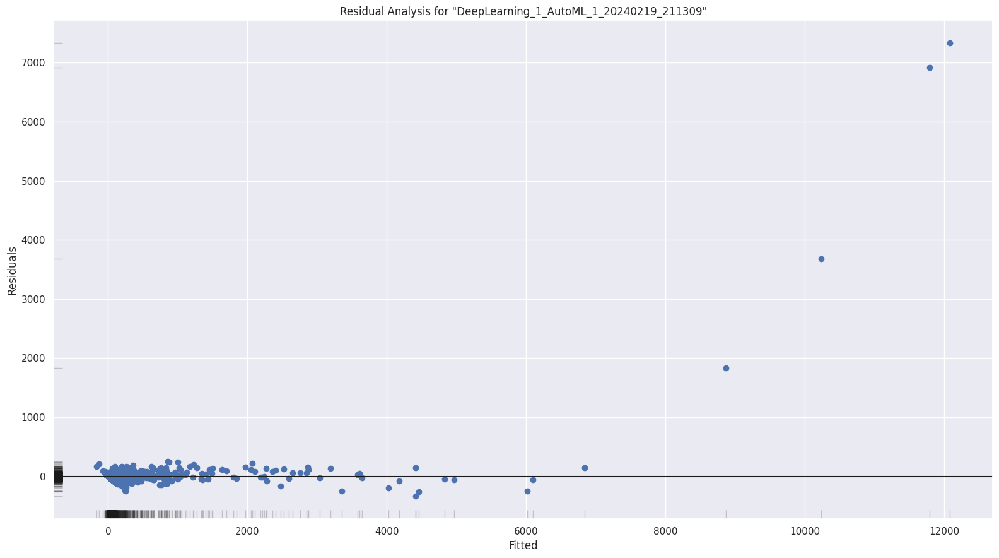

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

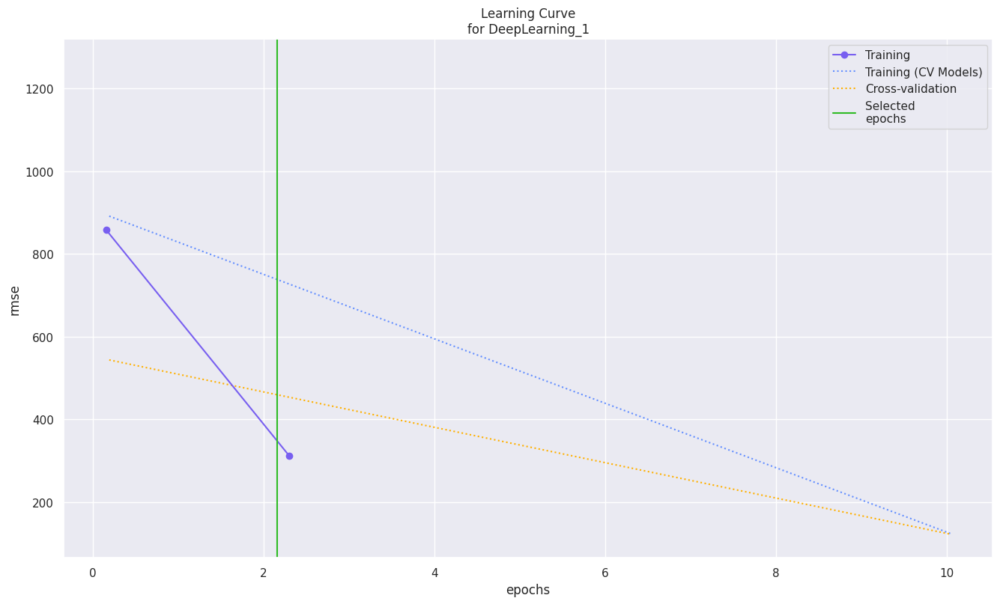

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

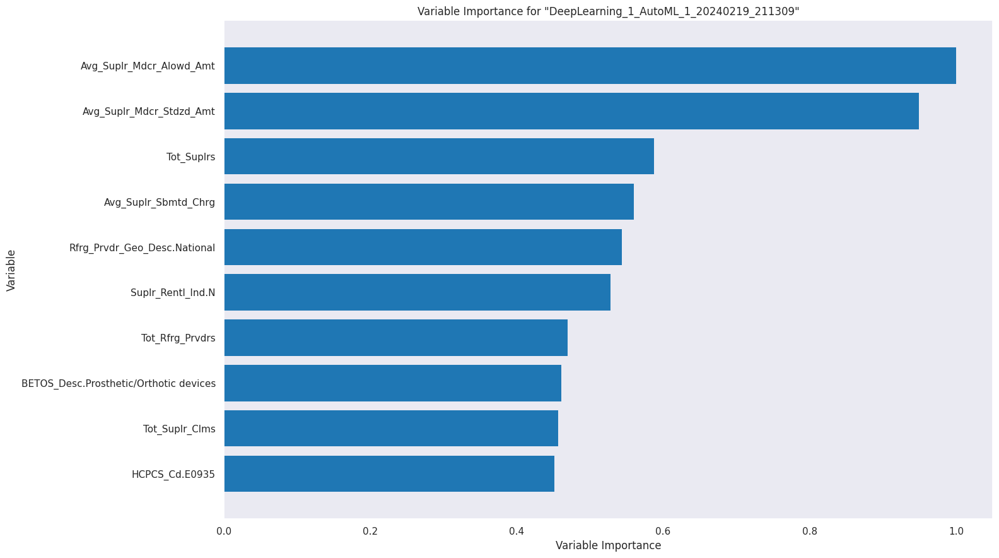

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

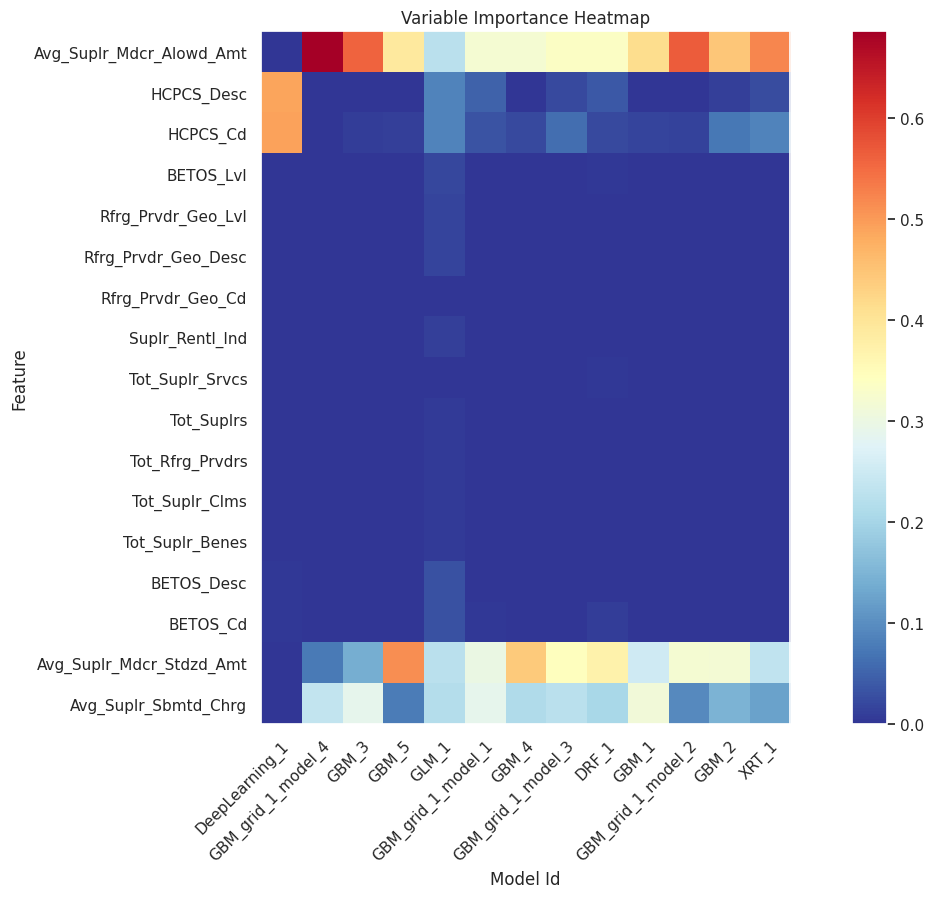

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

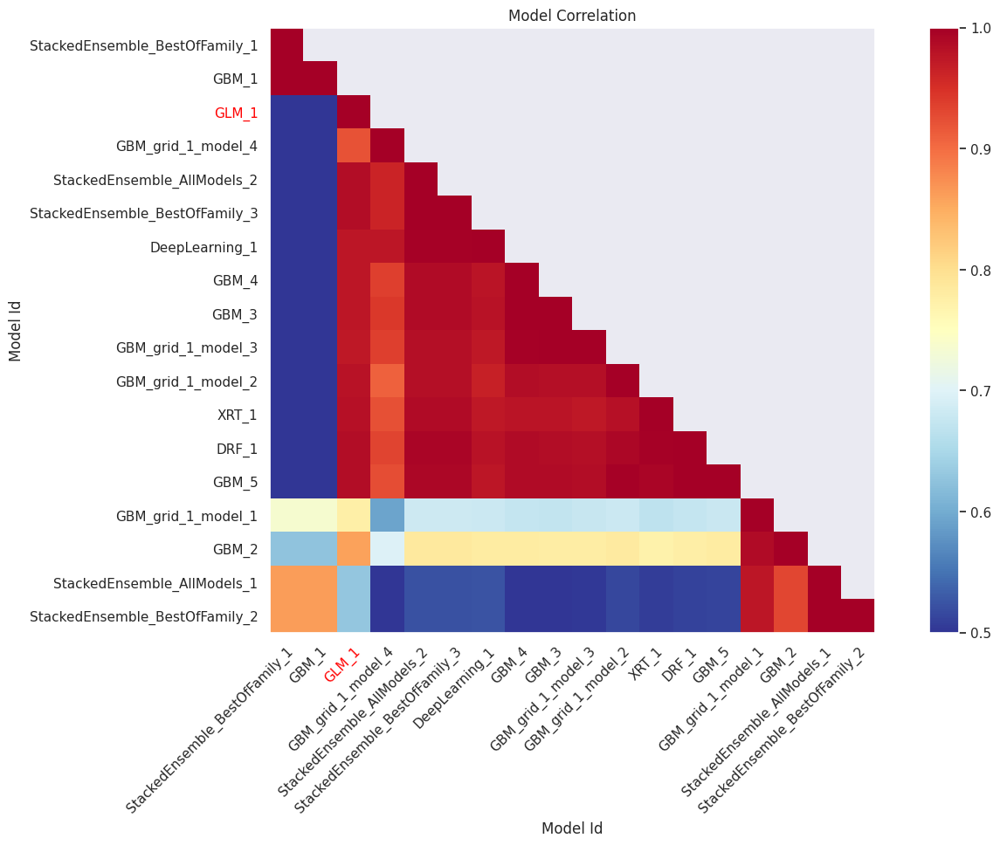

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

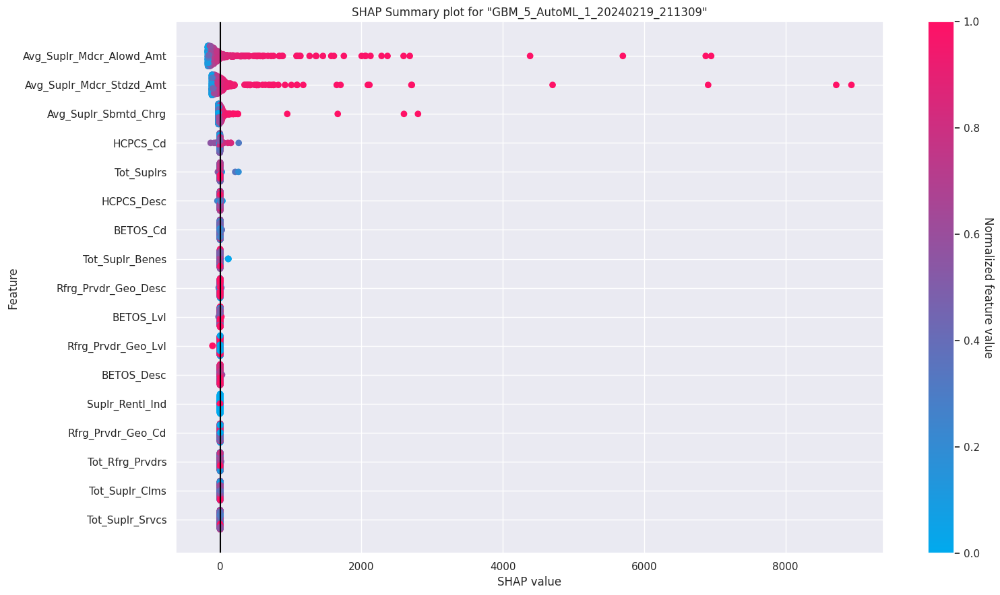

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

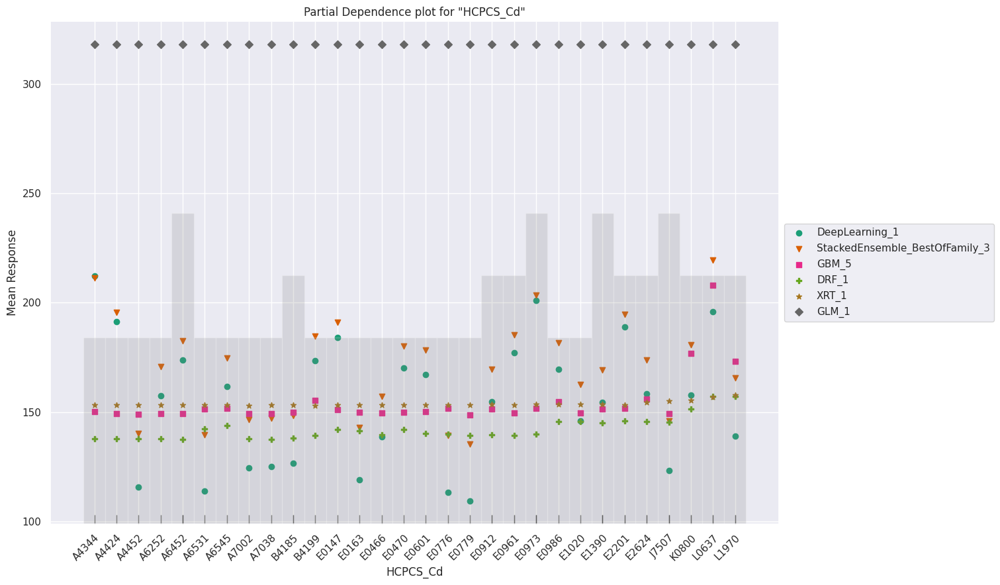

/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1632: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(rect=[0, 0, 0.8, 1])


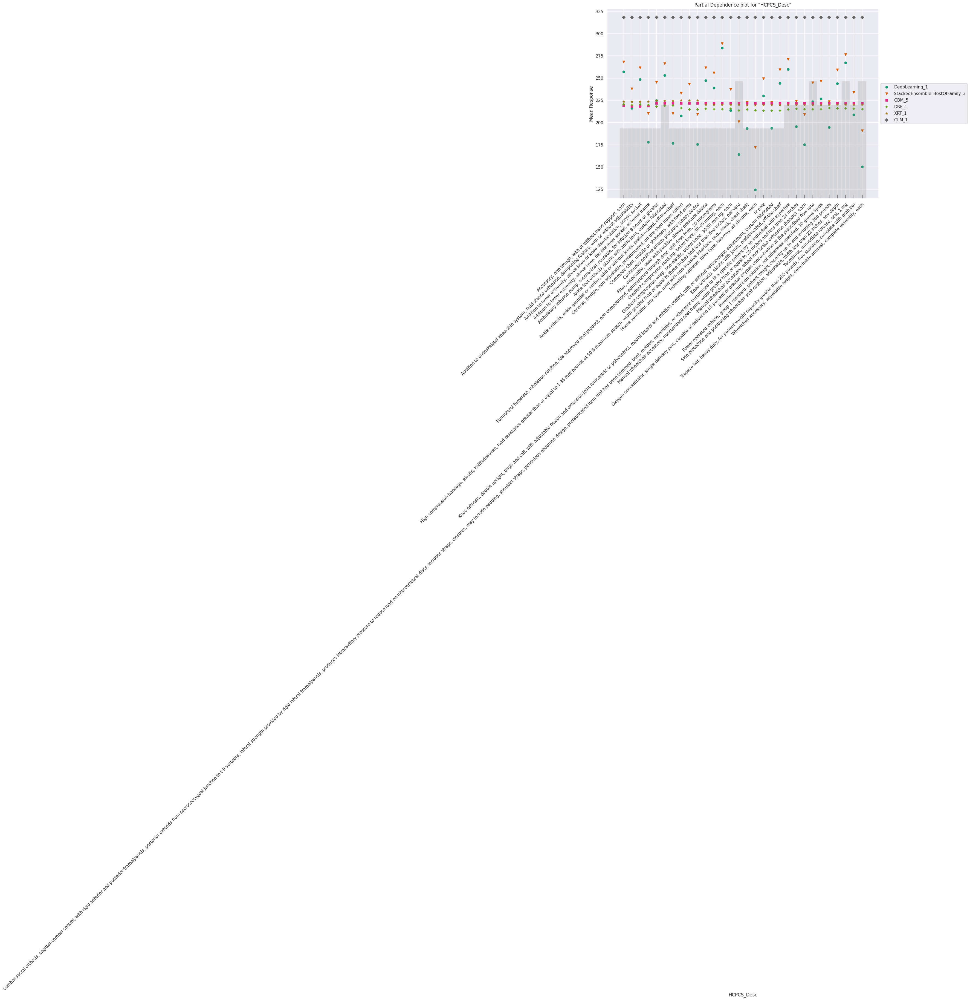

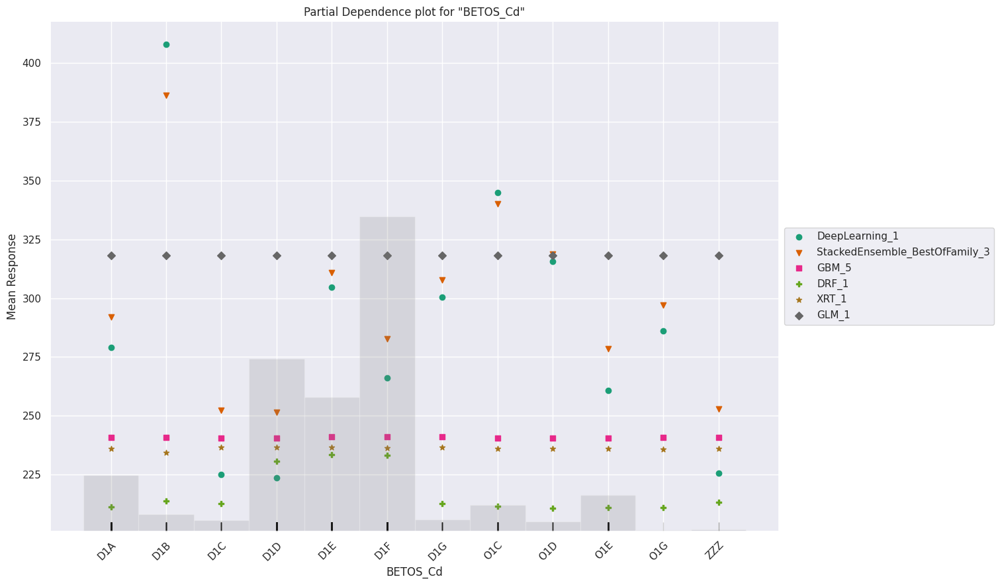

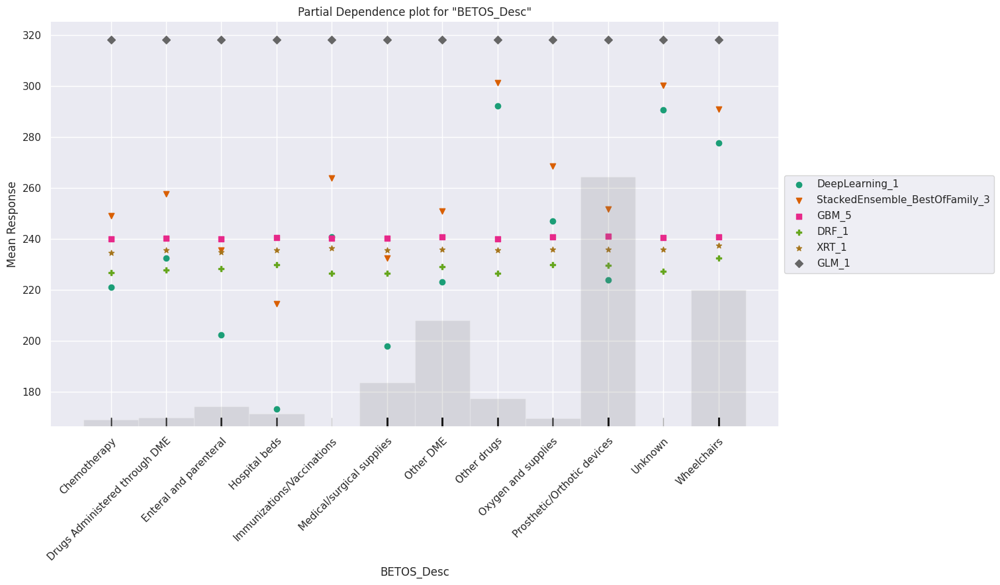

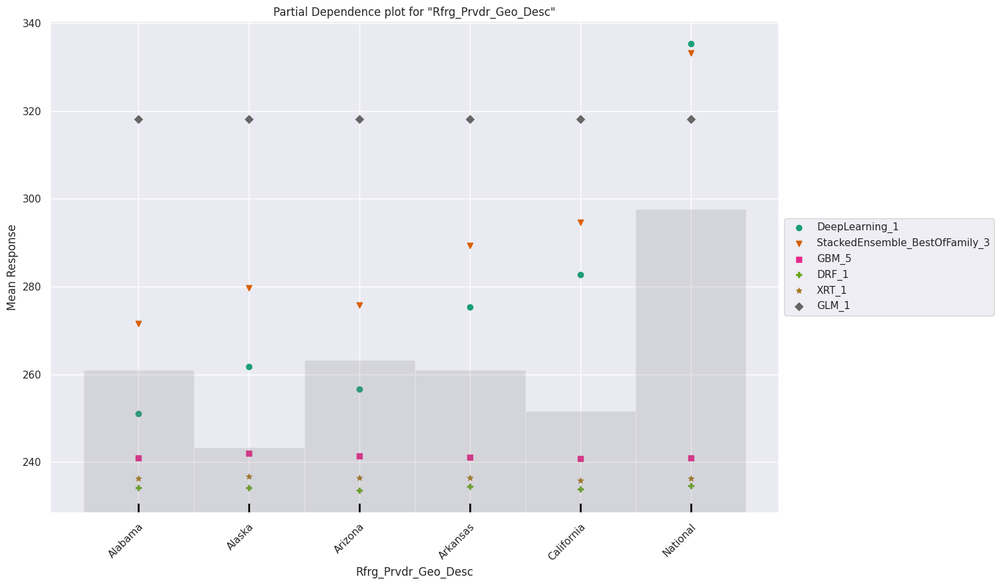

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

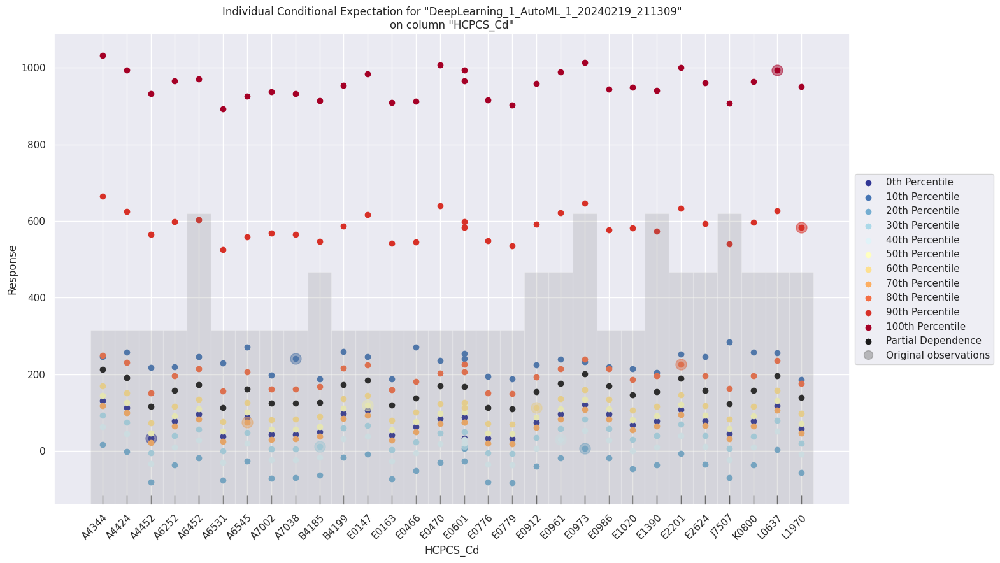

/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1242: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


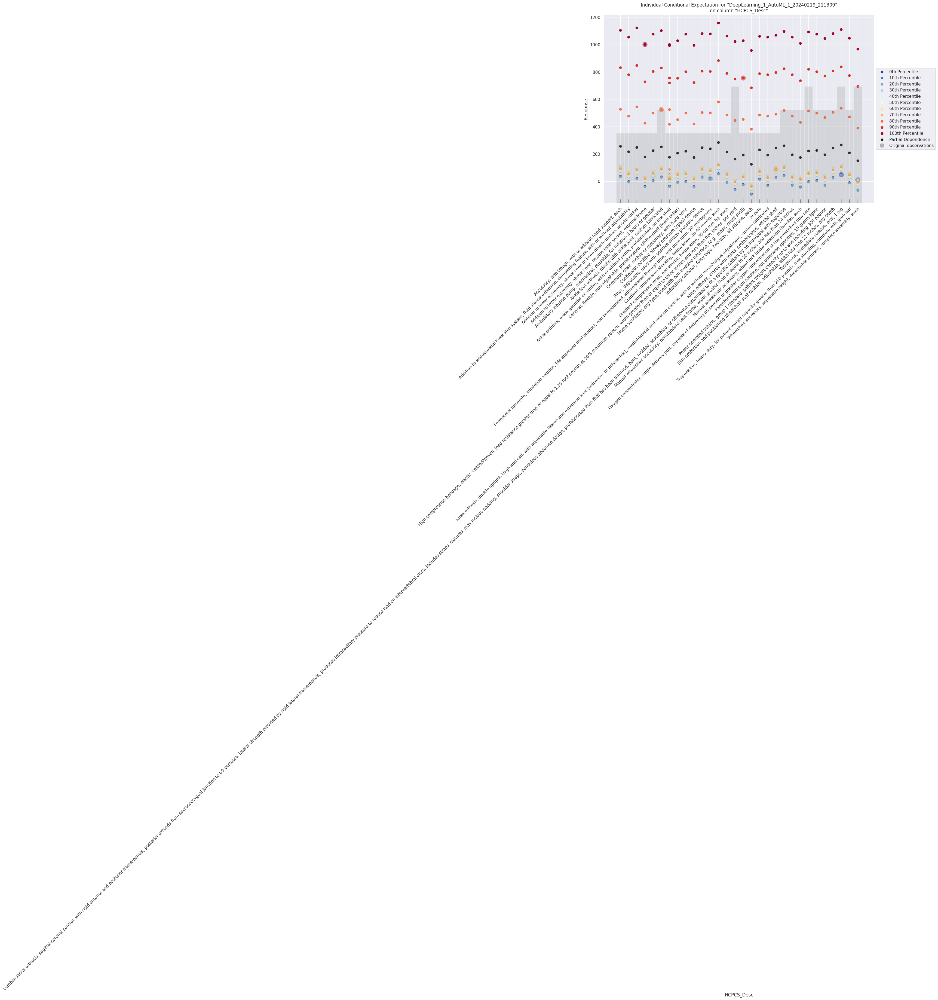

/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "betos_cd" for 0th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "betos_cd" for 10th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "betos_cd" for 20th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)


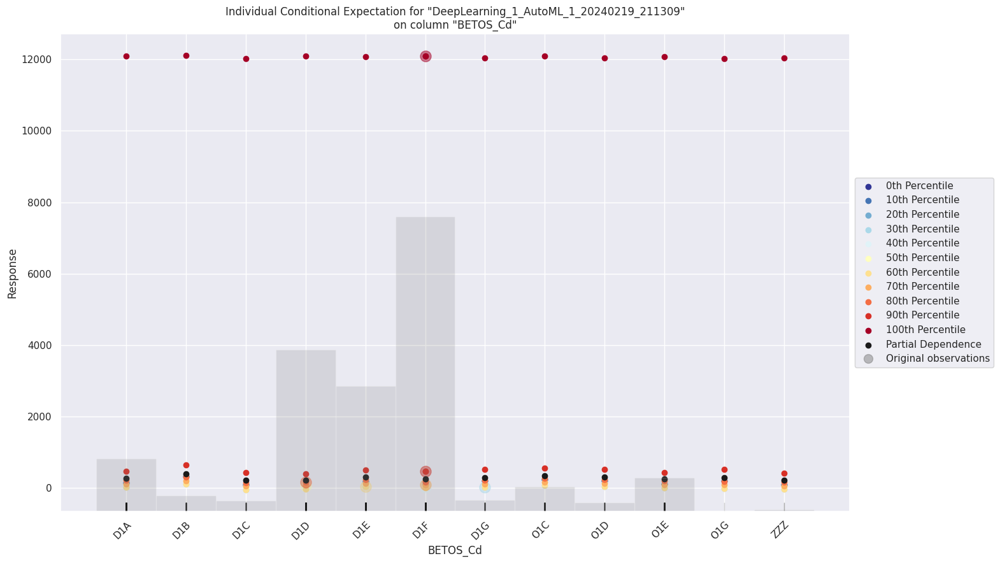

/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "betos_desc" for 0th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "betos_desc" for 10th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "betos_desc" for 20th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)


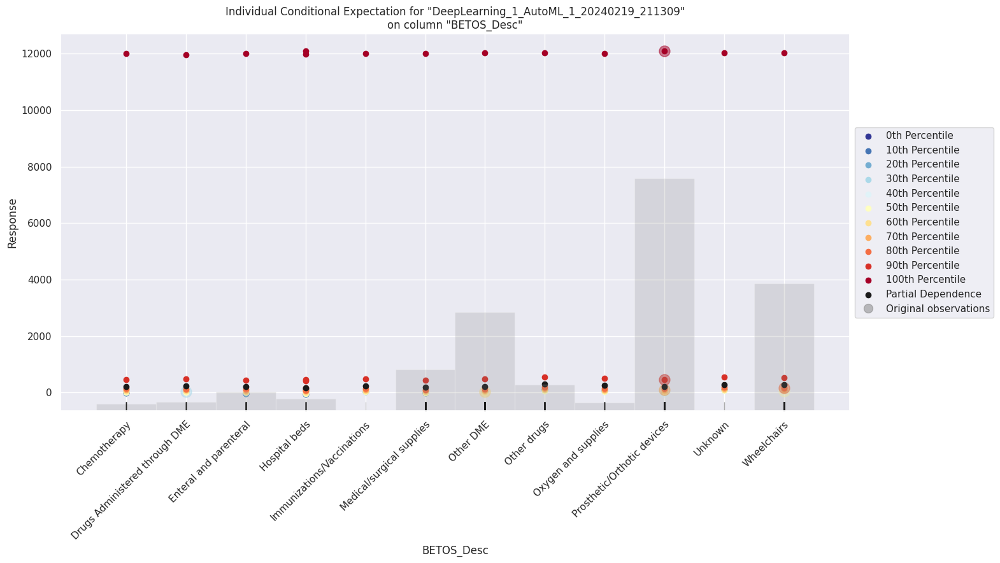

/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "rfrg_prvdr_geo_desc" for 0th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "rfrg_prvdr_geo_desc" for 10th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/h2o/explanation/_explain.py:1728: UserWarning: Original observation of "rfrg_prvdr_geo_desc" for 20th Percentile is [.missing(NA), 115.54017845301345]. Plotting of NAs is not yet supported.
  warnings.warn(msg)


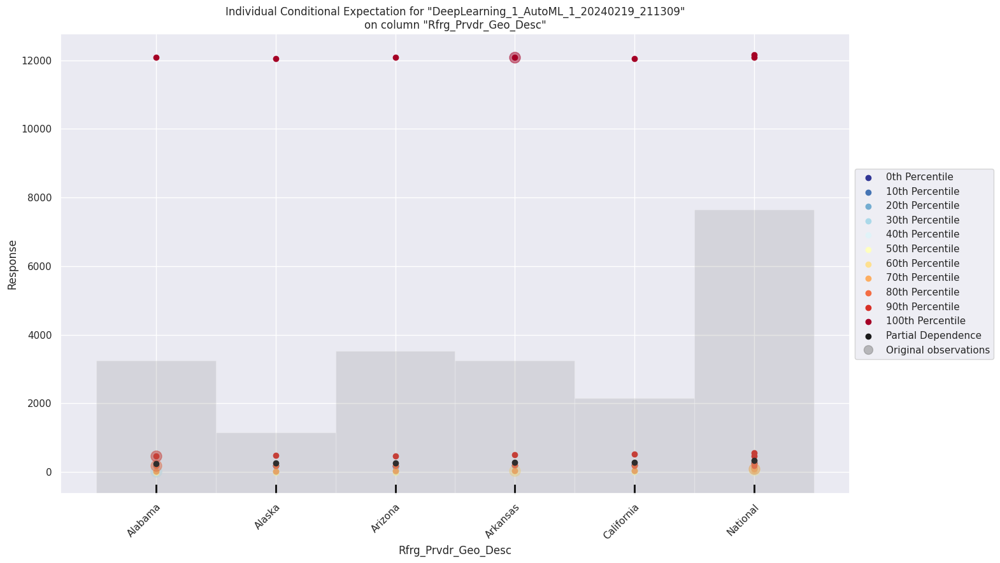

In [73]:
exa = aml.explain(df_test)

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**



The import statement import statsmodels.formula.api as smf imports the statsmodels library, specifically the formula API (statsmodels.formula.api), and aliases it as smf. Statsmodels is a Python library used for estimating and interpreting statistical models. The formula API allows users to specify models using R-style formulas, which makes it convenient for fitting regression models and conducting statistical analyses. In this context, smf will be used to create and fit ordinary least squares (OLS) regression models.

In [74]:
import statsmodels.formula.api as smf  # OLS model Library


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**



The code snippet pandas_df = h2o.as_list(df) converts a H2O DataFrame (df) to a pandas DataFrame (pandas_df). The h2o.as_list() function is a method provided by the H2O library that converts an H2O DataFrame to a list-like object. By assigning the result to pandas_df, it's implied that the intention is to convert the H2O DataFrame into a pandas DataFrame, likely for further analysis or manipulation using pandas functionalities. This conversion allows for seamless integration between H2O and pandas, leveraging the strengths of both libraries for data processing and analysis.

In [75]:
import h2o

pandas_df = h2o.as_list(df)

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


In [76]:
dff.dtypes


Rfrg_Prvdr_Geo_Lvl           object
Rfrg_Prvdr_Geo_Cd           float64
Rfrg_Prvdr_Geo_Desc          object
BETOS_Lvl                    object
BETOS_Cd                     object
BETOS_Desc                   object
HCPCS_Cd                     object
HCPCS_Desc                   object
Suplr_Rentl_Ind              object
Tot_Rfrg_Prvdrs             float64
Tot_Suplrs                  float64
Tot_Suplr_Benes             float64
Tot_Suplr_Clms              float64
Tot_Suplr_Srvcs             float64
Avg_Suplr_Sbmtd_Chrg        float64
Avg_Suplr_Mdcr_Alowd_Amt    float64
Avg_Suplr_Mdcr_Pymt_Amt     float64
Avg_Suplr_Mdcr_Stdzd_Amt    float64
dtype: object

In [77]:
dff.columns

Index(['Rfrg_Prvdr_Geo_Lvl', 'Rfrg_Prvdr_Geo_Cd', 'Rfrg_Prvdr_Geo_Desc',
       'BETOS_Lvl', 'BETOS_Cd', 'BETOS_Desc', 'HCPCS_Cd', 'HCPCS_Desc',
       'Suplr_Rentl_Ind', 'Tot_Rfrg_Prvdrs', 'Tot_Suplrs', 'Tot_Suplr_Benes',
       'Tot_Suplr_Clms', 'Tot_Suplr_Srvcs', 'Avg_Suplr_Sbmtd_Chrg',
       'Avg_Suplr_Mdcr_Alowd_Amt', 'Avg_Suplr_Mdcr_Pymt_Amt',
       'Avg_Suplr_Mdcr_Stdzd_Amt'],
      dtype='object')



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code conducts Ordinary Least Squares (OLS) regression analysis using the statsmodels library in Python. Here's a breakdown of the code:

smf.ols(...): This function initializes an OLS regression model using the specified formula and dataset. The formula "quality ~ fixed_acidity + volatile_acidity + citric_acid + residual_sugar + chlorides + free_sulfur_dioxide + total_sulfur_dioxide + density + pH + sulphates + alcohol" defines the relationship between the dependent variable quality and the independent variables fixed_acidity, volatile_acidity, etc.

.fit(): This method fits the OLS model to the data, estimating the coefficients of the independent variables that best explain the variation in the dependent variable.

results.summary(): This method generates a summary table that provides detailed information about the regression results. It includes statistics such as coefficients, standard errors, t-values, p-values, confidence intervals, and measures of goodness-of-fit like R-squared.

Overall, the code allows for the estimation and examination of the OLS regression model's coefficients and statistical significance, providing insights into the relationship between the quality of wine and its chemical properties.

In [78]:
results = smf.ols(
    "Avg_Suplr_Mdcr_Pymt_Amt ~ Tot_Rfrg_Prvdrs + Tot_Suplrs + Tot_Suplr_Benes + Tot_Suplr_Clms + Tot_Suplr_Srvcs + Avg_Suplr_Sbmtd_Chrg + Avg_Suplr_Mdcr_Alowd_Amt + Avg_Suplr_Mdcr_Pymt_Amt + Avg_Suplr_Mdcr_Stdzd_Amt',
    data=pandas_df,
).fit()

results.summary()

PatsyError: Error evaluating factor: NameError: name 'quality' is not defined
    quality ~ fixed_acidity + volatile_acidity + citric_acid + residual_sugar + chlorides + free_sulfur_dioxide + total_sulfur_dioxide +density + pH + sulphates + alcohol
    ^^^^^^^



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code conducts Ordinary Least Squares (OLS) regression analysis using the statsmodels library in Python. Here's an explanation of the code:

smf.ols(...): This function initializes an OLS regression model using the specified formula and dataset. The formula "Avg_Suplr_Mdcr_Pymt_Amt ~ Tot_Rfrg_Prvdrs + Tot_Suplrs + Tot_Suplr_Benes + Tot_Suplr_Clms + Tot_Suplr_Srvcs + Avg_Suplr_Sbmtd_Chrg + Avg_Suplr_Mdcr_Alowd_Amt + Avg_Suplr_Mdcr_Stdzd_Amt" defines the relationship between the dependent variable Avg_Suplr_Mdcr_Pymt_Amt and the independent variables Tot_Rfrg_Prvdrs, Tot_Suplrs, etc.

.fit(): This method fits the OLS model to the data, estimating the coefficients of the independent variables that best explain the variation in the dependent variable.

results.summary(): This method generates a summary table that provides detailed information about the regression results. It includes statistics such as coefficients, standard errors, t-values, p-values, confidence intervals, and measures of goodness-of-fit like R-squared.

Overall, the code allows for the estimation and examination of the OLS regression model's coefficients and statistical significance, providing insights into the relationship between Avg_Suplr_Mdcr_Pymt_Amt and the predictor variables.


-







This is the summary of the OLS regression results:

Dependent Variable: Avg_Suplr_Mdcr_Pymt_Amt
R-squared: 1.000 (The proportion of the variance in the dependent variable that is predictable from the independent variables. A value of 1.0 indicates a perfect fit.)
Adj. R-squared: 1.000 (A modified version of R-squared that adjusts for the number of predictors in the model.)
F-statistic: 2.579e+06 (The overall significance of the regression model. A high F-statistic indicates that the regression model as a whole is statistically significant.)
Prob (F-statistic): 0.00 (The probability associated with the F-statistic. A low p-value suggests that the regression model is significant.)
AIC: 3.863e+04 (Akaike Information Criterion, a measure of the relative quality of a statistical model for a given set of data.)
BIC: 3.868e+04 (Bayesian Information Criterion, similar to AIC but penalizes more complex models.)
Coefficient: The estimated coefficients for each independent variable, indicating the change in the dependent variable for a one-unit change in the predictor, holding all other predictors constant.
Standard Error: The standard error of the coefficient estimate.
t-value: The t-statistic, which measures the number of standard deviations that the coefficient estimate is away from zero. Larger absolute t-values indicate more significant coefficients.
P>|t|: The p-value associated with the t-statistic. It indicates the probability of observing the t-value if the null hypothesis (that the coefficient is zero) is true.
[0.025 0.975]: The 95% confidence interval for the coefficient.
Omnibus, Durbin-Watson, Jarque-Bera, Skew, Kurtosis: Tests and statistics related to the normality of residuals.
Prob(Omnibus), Prob(JB): Probabilities associated with the Omnibus and Jarque-Bera tests. Low probabilities suggest non-normality of residuals.
Cond. No.: Condition number, which measures multicollinearity. A large condition number indicates multicollinearity or numerical problems.






In [79]:
results = smf.ols(
    "Avg_Suplr_Mdcr_Pymt_Amt ~ Tot_Rfrg_Prvdrs + Tot_Suplrs + Tot_Suplr_Benes + Tot_Suplr_Clms + Tot_Suplr_Srvcs + Avg_Suplr_Sbmtd_Chrg + Avg_Suplr_Mdcr_Alowd_Amt  + Avg_Suplr_Mdcr_Stdzd_Amt",
    data=dff,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               OLS Regression Results                              
===================================================================================
Dep. Variable:     Avg_Suplr_Mdcr_Pymt_Amt   R-squared:                       1.000
Model:                                 OLS   Adj. R-squared:                  1.000
Method:                      Least Squares   F-statistic:                 2.579e+06
Date:                     Mon, 19 Feb 2024   Prob (F-statistic):               0.00
Time:                             21:24:03   Log-Likelihood:                -19304.
No. Observations:                     4514   AIC:                         3.863e+04
Df Residuals:                         4505   BIC:                         3.868e+04
Df Model:                                8                                         
Covariance Type:                 nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                   -1.6172      0.280     -5.783      0.000      -2.165      -1.069
Tot_Rfrg_Prvdrs           1.651e-05   5.51e-05      0.300      0.764   -9.15e-05       0.000
Tot_Suplrs               -2.948e-05      0.000     -0.150      0.881      -0.000       0.000
Tot_Suplr_Benes          -1.051e-07   9.15e-06     -0.011      0.991    -1.8e-05    1.78e-05
Tot_Suplr_Clms           -6.943e-07   2.88e-06     -0.241      0.810   -6.35e-06    4.96e-06
Tot_Suplr_Srvcs           6.116e-09   2.26e-08      0.271      0.787   -3.82e-08    5.04e-08
Avg_Suplr_Sbmtd_Chrg         0.0019      0.000      4.694      0.000       0.001       0.003
Avg_Suplr_Mdcr_Alowd_Amt     0.7179      0.004    169.410      0.000       0.710       0.726
Avg_Suplr_Mdcr_Stdzd_Amt     0.0932      0.005     17.139      0.000       0.083       0.104
==============================================================================
Omnibus:                     7421.567   Durbin-Watson:                   1.960
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         27151064.473
Skew:                         -10.150   Prob(JB):                         0.00
Kurtosis:                     382.400   Cond. No.                     1.27e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.27e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code snippet splits the pandas_df DataFrame into three subsets: train, validate, and test. Here's a breakdown of what each part does:

pandas_df.sample(frac=1, random_state=42): This randomly shuffles the rows of the DataFrame using sample(frac=1), which selects a fraction of rows (in this case, all of them) in a random order. random_state=42 ensures reproducibility by fixing the random seed.

np.split(..., [int(0.6 * len(df)), int(0.8 * len(df))]): This splits the shuffled DataFrame into three subsets based on the provided indices. The first index (int(0.6 * len(df))) determines the end of the first subset (60% of the data), and the second index (int(0.8 * len(df))) determines the end of the second subset (80% of the data).

h2o.H2OFrame(...): This converts each subset (train, validate, test) into H2OFrame objects, which are compatible with the H2O library for machine learning tasks. H2OFrame is a data structure optimized for large-scale data processing and modeling with H2O.

In [80]:
train, validate, test = np.split(
    pandas_df.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [81]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The gbm_parameters dictionary contains hyperparameters for tuning a Gradient Boosting Machine (GBM) model. Here's an explanation of each parameter:

"learn_rate": This parameter controls the step size at each iteration while moving toward a minimum of the loss function during the gradient descent process. The values specified are a list of learning rates ranging from 0.01 to 0.1, incremented by 0.01.

"max_depth": This parameter determines the maximum depth of each tree in the GBM model. A larger value can lead to more complex models, potentially capturing more intricate patterns in the data but also increasing the risk of overfitting. The values specified range from 2 to 10, indicating the depth of the trees.

"sample_rate": This parameter specifies the fraction of rows to randomly sample from the dataset for each tree construction iteration. It helps in reducing overfitting by introducing randomness. The values specified range from 0.5 to 1.0, incremented by 0.1, representing sampling rates from 50% to 100% of the data.

"col_sample_rate": This parameter specifies the fraction of columns (features) to randomly sample for each tree construction iteration. Similar to sample_rate, it helps in reducing overfitting by introducing randomness in feature selection. The values specified range from 0.1 to 1.0, incremented by 0.1, representing sampling rates from 10% to 100% of the features.

Together, these parameters provide a grid of combinations for hyperparameter tuning, allowing for the selection of the optimal configuration that maximizes model performance while avoiding overfitting.

In [82]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The code snippet defines a grid search for tuning hyperparameters of a Gradient Boosting Machine (GBM) model using H2O's H2OGridSearch module. Here's an explanation of each component:

model=H2OGradientBoostingEstimator: Specifies the type of model to be tuned, which is a Gradient Boosting Machine in this case.

grid_id="gbm_grid2": Assigns an identifier to the grid search, which is useful for referencing the grid search results later.

hyper_params=gbm_parameters: Specifies the hyperparameter grid to be explored during the search. The gbm_parameters dictionary contains the hyperparameters to be tuned along with their respective value ranges.

search_criteria=search_criteria: Optionally, you can specify search criteria to control aspects of the grid search, such as the maximum number of models to build or the strategy for selecting the best models. search_criteria should be a dictionary containing the search criteria. However, the search_criteria dictionary is not provided in the code snippet, so its details are not available.

Overall, this grid search will explore various combinations of hyperparameters specified in the gbm_parameters dictionary to find the optimal configuration for the GBM model based on the specified search criteria.







In [83]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The provided code trains the grid search gbm_grid2 on the specified training and validation datasets (train and validate, respectively) using the H2OGradientBoostingEstimator. Here's what each argument does:

x: The list of column names or indices representing the predictor variables.
y: The column name or index representing the response variable.
training_frame: The H2OFrame containing the training data.
validation_frame: The H2OFrame containing the validation data.
ntrees: The number of trees to grow in the GBM. Here, it's set to 100.
seed: The random seed for reproducibility.
This code will fit multiple GBM models, each with a different combination of hyperparameters specified in the grid search gbm_parameters. The models will be trained and validated on the provided datasets (train and validate). The ntrees parameter specifies the maximum number of trees to grow for each model in the grid search.

After training, the grid search will evaluate the performance of each model based on the validation data and select the best-performing model according to the specified search criteria.



-



The provided summary shows the results of the grid search for the gradient boosting machine (GBM) model. Each row represents a model trained with different combinations of hyperparameters. Here's an explanation of the columns:

col_sample_rate: The column sample rate, representing the proportion of columns randomly sampled as candidates for splitting at each tree node.
learn_rate: The learning rate, which controls the step size at each iteration of the boosting process.
max_depth: The maximum depth of each tree in the ensemble.
sample_rate: The row sample rate, indicating the proportion of rows randomly sampled for each tree.
model_ids: The unique identifier for each model generated by the grid search.
residual_deviance: The residual deviance, which measures the goodness of fit of the model to the data. Lower values indicate better fit.
The models are sorted in ascending order of residual deviance, with the best-performing models appearing at the top. Each row provides information about the hyperparameters used for that model and its corresponding residual deviance. The best model is typically selected based on the lowest residual deviance or other relevant performance metrics.












In [84]:
gbm_grid2.train(
    x=X, y=y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.5,0.1,9.0,1.0,gbm_grid2_model_7,77252.6047457
,0.6000000,0.1,4.0,1.0,gbm_grid2_model_22,79916.5333404
,0.4,0.08,6.0,0.9,gbm_grid2_model_28,85026.6611613
,0.6000000,0.09,3.0,0.8,gbm_grid2_model_1,87294.1658353
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,88794.2015933
,0.9,0.09,8.0,0.9,gbm_grid2_model_36,94661.4456338
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,97758.7191110
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,98607.0487688
,0.9,0.1,4.0,0.7000000,gbm_grid2_model_15,98886.3811957
,0.5,0.05,2.0,0.8,gbm_grid2_model_27,100283.7032372



**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The code gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False) retrieves the grid search results (gbm_grid2) and creates a new object (gbm_gridperf2) containing the grid search performance metrics sorted by residual deviance in ascending order.

Here's an explanation of the parameters used:

sort_by: Specifies the metric to sort the grid search results by. In this case, it's set to "residual_deviance", meaning the results will be sorted based on residual deviance.
decreasing: Specifies whether to sort the results in decreasing order (True) or increasing order (False). Since decreasing is set to False, the results will be sorted in ascending order of residual deviance.
This sorted grid search object (gbm_gridperf2) can then be used to analyze the performance of models generated during the grid search and select the best-performing model based on the chosen metric.

In [85]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


The gbm_gridperf2 object likely contains the results of the grid search performed using H2O's Gradient Boosting Machine (GBM) estimator. This object should provide detailed information about the performance of each model trained with different hyperparameter configurations.

When printed or viewed, it likely displays a summary of the grid search results, including the hyperparameters used for each model, their corresponding evaluation metrics, and possibly other relevant information like model IDs.

If you print or view the gbm_gridperf2 object, you should see a tabular representation of these results, organized in a structured format for easy analysis and comparison of different models.

---


This summary provides the results of the hyper-parameter search for the GBM model. Here's an explanation of the columns:

col_sample_rate: The column sampling rate, representing the fraction of columns randomly sampled for each tree split.
learn_rate: The learning rate, determining the step size at each iteration of boosting.
max_depth: The maximum depth of each tree in the GBM.
sample_rate: The row (observation) sampling rate, indicating the fraction of rows randomly sampled for each tree.
model_ids: The IDs of the models generated during the grid search.
residual_deviance: The residual deviance, a measure of the discrepancy between the observed and predicted values.
The summary is ordered by increasing residual deviance, allowing for easy comparison of model performance based on this metric. Lower residual deviance values indicate better model performance. Each row represents a different combination of hyperparameters, and the corresponding model's performance in terms of residual deviance.

For example, the first row shows a model with a col_sample_rate of 0.5, learn_rate of 0.1, max_depth of 9.0, sample_rate of 1.0, and a residual deviance of 77252.6047457.

In [86]:
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.5,0.1,9.0,1.0,gbm_grid2_model_7,77252.6047457
,0.6000000,0.1,4.0,1.0,gbm_grid2_model_22,79916.5333404
,0.4,0.08,6.0,0.9,gbm_grid2_model_28,85026.6611613
,0.6000000,0.09,3.0,0.8,gbm_grid2_model_1,87294.1658353
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,88794.2015933
,0.9,0.09,8.0,0.9,gbm_grid2_model_36,94661.4456338
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,97758.7191110
,0.5,0.05,7.0,0.9,gbm_grid2_model_2,98607.0487688
,0.9,0.1,4.0,0.7000000,gbm_grid2_model_15,98886.3811957
,0.5,0.05,2.0,0.8,gbm_grid2_model_27,100283.7032372


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


This code iterates over the models generated by the grid search (gbm_gridperf2) and retrieves the hyperparameters for each model. It collects these hyperparameters into a list named list_hyperparameters. Each element in this list is a dictionary containing the hyperparameters of a particular model.

Here's a breakdown of what each part of the code does:

range(36): This creates a sequence of numbers from 0 to 35 (exclusive), which corresponds to the number of models generated by the grid search.
gbm_gridperf2.get_hyperparams_dict(i): This retrieves the hyperparameters of the i-th model in the grid search results. The get_hyperparams_dict method takes the index of the model as an argument and returns a dictionary containing its hyperparameters.
list_hyperparameters.append(hyperparameters): This appends the dictionary of hyperparameters obtained from the current model to the list_hyperparameters list.
Overall, this code is useful for extracting and organizing the hyperparameters of each model generated during the grid search, allowing for further analysis or comparison of model configurations.italicized text

In [87]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**


In the code models = gbm_gridperf2.models, gbm_gridperf2 is likely an object that represents the result of a grid search performed on a gradient boosting machine (GBM) model using H2O's machine learning platform.

Here's an explanation of the code:

gbm_gridperf2: This is an object that represents the result of the grid search performed on the GBM model.
.models: This is a method or attribute of the gbm_gridperf2 object that retrieves the list of models generated during the grid search.
So, models will be a list containing the different GBM models generated during the grid search, each corresponding to a different combination of hyperparameters specified in the grid search. These models can then be further analyzed, compared, or used for making predictions on new data.

In [88]:
models = gbm_gridperf2.models

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

Here's what each part does:

list_residual_deviance: This is an empty list that will store the mean residual deviance for each model.

for i in range(36):: This loop iterates over each model generated during the grid search. Since you mentioned there are 36 models, it loops 36 times.

model = models[i]: Retrieves the ith model from the list of models generated during the grid search.

performance_metrics = model.model_performance(validate): Evaluates the performance of the current model on the validation dataset (validate) and computes performance metrics, such as mean residual deviance.

residual_deviance = performance_metrics.mean_residual_deviance(): Extracts the mean residual deviance from the performance metrics.

list_residual_deviance.append(residual_deviance): Appends the mean residual deviance of the current model to the list_residual_deviance list.

After executing this code, list_residual_deviance will contain the mean residual deviance for each model in the grid search results, allowing you to analyze and compare the performance of different models.

In [89]:
list_residual_deviance = []

for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

Here's what each part does:

for i in range(36):: This loop iterates over each index i in the range from 0 to 35 (inclusive), corresponding to the 36 models generated during the grid search.

list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]: For each model indexed by i, it adds a new key-value pair to the dictionary stored at index i in list_hyperparameters. The key is "Residual_Deviance" and the value is the mean residual deviance computed for that specific model, retrieved from list_residual_deviance using the same index i.

This code essentially associates each model's hyperparameters (stored in list_hyperparameters) with its corresponding mean residual deviance, providing a comprehensive view of both hyperparameters and performance metrics for each model in the grid search results.

In [90]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]


**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The code hyperparameters_dataframe = pd.DataFrame(list_hyperparameters) creates a Pandas DataFrame from the list of hyperparameters (list_hyperparameters). Here's what each part does:

pd.DataFrame(): This is a constructor method from the Pandas library used to create a DataFrame.

list_hyperparameters: This is a list containing dictionaries, where each dictionary represents the hyperparameters of a specific model generated during the grid search.

By passing list_hyperparameters as an argument to pd.DataFrame(), the constructor method will interpret each dictionary in the list as a row in the DataFrame, with keys becoming column names and values becoming the corresponding values in the DataFrame.

So, hyperparameters_dataframe will be a DataFrame where each row represents a model, and the columns represent different hyperparameters, along with their respective values for each model. This DataFrame provides a structured and tabular representation of the hyperparameters for all models generated during the grid search.

In [91]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)

In [92]:
print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.5        0.10          9          1.0       77252.604746
1               0.6        0.10          4          1.0       79916.533340
2               0.4        0.08          6          0.9       85026.661161
3               0.6        0.09          3          0.8       87294.165835
4               0.5        0.10          4          0.8       88794.201593
5               0.9        0.09          8          0.9       94661.445634
6               0.9        0.07          4          0.9       97758.719111
7               0.5        0.05          7          0.9       98607.048769
8               0.9        0.10          4          0.7       98886.381196
9               0.5        0.05          2          0.8      100283.703237
10              0.9        0.09          9          0.6      101334.280626
11              0.6        0.09          3          0.9      101807.155326
12              0.7      

**EXPLAINATION OF THE CODE AND THE OUTPUT BELOW**

The code sns.pairplot(hyperparameters_dataframe, y_vars=["Residual_Deviance"], x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"]) creates a pairplot using Seaborn.

Here's what each part does:

sns.pairplot: This is a function from the Seaborn library used to create a grid of pairwise plots to visualize the relationship between different variables in a dataset.

hyperparameters_dataframe: This is the DataFrame containing the hyperparameters of the models generated during the grid search.

y_vars=["Residual_Deviance"]: This parameter specifies the variable(s) to be plotted on the y-axis of the pairplot. In this case, it sets "Residual_Deviance" as the variable to be plotted.

x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"]: This parameter specifies the variable(s) to be plotted on the x-axis of the pairplot. It sets the hyperparameters "col_sample_rate", "learn_rate", "max_depth", and "sample_rate" as the variables to be plotted.

Overall, this code generates a pairplot that visualizes the relationship between the specified hyperparameters and the residual deviance of the models. Each subplot in the pairplot will show how the residual deviance varies with each hyperparameter, providing insights into the effect of each hyperparameter on model performance.

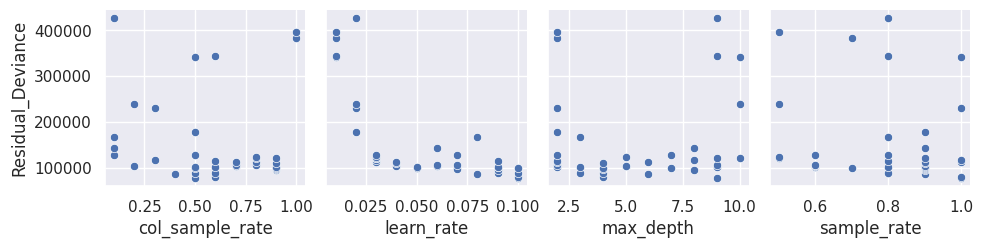

In [93]:

sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

#Question-Answers
# Answer of the given questions-
Answer the following questions for all of the models:

**Q1) Is the relationship significant?**

**ans)**A relationship is said to be statistically significant when the p value for the variables is less than 0.05.P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true. A small p value depicts that there is very little similarity between the two groups and hence null hypothesis can be ignored. P-value was calculated by two ways for this model. From the OLS method it was observed that values for ‘Tot_Rfrg_Prvdrs’  , ‘Tot_Suplrs’ , ‘Tot_Suplr_Benes’ , ‘Tot_Suplr_Clms ‘,’ Tot_Suplr_Srvcs ‘ were greater than 0.05. So, it can be concluded that other that p-value for all the variables of dataset is less than 0.05. Hence for the chosen dataset it can be concluded that the relationship is significant.

**Q2) Are any model assumptions violated?**

**ans)**Assumptions for linear regression are:
Linear relationship- Based on the residual plot we have got, there is no clear evidence of heteroscedasticity. In a residual plot with homoscedasticity, the residuals should be scattered randomly around the horizontal line at zero, with no discernible pattern. The plot we have got shows a relatively random scatter of residuals, without any systematic changes in variance across the range of fitted values. Therefore, it's reasonable to conclude that the residuals in this plot do not exhibit heteroscedasticity. It's important to note that this is just a visual assessment, and other methods may be used to formally test for heteroscedasticity.
No or little multicollinearity-This can be determined by correlation matrix. For this model some of the assumptions are violated. Multicollinearity exists between variables Avg_Suplr_Mdcr_Alowd_Amt and Avg_Suplr_Mdcr_Stdzd_Amt.

**Q3) Is there any multicollinearity in the model?**

**ans)**The condition number is large, 1.27e+07. This might indicate that there are strong multicollinearity or other numerical problems.
data_for_corr = pd.read_csv( 'healthsupplier_2017_deleted.csv’)
sns.heatmap(data_for_corr.corr(),annot=True)

**Q4) In the multivariate models are predictor variables independent of all the other predictor variables?**

**ans)**Variables are said to be independent when there is no relation between them. To check this relation, correlation matrix can be used, or it can be observed from graphs too whether there is any pattern followed or not. When correlation matrix is computed for the model,and Avg_Suplr_Mdcr_Alowd_Amt and Avg_Suplr_Sbmtd_Chrg are correlated to each other. Other than those, Avg_Suplr_Mdcr_Stdzd_Amt and Avg_Suplr_Mdcr_Alowd_Amt some other predictors are also dependent like while others are independent from each other.

**Q5) In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

**ans)**From the variable importance plot, the most to least important variables are displayed. For my model Avg_Suplr_Mdcr_Alowd_Amt, Avg_Suplr_Mdcr_Stdzd_Amt, Tot_Suplrs are top 3 most important variables to determine Average medical Payment amount

**Q6) Does the model make sense?**

**ans)**
For a model to make sense, it should adhere to certain criteria. This includes meeting all underlying assumptions, having statistically significant p-values for the coefficients, and VIF values within their respective ranges to avoid multicollinearity. Additionally, the RMSE should be minimized while considering the range of the target variable. In terms of predictive accuracy, an R² value of at least 0.33 is generally considered good. However, based on the provided metrics for both the Lasso and Rigid models, neither fully meet these criteria. The RMSE values are relatively high, indicating notable errors in prediction, and the R² values are low, suggesting poor explanatory power. To improve the models, several strategies can be employed. This includes potentially dropping less important variables to enhance model simplicity and removing outliers to improve model fit. Furthermore, employing ensemble methods like boosting or using an ensemble model may help increase accuracy by leveraging multiple weaker models.


**Q7) Does regularization help?**

**ans)**Regularization is a technique used for tuning the random noise function by adding an additional term to noise function. This additional term controls the excessively fluctuating function such that the coefficients don’t take extreme values and the prediction of target value for test data is not highly affected. The main use of Regularization is to minimize the validation loss and try to improve the accuracy of the model. For this model Ridge Regularization was used on training data. It was observed that Root Mean Square Error (RMSE) and R2 was calculated twice, once when regularization was not applied and once when regularization was applied. The values were  not same in both the cases. Hence it can be concluded that for this model regularization help.


**Q8) Which independent variables are significant?**

**ans)**The independent variables important for predictions of AutoMl alogorithm in given dataset were
    1)Avg_Suplr_Mdcr_Alowd_Amt
    2) Avg_Suplr_Mdcr_Stdzd_Amt
    3) Tot_Suplrs
   and these 3 independent variables are important to analyse the dependent variable and that is                      " Avg_Suplr_Mdcr_Pymt_Amt ".


**Q9) Which hyperparameters are important?**

**ans)**Through below commands-
best_model = h2o.get_model(aml.leaderboard[0,'model_id'])

   best_model.algo
   
   we get deeplearning as the best hyperparameter through leaderboard command.





#Conclusion of this code
# What This code is exactly doing(model's working)

I'll provide a brief summary of what the code is doing:

1)Import necessary libraries: The code begins by importing various Python libraries and H2O-related modules for data analysis and modeling.

2)Download dataset: It downloads a diabetes dataset from Kaggle using the opendatasets library and specifies the data directory.

3)Data exploration and visualization: The code then explores the data by generating scatter plots and correlation heatmaps using seaborn.

4)Initialize H2O: It initializes H2O cluster for further analysis.

5)Load the dataset with H2O: The dataset is loaded into H2O's data frame for analysis using the h2o.import_file() function.

6)Data split: It splits the data into training and test sets using the split_frame() method.

7)Build and train models: The code builds and trains two models, a Generalized Linear Model (GLM) and a Gradient Boosting Machine (GBM), using H2O's modeling functions.

8)Variable importances: The code calculates and displays variable importances for both models.

9)Explainability: It explains the models by providing feature importance information and plots if the models are XGBoost, DRF, or GBM.

10)AutoML: The code sets up AutoML for automated model selection and training.

11)Train AutoML: It trains AutoML on the dataset with a specified runtime.

12)Leaderboard: The leaderboard of models generated by AutoML is displayed.

13)Model selection: The best model is selected from the leaderboard.

14)Model explanation: If the best model is XGBoost, DRF, or GBM, its variable importances are plotted. Otherwise, the model's parameters are displayed.

15)Other best model: The code also looks at the variable importances for the model that ranks fifth on the leaderboard.






# Did I explain my evaluation clearly?
model_start_time = time.time()
  
aml.train(x=X,y=myY,training_frame=train)

We have implemented above commands to find the time require and we get the accuracy of the model through cross validation as well as scoring history and these two tables in the output consists all the values such as root mean square,residual deviance and time deviance etc. and hence avoid the overfitting of the data while implementing algorithm ,so yes I have explain my evaluation well through conclusion,abstract as well as this cross validation.
Secondly I have split the data well above in training as well as testing data,so as to remove any sort of overfitting.

# LICENSE
MIT License

Copyright (c) 2023 AI Skunks

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# References:-
1)AutoMl vs Traditioal ML model-https://www.youtube.com/watch?v=BpK1RMYclsY.
2)The notebbok used for reference-https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/6105_AutoML_The_World_Happiness_Data.ipynb.
3)Brief description about Automated ML-https://en.wikipedia.org/wiki/Automated_machine_learning.
4)Dataset used for Analysis-'https://www.kaggle.com/datasets/akshaydattatraykhare/diabetes-dataset'
5)For refering the questions and the way to answer-https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb